In [1]:
from __future__ import print_function

#import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

import keras
from keras.models import Sequential, Model, load_model
from keras import backend as K

import tensorflow as tf

from keras.backend.tensorflow_backend import set_session

def contain_tf_gpu_mem_usage() :
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    sess = tf.Session(config=config)
    set_session(sess)

contain_tf_gpu_mem_usage()

import os
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt
import matplotlib.cm as cm
#import seaborn as sns

import urllib
import urllib.request
import pickle
from time import sleep

from scipy.stats import ttest_ind
from scipy.stats import pearsonr, spearmanr

from sklearn.linear_model import LinearRegression

from scipy.optimize import minimize

import h5py

from interpret_perturb_ism_helpers import *


Using TensorFlow backend.
2022-09-22 21:06:56.708593: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.11.0


2022-09-22 21:06:58.283588: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2299995000 Hz
2022-09-22 21:06:58.284619: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x562d1663ea60 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2022-09-22 21:06:58.284649: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2022-09-22 21:06:58.286891: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-09-22 21:06:58.787610: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-22 21:06:58.788194: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x562d166363d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2022-09-2

In [2]:

df = pd.read_csv('polyadb_features_pas_3_utr3_perturb.csv', sep='\t')

save_dict = np.load("polyadb_features_pas_3_utr3_perturb.npz")
x, m, l, c, y = save_dict['x'], save_dict['m'], save_dict['l'], save_dict['c'], save_dict['y']

print("x.shape = " + str(x.shape))
print("m.shape = " + str(m.shape))
print("l.shape = " + str(l.shape))
print("c.shape = " + str(c.shape))
print("y.shape = " + str(y.shape))


x.shape = (5267, 10, 205, 4)
m.shape = (5267, 10)
l.shape = (5267, 10)
c.shape = (5267, 10, 28)
y.shape = (5267, 10, 28)


In [ ]:
#Load APARENT Resnet

model_name = 'aparent_all_libs_resnet_no_clinvar_wt_ep_5'

save_dir = os.path.join(os.getcwd(), '')
model_path = os.path.join(save_dir, model_name + '.h5')

aparent = load_model(model_path)


In [4]:
#Score all sequences with APARENT (use sum of cuts to capture OR-like logic)

isoform_start = 77
isoform_end = 127

s = np.zeros((x.shape[0], x.shape[1]))
for k in range(x.shape[1]) :
    
    print("Predicting for PAS #" + str(k) + "...")
    
    onehots = x[:, k:k+1, ...]
    
    fake_lib = np.zeros((onehots.shape[0], 13))
    fake_lib[:, 11] = 1.
    
    #Pad
    n_pad = 32 - onehots.shape[0] % 32 if onehots.shape[0] % 32 != 0 else 0

    fake_lib = np.concatenate([fake_lib, np.zeros((n_pad, 13))], axis=0)
    onehots = np.concatenate([onehots, np.zeros((n_pad, 1, 205, 4))], axis=0)
    
    _, pred_cuts = aparent.predict(x=[onehots, fake_lib], batch_size=32, verbose=1)
    
    if n_pad > 0 :
        pred_cuts = pred_cuts[:-n_pad, :]
    
    pred_iso = np.sum(pred_cuts[:, isoform_start:isoform_end], axis=1)
    pred_logit = np.log(pred_iso / (1. - pred_iso))
    
    s[:, k] = pred_logit[:]

s = s * m
s = np.clip(s, -10., 10.)


Predicting for PAS #0...
5280/5280 [==============================] - 9s 2ms/step
Predicting for PAS #1...
5280/5280 [==============================] - 6s 1ms/step
Predicting for PAS #2...
5280/5280 [==============================] - 6s 1ms/step
Predicting for PAS #3...
5280/5280 [==============================] - 6s 1ms/step
Predicting for PAS #4...
5280/5280 [==============================] - 6s 1ms/step
Predicting for PAS #5...
5280/5280 [==============================] - 6s 1ms/step
Predicting for PAS #6...
5280/5280 [==============================] - 6s 1ms/step
Predicting for PAS #7...
5280/5280 [==============================] - 6s 1ms/step
Predicting for PAS #8...
5280/5280 [==============================] - 6s 1ms/step
Predicting for PAS #9...
5280/5280 [==============================] - 6s 1ms/step


In [3]:
#Cache/Load APARENT2 baseline score

#np.save("polyadb_features_pas_3_utr3_perturb_aparent2_all_scores", s)
s = np.load("polyadb_features_pas_3_utr3_perturb_aparent2_all_scores.npy")

print(s.shape)


(5267, 10)


In [4]:

dist_index = np.array([np.nonzero(m[i, :])[0][-1] for i in range(m.shape[0])])

dist_mask = np.zeros(m.shape)
for i in range(m.shape[0]) :
    dist_mask[i, dist_index[i]] = 1.

y_dist = []
for i in range(y.shape[0]) :
    y_dist.append(y[i:i+1, dist_index[i], :])

y_dist = np.concatenate(y_dist, axis=0)

print(y_dist.shape)


(5267, 28)


In [5]:
#Load tissue-specific PAS model and generate scores for select tissue types

subset_cell_types = np.array([
    'NT',
    'CPSF4',
    'CPSF6',
    'CSTF1',
    'CSTF3',
    'FIP1L1',
    'NUDT21',
    'RBBP6',
    'SRSF3',
    'SYMPK',
    'THOC5'
], dtype=np.object)

subset_cell_type_dict = {
    cell_type : cell_type_i for cell_type_i, cell_type in enumerate(subset_cell_types)
}


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from ipykernel import kernelapp as app


In [6]:
#Define tissue-/cell- types

cell_types = np.array([
    'rpm',
    'NT',
    'CDC73',
    'CPSF1',
    'CPSF2',
    'CPSF3',
    'CPSF3L',
    'CPSF4',
    'CPSF6',
    'CSTF1',
    'CSTF3',
    'CTR9',
    'FIP1L1',
    'LEO1',
    'NUDT21',
    'PABPC1',
    'PABPN1',
    'PAF1',
    'PAPOLA',
    'PCF11',
    'RBBP6',
    'RPRD1A',
    'RPRD1B',
    'SCAF8',
    'SF3A1',
    'SRSF3',
    'SYMPK',
    'THOC5'
], dtype=np.object)

cell_type_dict = {
    cell_type : cell_type_i for cell_type_i, cell_type in enumerate(cell_types)
}


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


In [7]:
#PAS network definition

import keras
from keras.models import Sequential, Model, load_model

from keras.layers import Dense, Dropout, Activation, Flatten, Input, Lambda
from keras.layers import Conv2D, LocallyConnected2D, MaxPooling2D, GlobalMaxPooling2D, AveragePooling2D, GlobalAveragePooling2D, Conv1D, LocallyConnected1D, MaxPooling1D, LSTM, ConvLSTM2D, GRU, CuDNNLSTM, CuDNNGRU, BatchNormalization, LocallyConnected2D, Permute, TimeDistributed, Bidirectional
from keras.layers import Concatenate, Reshape, Softmax, Conv2DTranspose, Embedding, Multiply
from keras.callbacks import ModelCheckpoint, EarlyStopping, Callback
from keras import regularizers
from keras import backend as K
from keras.utils.generic_utils import Progbar
from keras.layers.merge import _Merge
import keras.losses

def load_pas_network(n_cell_types=1, n_dil=6, n_channels=32, filter_size=3, filter_size_0=5, nonneg_up_to=0) :
    
    conv_0 = Conv2D(n_channels, kernel_size=(1, filter_size_0), kernel_constraint=keras.constraints.NonNeg() if nonneg_up_to > 0 else None, padding='same', activation='relu', name='pasnet_conv2d_0')
    
    drop_0 = Dropout(0.5, name='pasnet_drop_0')
    
    convs = [
        Conv2D(n_channels, kernel_size=(1, filter_size), kernel_constraint=keras.constraints.NonNeg() if i < nonneg_up_to else None, padding='same', activation='relu', dilation_rate=2**i, name='pasnet_conv2d_' + str(i)) for i in range(1, n_dil+1)
    ]
    
    drops = [
        Dropout(0.5, name='pasnet_drop_' + str(i)) for i in range(1, n_dil+1)
    ]
    
    adds = [
        Lambda(lambda x: x[0] + x[1], name='pasnet_add_' + str(i)) for i in range(1, n_dil+1)
    ]
    
    pool = Lambda(lambda x: K.mean(x, axis=(1, 2)))

    final_dense = Dense(n_cell_types*3, activation='linear', kernel_initializer='zeros', bias_initializer='zeros', name='pasnet_dense_2')
    final_reshape = Lambda(lambda x: K.reshape(x, (K.shape(x)[0], n_cell_types, 3)))
    
    def _net_func(sequence_input) :
        
        x = drop_0(conv_0(sequence_input))

        for i in range(1, n_dil+1):
            x = adds[i-1]([drops[i-1](convs[i-1](x)), x])

        pool_out = pool(x)

        final_dense_out = final_dense(pool_out)
        
        return final_reshape(final_dense_out)

    return _net_func

def _load_pas_model(model_name, n_cell_types=1) :
    
    seq_input = Input(shape=(1, 205, 4), name='seq_input')
    
    pas_net = load_pas_network(n_cell_types=n_cell_types)
    
    pred_output = pas_net(seq_input)
    
    pas_model = Model(seq_input, pred_output)
    pas_model.load_weights(model_name, by_name=True)
    pas_model.compile(loss='mean_squared_error', optimizer=keras.optimizers.SGD(0.1))
    
    return pas_model

def _predict_multi_pas(pas_model, x, batch_size=32) :
    
    y_preds = []
    for k in range(x.shape[1]) :
        y_preds.append(pas_model.predict(x=[x[:, k:k+1, ...]], batch_size=32)[:, None, ...])
    
    return np.concatenate(y_preds, axis=1)


In [7]:
#Model parameters

n_bootstraps = 5
n_cell_types = subset_cell_types.shape[0]


In [9]:
#Predict tissue model scores

tissue_models = [
    _load_pas_model("saved_models/perturb_resnet_utr3_covar_drop_ensemble_" + str(bootstrap_ix) + "_pas_model.h5", n_cell_types=n_cell_types) for bootstrap_ix in range(n_bootstraps)
]
'''
ts_ensemble = np.concatenate([_predict_multi_pas(tissue_models[bootstrap_ix], x, batch_size=32)[..., None] for bootstrap_ix in range(n_bootstraps)], axis=-1)

ts = np.mean(ts_ensemble, axis=-1)

print("ts.shape = " + str(ts.shape))
'''

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


'\nts_ensemble = np.concatenate([_predict_multi_pas(tissue_models[bootstrap_ix], x, batch_size=32)[..., None] for bootstrap_ix in range(n_bootstraps)], axis=-1)\n\nts = np.mean(ts_ensemble, axis=-1)\n\nprint("ts.shape = " + str(ts.shape))\n'

In [8]:
#Cache/Load tissue scores
'''
np.save("polyadb_features_pas_3_utr3_perturb_resnet_covar_drop_ts_ensemble", ts_ensemble)
np.save("polyadb_features_pas_3_utr3_perturb_resnet_covar_drop_ts", ts)
'''
ts_ensemble = np.load("polyadb_features_pas_3_utr3_perturb_resnet_covar_drop_ts_ensemble.npy")
ts = np.load("polyadb_features_pas_3_utr3_perturb_resnet_covar_drop_ts.npy")

print(ts_ensemble.shape)
print(ts.shape)


(5267, 10, 11, 3, 5)
(5267, 10, 11, 3)


In [9]:
#Compute normalization statistics

cell_type_ixs = [cell_type_dict[ct] for ct in subset_cell_types.tolist()]

flat_x = np.reshape(x, (x.shape[0] * x.shape[1], 1, 205, 4))
flat_ts_ensemble = np.reshape(ts_ensemble, (x.shape[0] * x.shape[1], n_cell_types, n_bootstraps, 3))
flat_ts = np.reshape(ts, (x.shape[0] * x.shape[1], n_cell_types, 3))
flat_y = np.reshape(y[:, :, cell_type_ixs], (x.shape[0] * x.shape[1], n_cell_types))
flat_gene_ind = np.reshape(np.tile(np.arange(x.shape[0])[:, None], (1, x.shape[1])), (x.shape[0] * x.shape[1],))
flat_pas_ind = np.reshape(np.tile(np.arange(x.shape[1])[None, :], (x.shape[0], 1)), (x.shape[0] * x.shape[1],))

flat_m = np.reshape(m, (x.shape[0] * x.shape[1],))
flat_dist_mask = np.reshape(dist_mask, (x.shape[0] * x.shape[1],))

flat_keep_index = np.nonzero(flat_m >= 1)[0]

flat_x = flat_x[flat_keep_index, ...]
flat_ts_ensemble = flat_ts_ensemble[flat_keep_index, ...]
flat_ts = flat_ts[flat_keep_index, ...]
flat_y = flat_y[flat_keep_index, ...]
flat_gene_ind = flat_gene_ind[flat_keep_index, ...]
flat_pas_ind = flat_pas_ind[flat_keep_index, ...]

flat_m = flat_m[flat_keep_index, ...]
flat_dist_mask = flat_dist_mask[flat_keep_index, ...]


In [10]:
#Construct masks for proximal/middle/distal sites

flat_prox_mask = np.array((flat_pas_ind == 0), dtype=np.float32)
flat_middle_mask = 1. - flat_dist_mask - flat_prox_mask

flat_masks = [
    flat_prox_mask,
    flat_middle_mask,
    flat_dist_mask
]


In [11]:
#Load processed (flattened) PAS IDs from original dataframe

flat_ids = np.load("polyadb_features_pas_3_utr3_perturb_flat_ids.npy", allow_pickle=True)

#Compile and flatten gene names
flat_gene_names = []
for _, row in df.iterrows() :
    flat_gene_names.extend([row['gene'] for k in range(m.shape[1]) if row['pas_exists_' + str(k)] == 1])

flat_gene_names = np.array(flat_gene_names, dtype=object)


In [12]:
#ISM code

def _ism(predictor, x, n_out=6, n_scores=3) :
    
    seq_start = 0
    seq_end = x.shape[2]
    
    perturb_scores = np.zeros((n_out, n_scores, x.shape[0], 1, seq_end-seq_start, 4))

    y_hat_ref = predictor.predict([x], batch_size=64, verbose=True)

    for data_ix in range(x.shape[0]) :

        if data_ix % 100 == 0 :
            print("Processing example " + str(data_ix) + "...")

        x_curr = x[data_ix, :, :, :]
        x_var = np.zeros(((seq_end-seq_start) * x_curr.shape[2], 1, x_curr.shape[1], x_curr.shape[2]))

        x_var[:, :, :, :] = x_curr[:, :, :]

        for j in range(seq_end-seq_start) :
            for k in range(x.shape[3]) :
                x_var[j * x.shape[3] + k, 0, (seq_start + j), :] = 0.
                x_var[j * x.shape[3] + k, 0, (seq_start + j), k] = 1.

        y_hat_var = predictor.predict([x_var], batch_size=64)

        for j in range(seq_end-seq_start) :
            for k in range(x.shape[3]) :
                perturb_scores[..., data_ix, 0, j, k] = y_hat_var[j * x.shape[3] + k, ...] - y_hat_ref[data_ix, ...]
        
    importance_scores = np.tile(np.mean(perturb_scores, axis=-1, keepdims=True), (1, 1, 1, 1, 1, 4))
    
    return importance_scores, perturb_scores

bases = [0, 1, 2, 3]

def _ism_shuffle(predictor, x, n_out=6, n_scores=3, n_samples=8, window_size=5) :
    
    seq_start = 0
    seq_end = x.shape[2]
    
    perturb_scores = np.zeros((n_out, n_scores, x.shape[0], 1, seq_end-seq_start, n_samples))

    y_hat_ref = predictor.predict([x], batch_size=64, verbose=True)

    for data_ix in range(x.shape[0]) :

        if data_ix % 100 == 0 :
            print("Processing example " + str(data_ix) + "...")

        x_curr = x[data_ix, :, :, :]
        x_var = np.zeros(((seq_end-seq_start) * n_samples, 1, x_curr.shape[1], x_curr.shape[2]))

        x_var[:, :, :, :] = x_curr[:, :, :]

        for j in range(seq_end-seq_start) :
            for sample_ix in range(n_samples) :
                
                window_start = max(0, seq_start+j-window_size//2)
                window_end = min(seq_end-1, seq_start+j+window_size//2+1)
                
                actual_window_size = window_end-window_start
                
                x_var[j * n_samples + sample_ix, 0, window_start:window_end, :] = 0.
                
                rand_nuc_index = np.random.choice(bases, size=(actual_window_size,), replace=True)
                
                x_var[j * n_samples + sample_ix, 0, np.arange(window_end-window_start)+window_start, rand_nuc_index] = 1.

        y_hat_var = predictor.predict([x_var], batch_size=64)

        for j in range(seq_end-seq_start) :
            for sample_ix in range(n_samples) :
                perturb_scores[..., data_ix, 0, j, sample_ix] = y_hat_var[j * n_samples + sample_ix, ...] - y_hat_ref[data_ix, ...]
        
    importance_scores = np.tile(np.mean(perturb_scores, axis=-1, keepdims=True), (1, 1, 1, 1, 1, 4))
    
    return importance_scores, perturb_scores


In [ ]:
#Perform full window-shuffled ISM on all PAS sequences

save_individual_bootstraps = True
max_individual_bootstrap_to_save = 3

mean_g_importance_scores = np.zeros((n_cell_types, 3, flat_x.shape[0], 1, 205, 4))

for bootstrap_ix in range(n_bootstraps) :
    
    print("Running shuffled ISM for bootstrap model " + str(bootstrap_ix) + "...")

    importance_scores, _ = _ism_shuffle(
        tissue_models[bootstrap_ix],
        flat_x,
        n_out=n_cell_types
    )

    importance_scores = -importance_scores
    g_importance_scores = importance_scores * flat_x[None, None, ...]
    
    if save_individual_bootstraps and bootstrap_ix < max_individual_bootstrap_to_save :
        np.save("polyadb_features_pas_3_utr3_perturb_resnet_covar_drop_flat_g_scores_bootstrap_" + str(bootstrap_ix), np.array(np.sum(g_importance_scores, axis=-1, keepdims=True), dtype=np.float16))

    mean_g_importance_scores += g_importance_scores
    
    importance_scores = None
    g_importance_scores = None

mean_g_importance_scores /= float(n_bootstraps)

print("mean_g_importance_scores.shape = " + str(mean_g_importance_scores.shape))


In [25]:
#Store (dtype-compressed) gated importance scores
'''
np.save("polyadb_features_pas_3_utr3_perturb_resnet_covar_drop_flat_g_scores", np.array(np.sum(mean_g_importance_scores, axis=-1, keepdims=True), dtype=np.float16))
'''

In [13]:
#Re-load gated importance scores

flat_scores = np.load("polyadb_features_pas_3_utr3_perturb_resnet_covar_drop_flat_g_scores.npy")
flat_scores = np.tile(flat_scores, (1, 1, 1, 1, 1, 4)) * flat_x[None, None, ...]

print("flat_scores.shape = " + str(flat_scores.shape))

#Re-load gated importance scores (bootstrap replicates)

n_bootstraps = 3

flat_scores_ensemble = []

for bootstrap_ix in range(n_bootstraps) :
    flat_scores_curr = np.load("polyadb_features_pas_3_utr3_perturb_resnet_covar_drop_flat_g_scores_bootstrap_" + str(bootstrap_ix) + ".npy")
    flat_scores_curr = np.tile(flat_scores_curr, (1, 1, 1, 1, 1, 4)) * flat_x[None, None, ...]
    
    flat_scores_ensemble.append(flat_scores_curr)
    
    print("(bootstrap_ix = " + str(bootstrap_ix) + ") flat_scores.shape = " + str(flat_scores_curr.shape))


flat_scores.shape = (11, 3, 14764, 1, 205, 4)
(bootstrap_ix = 0) flat_scores.shape = (11, 3, 14764, 1, 205, 4)
(bootstrap_ix = 1) flat_scores.shape = (11, 3, 14764, 1, 205, 4)
(bootstrap_ix = 2) flat_scores.shape = (11, 3, 14764, 1, 205, 4)


In [14]:
#Merge proximal/middle/distal predictions and ISM scores

flat_ts_merged = np.zeros((flat_x.shape[0], n_cell_types))

flat_ts_merged[flat_prox_mask == 1., ...] = flat_ts[flat_prox_mask == 1., ..., 0]
flat_ts_merged[flat_middle_mask == 1., ...] = flat_ts[flat_middle_mask == 1., ..., 1]
flat_ts_merged[flat_dist_mask == 1., ...] = flat_ts[flat_dist_mask == 1., ..., 2]

flat_scores_merged = np.zeros((n_cell_types, flat_x.shape[0], 1, 205, 4))

flat_scores_merged[:, flat_prox_mask == 1., ...] = flat_scores[:, 0, flat_prox_mask == 1., ...]
flat_scores_merged[:, flat_middle_mask == 1., ...] = flat_scores[:, 1, flat_middle_mask == 1., ...]
flat_scores_merged[:, flat_dist_mask == 1., ...] = flat_scores[:, 2, flat_dist_mask == 1., ...]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = CPSF4


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


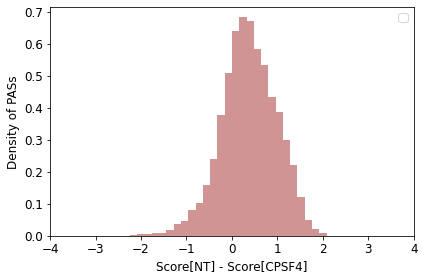

- Top 3 ISMs (positive) - 
Interpreting pattern 4597...
Gene = TECPR2
ID = chr14_102500177_+
Score[NT] - Score[CPSF4] = 1.771
Y[NT] - Y[CPSF4] = 0.4737
[Prox site]


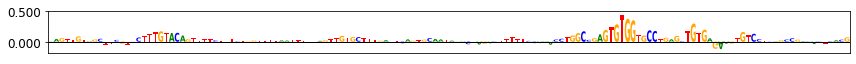

Interpreting pattern 6821...
Gene = FZR1
ID = chr19_3535006_+
Score[NT] - Score[CPSF4] = 1.6995
Y[NT] - Y[CPSF4] = 0.3662
[Prox site]


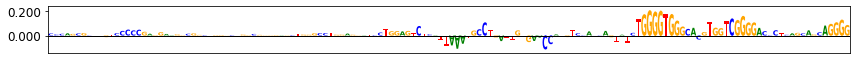

Interpreting pattern 9242...
Gene = C3orf62
ID = chr3_49270878_-
Score[NT] - Score[CPSF4] = 1.6169
Y[NT] - Y[CPSF4] = 0.3283
[Prox site]


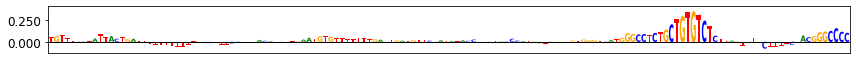

pwm_0_fwd
0.020912463999585844
0.467814100687466


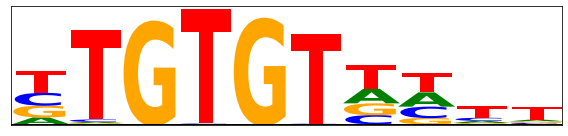

pwm_1_fwd
0.03156878426761557
0.44552655880535214


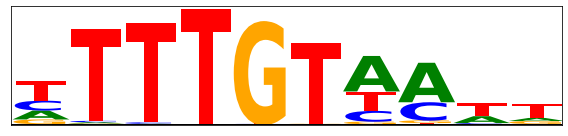

pwm_2_fwd
0.008684972790505383
0.42557124055546824


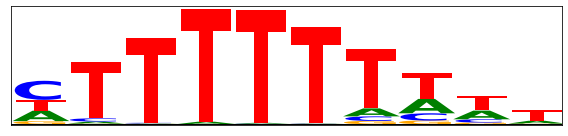


- Top 3 ISMs (negative) - 
Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[CPSF4] = -1.2476
Y[NT] - Y[CPSF4] = -0.5238
[Dist site]


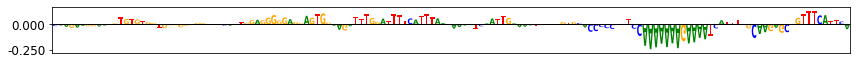

Interpreting pattern 12955...
Gene = SEMA3A
ID = chr7_83956987_-
Score[NT] - Score[CPSF4] = -1.8492
Y[NT] - Y[CPSF4] = -0.3016
[Dist site]


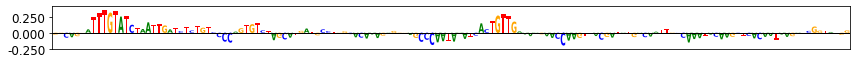

Interpreting pattern 13913...
Gene = FOXE1
ID = chr9_97858627_+
Score[NT] - Score[CPSF4] = -1.6934
Y[NT] - Y[CPSF4] = -0.297
[Dist site]


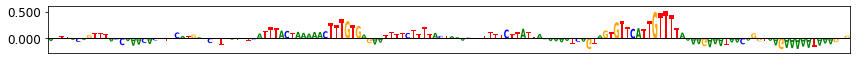

pwm_0_fwd
0.25481508000922287
0.5888304947891334


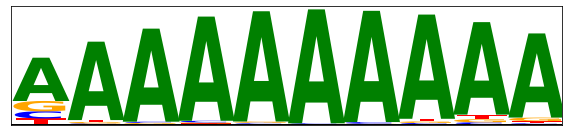

pwm_1_fwd
0.22401557023417767
0.3809063966067287


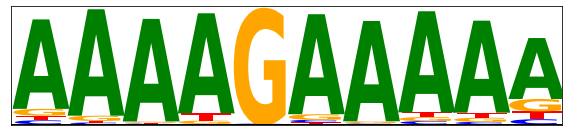

pwm_2_fwd
0.18940134292007774
0.3437168325147321


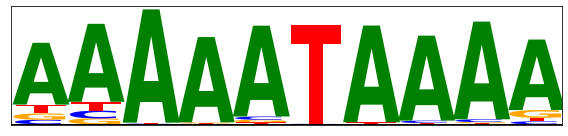

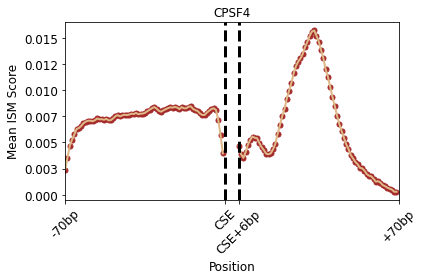

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = CPSF6


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


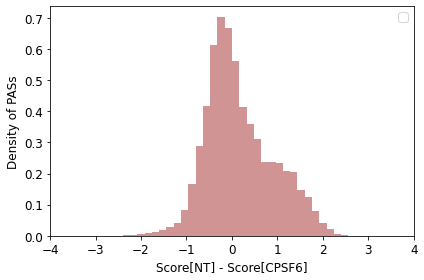

- Top 3 ISMs (positive) - 
Interpreting pattern 7336...
Gene = ATF2
ID = chr2_175072259_-
Score[NT] - Score[CPSF6] = 1.8834
Y[NT] - Y[CPSF6] = 0.6914
[Dist site]


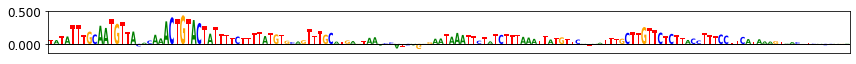

Interpreting pattern 1816...
Gene = GPAM
ID = chr10_112149865_-
Score[NT] - Score[CPSF6] = 2.0053
Y[NT] - Y[CPSF6] = 0.6713
[Dist site]


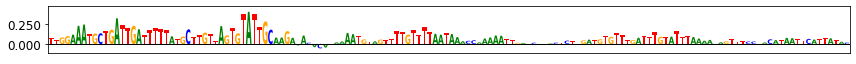

Interpreting pattern 14223...
Gene = TLE4
ID = chr9_79726740_+
Score[NT] - Score[CPSF6] = 1.8462
Y[NT] - Y[CPSF6] = 0.6657
[Dist site]


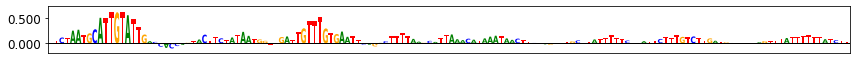

pwm_0_fwd
0.03527699437703979
0.46891654582505815


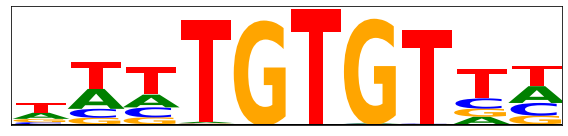

pwm_1_fwd
0.04532740487542988
0.46208831549398266


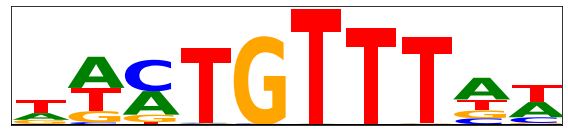

pwm_2_fwd
0.09910646638059928
0.5294434304330864


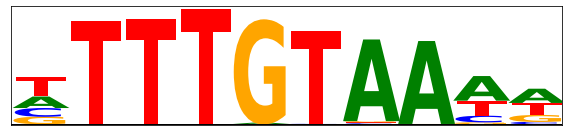


- Top 3 ISMs (negative) - 
Interpreting pattern 10453...
Gene = PCDH18
ID = chr4_137520868_-
Score[NT] - Score[CPSF6] = -1.1758
Y[NT] - Y[CPSF6] = -0.6298
[Prox site]


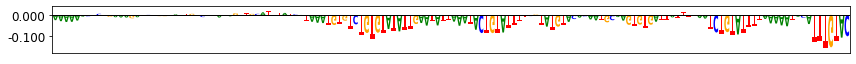

Interpreting pattern 7131...
Gene = ZNF529
ID = chr19_36543615_-
Score[NT] - Score[CPSF6] = -1.3088
Y[NT] - Y[CPSF6] = -0.3008
[Dist site]


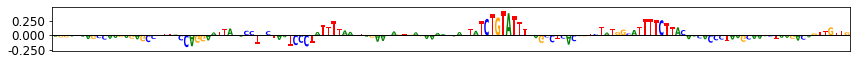

Interpreting pattern 2572...
Gene = KMT5B
ID = chr11_68156738_-
Score[NT] - Score[CPSF6] = -1.1684
Y[NT] - Y[CPSF6] = -0.2677
[Prox site]


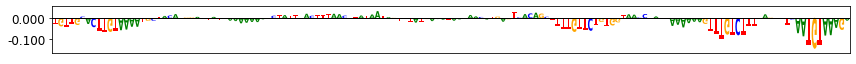

pwm_0_fwd
-0.020848457826243984
0.23358747749276687


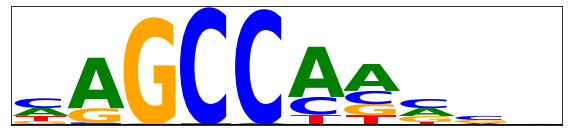

pwm_1_fwd
0.027826172388516934
0.21389997613299025


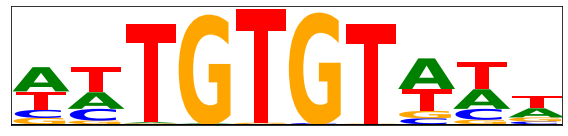

pwm_2_fwd
-0.011235538229466772
0.22258863860384795


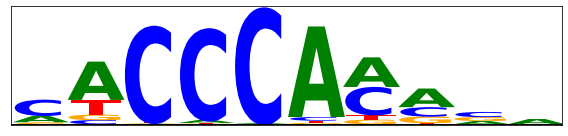

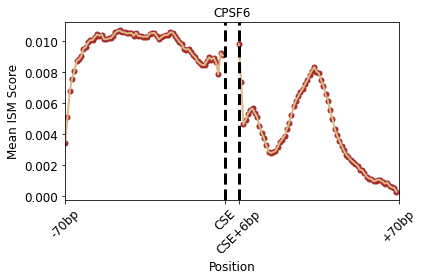

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = CSTF1


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


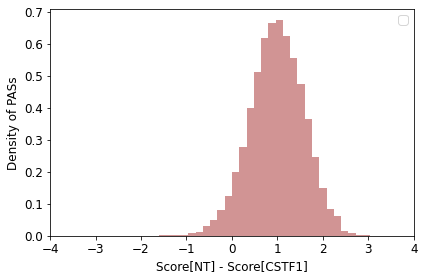

- Top 3 ISMs (positive) - 
Interpreting pattern 14419...
Gene = ENOX2
ID = chrX_130623901_-
Score[NT] - Score[CSTF1] = 2.3126
Y[NT] - Y[CSTF1] = 0.3115
[Prox site]


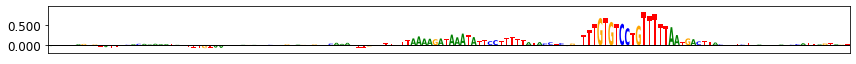

Interpreting pattern 13846...
Gene = CEP78
ID = chr9_78271684_+
Score[NT] - Score[CSTF1] = 2.2114
Y[NT] - Y[CSTF1] = 0.3038
[Prox site]


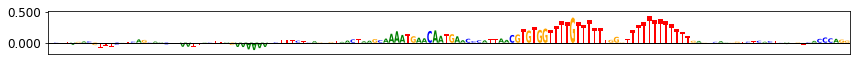

Interpreting pattern 14039...
Gene = NFX1
ID = chr9_33371157_+
Score[NT] - Score[CSTF1] = 2.5948
Y[NT] - Y[CSTF1] = 0.2901
[Dist site]


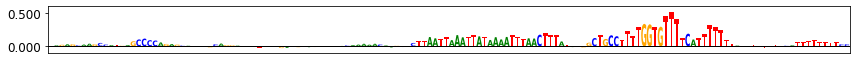

pwm_0_fwd
0.11472709873939321
0.6050500425511856


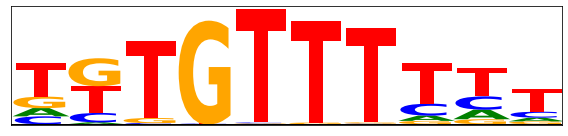

pwm_1_fwd
0.01834986737186818
0.5689791188799364


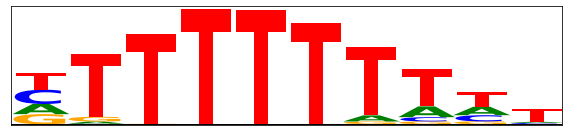

pwm_2_fwd
0.014101464410496367
0.6661030144511767


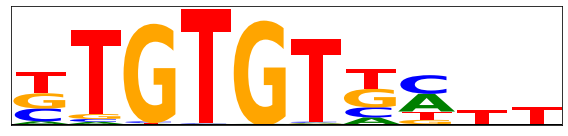


- Top 3 ISMs (negative) - 
Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[CSTF1] = -0.4009
Y[NT] - Y[CSTF1] = -0.5238
[Dist site]


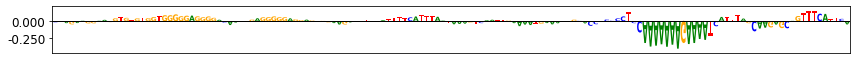

Interpreting pattern 12955...
Gene = SEMA3A
ID = chr7_83956987_-
Score[NT] - Score[CSTF1] = -1.4808
Y[NT] - Y[CSTF1] = -0.4016
[Dist site]


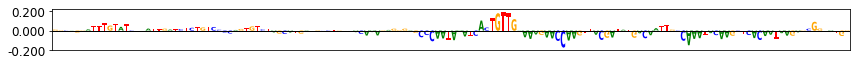

Interpreting pattern 5836...
Gene = DBF4B
ID = chr17_44752732_+
Score[NT] - Score[CSTF1] = -0.7909
Y[NT] - Y[CSTF1] = -0.3375
[Dist site]


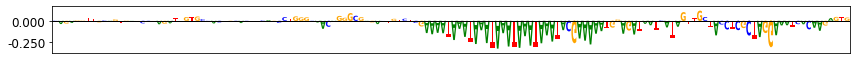

pwm_0_fwd
0.1760251001971844
0.5144476092402415


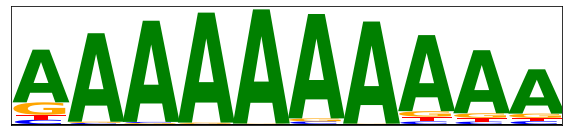

pwm_1_fwd
-0.09248471435189567
0.37884143419021543


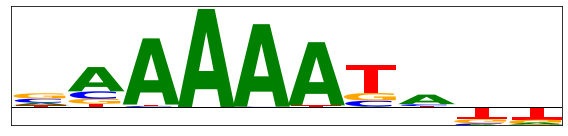

pwm_2_fwd
-0.235158582409816
0.36709558447795126


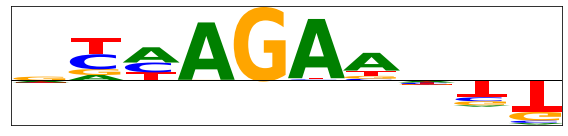

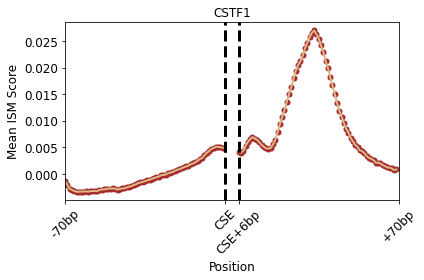

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = CSTF3


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


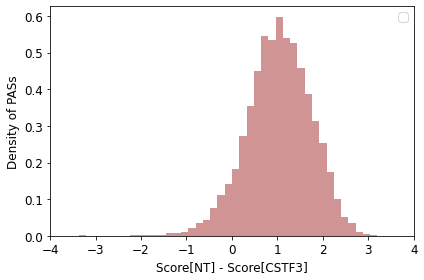

- Top 3 ISMs (positive) - 
Interpreting pattern 9588...
Gene = MSL2
ID = chr3_136149448_-
Score[NT] - Score[CSTF3] = 2.4709
Y[NT] - Y[CSTF3] = 0.3561
[Prox site]


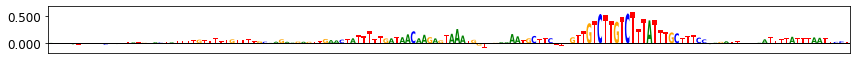

Interpreting pattern 13203...
Gene = CNOT7
ID = chr8_17229228_-
Score[NT] - Score[CSTF3] = 2.4126
Y[NT] - Y[CSTF3] = 0.3084
[Prox site]


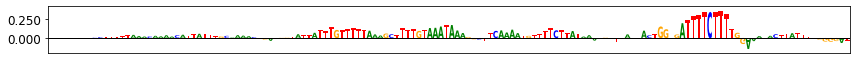

Interpreting pattern 10230...
Gene = FBXL5
ID = chr4_15605006_-
Score[NT] - Score[CSTF3] = 2.6975
Y[NT] - Y[CSTF3] = 0.3056
[Prox site]


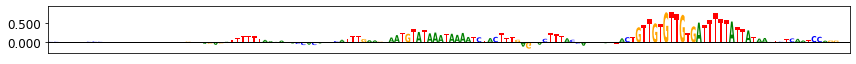

pwm_0_fwd
-0.006149573721270625
0.6474697044173491


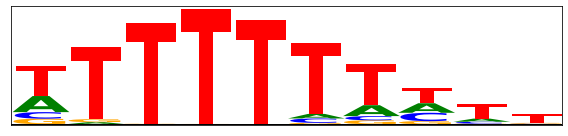

pwm_1_fwd
-0.004191326594331413
0.7194772632128432


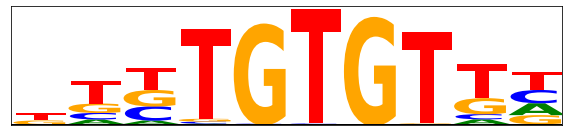

pwm_2_fwd
0.041199978535065414
0.6555658689242805


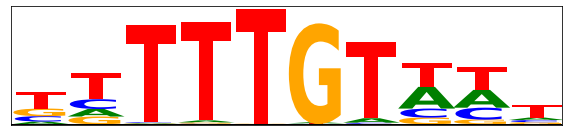


- Top 3 ISMs (negative) - 
Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[CSTF3] = -0.727
Y[NT] - Y[CSTF3] = -0.2571
[Dist site]


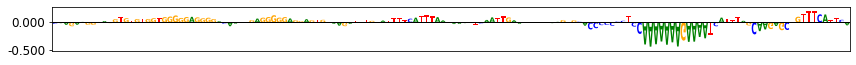

Interpreting pattern 10752...
Gene = WDR1
ID = chr4_10075149_-
Score[NT] - Score[CSTF3] = -0.8383
Y[NT] - Y[CSTF3] = -0.256
[Prox site]


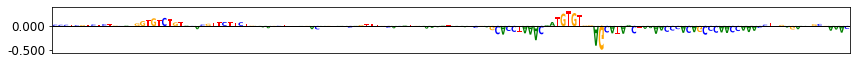

Interpreting pattern 3621...
Gene = SLC35E3
ID = chr12_68768443_+
Score[NT] - Score[CSTF3] = -0.5175
Y[NT] - Y[CSTF3] = -0.2508
[Dist site]


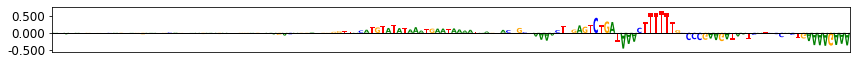

pwm_0_fwd
0.2900868049391513
0.6382884229667457


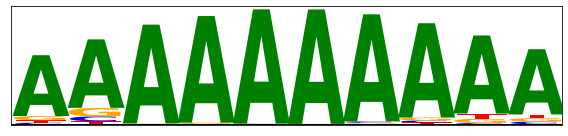

pwm_1_fwd
-0.08584503469002598
0.45442605348413484


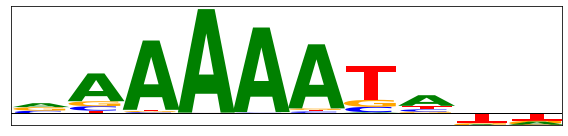

pwm_2_fwd
-0.022276916464821234
0.39061457504991626


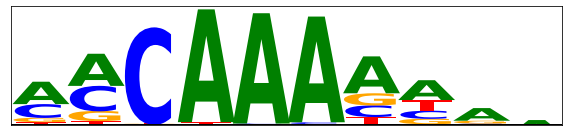

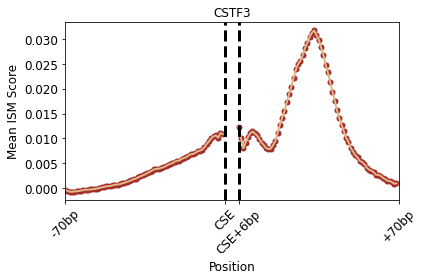

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = FIP1L1


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


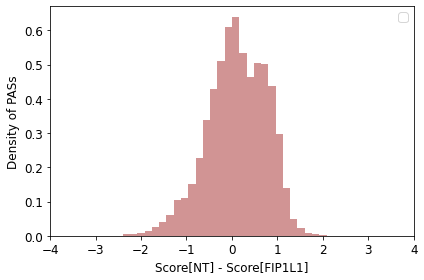

- Top 3 ISMs (positive) - 
Interpreting pattern 10055...
Gene = ADGRA3
ID = chr4_22387383_-
Score[NT] - Score[FIP1L1] = 1.3632
Y[NT] - Y[FIP1L1] = 0.4358
[Prox site]


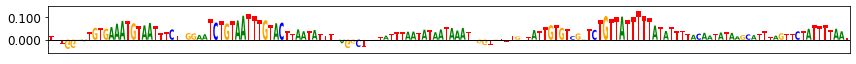

Interpreting pattern 6821...
Gene = FZR1
ID = chr19_3535006_+
Score[NT] - Score[FIP1L1] = 1.6337
Y[NT] - Y[FIP1L1] = 0.4048
[Prox site]


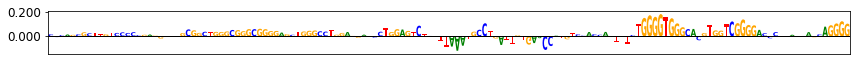

Interpreting pattern 13216...
Gene = CYHR1
ID = chr8_144449931_-
Score[NT] - Score[FIP1L1] = 1.2404
Y[NT] - Y[FIP1L1] = 0.3717
[Prox site]


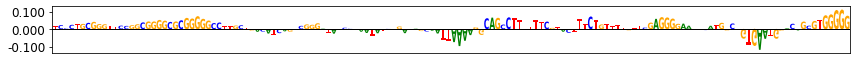

pwm_0_fwd
0.028904701530648974
0.4098891317397458


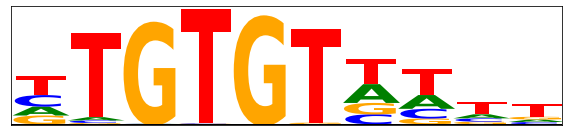

pwm_1_fwd
0.03458239587079813
0.434451317889496


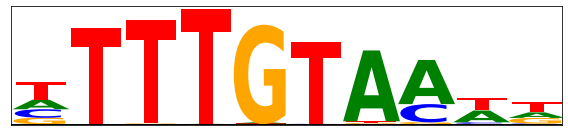

pwm_2_fwd
0.0833935598047768
0.4117446579584261


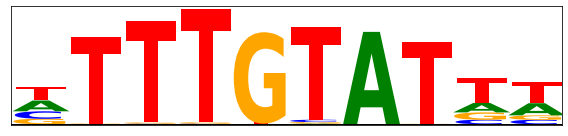


- Top 3 ISMs (negative) - 
Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[FIP1L1] = -1.5836
Y[NT] - Y[FIP1L1] = -0.8571
[Dist site]


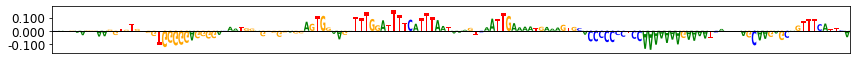

Interpreting pattern 1294...
Gene = TDRKH
ID = chr1_151768651_-
Score[NT] - Score[FIP1L1] = -2.1043
Y[NT] - Y[FIP1L1] = -0.4231
[Dist site]


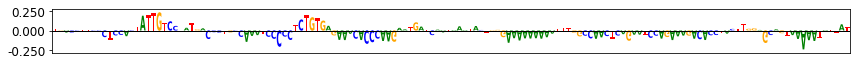

Interpreting pattern 2530...
Gene = FOSL1
ID = chr11_65890112_-
Score[NT] - Score[FIP1L1] = -1.3969
Y[NT] - Y[FIP1L1] = -0.4084
[Dist site]


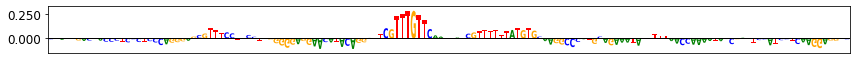

pwm_0_fwd
0.21962951943413045
0.4963157163175062


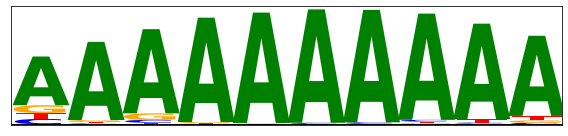

pwm_1_fwd
0.14927336234110075
0.2897286294418131


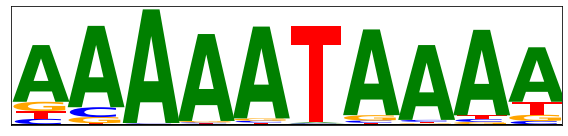

pwm_2_fwd
0.11610666285919888
0.3076029894172504


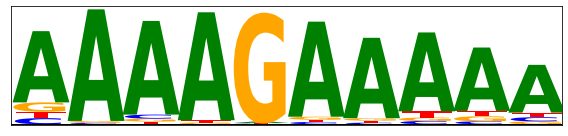

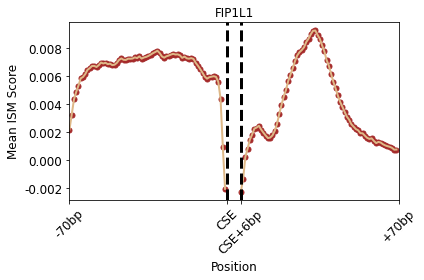

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = NUDT21


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


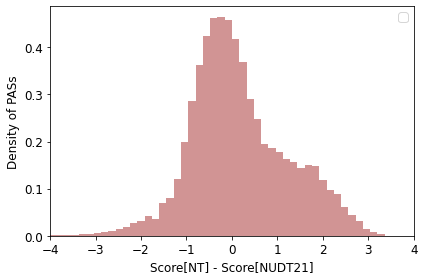

- Top 3 ISMs (positive) - 
Interpreting pattern 1816...
Gene = GPAM
ID = chr10_112149865_-
Score[NT] - Score[NUDT21] = 2.6779
Y[NT] - Y[NUDT21] = 0.8355
[Dist site]


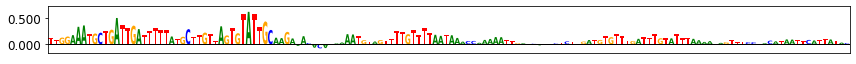

Interpreting pattern 9875...
Gene = SNX4
ID = chr3_125446650_-
Score[NT] - Score[NUDT21] = 2.5116
Y[NT] - Y[NUDT21] = 0.776
[Dist site]


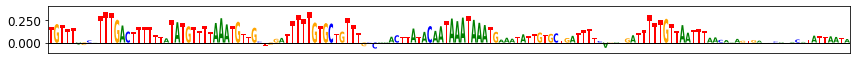

Interpreting pattern 9191...
Gene = ARL13B
ID = chr3_94055279_+
Score[NT] - Score[NUDT21] = 2.6044
Y[NT] - Y[NUDT21] = 0.7096
[Dist site]


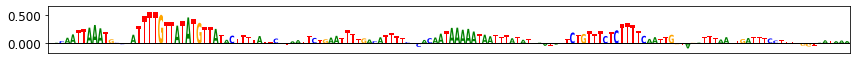

pwm_0_fwd
0.04385085988817666
0.7853355666943024


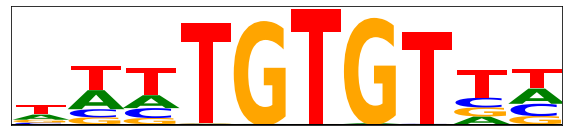

pwm_1_fwd
0.029029213973920637
0.7422860822448991


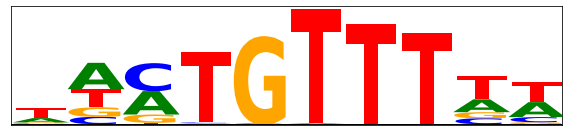

pwm_2_fwd
0.010113441256376407
0.7925581115942735


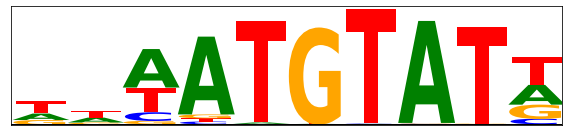


- Top 3 ISMs (negative) - 
Interpreting pattern 7131...
Gene = ZNF529
ID = chr19_36543615_-
Score[NT] - Score[NUDT21] = -2.4728
Y[NT] - Y[NUDT21] = -0.4407
[Dist site]


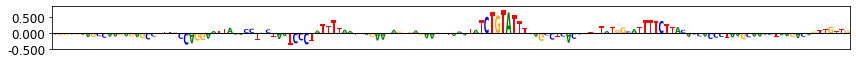

Interpreting pattern 14356...
Gene = BCOR
ID = chrX_40049815_-
Score[NT] - Score[NUDT21] = -2.3952
Y[NT] - Y[NUDT21] = -0.3663
[Dist site]


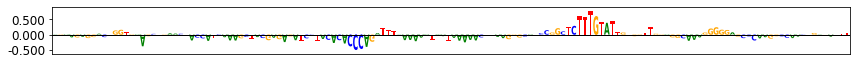

Interpreting pattern 5403...
Gene = HAGH
ID = chr16_1799787_-
Score[NT] - Score[NUDT21] = -2.3117
Y[NT] - Y[NUDT21] = -0.2647
[Dist site]


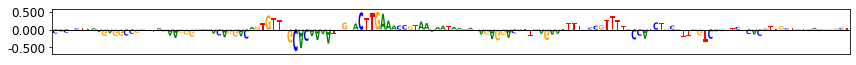

pwm_0_fwd
-0.07331365968199337
0.4165315681766061


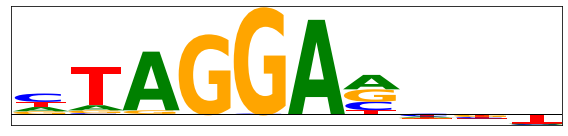

pwm_1_fwd
-0.12301177058728215
0.39318566636990776


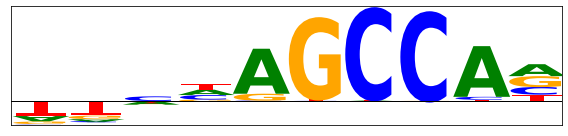

pwm_2_fwd
-0.0705237217057528
0.4307497112339009


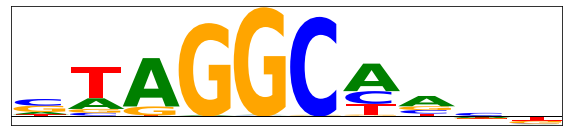

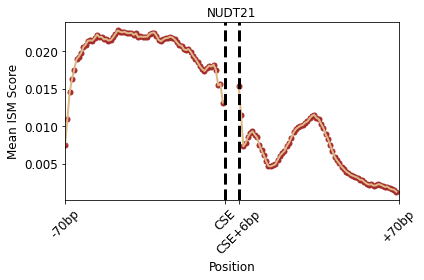

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = RBBP6


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


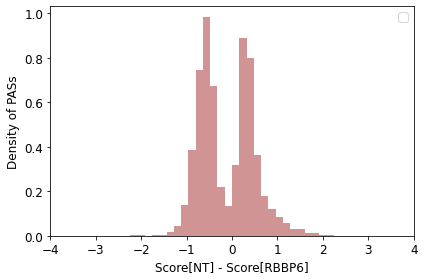

- Top 3 ISMs (positive) - 
Interpreting pattern 6242...
Gene = SAMD14
ID = chr17_50112671_-
Score[NT] - Score[RBBP6] = 1.3947
Y[NT] - Y[RBBP6] = 0.5714
[Prox site]


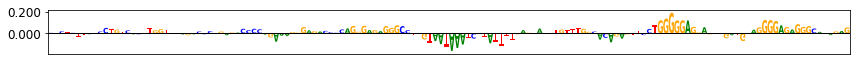

Interpreting pattern 11246...
Gene = N4BP3
ID = chr5_178122406_+
Score[NT] - Score[RBBP6] = 1.3366
Y[NT] - Y[RBBP6] = 0.4636
[Prox site]


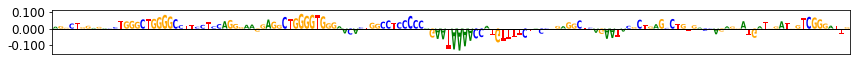

Interpreting pattern 2821...
Gene = SYT7
ID = chr11_61515313_-
Score[NT] - Score[RBBP6] = 1.404
Y[NT] - Y[RBBP6] = 0.4338
[Prox site]


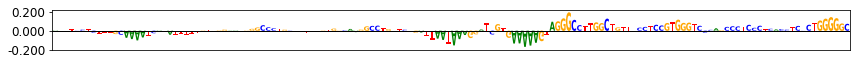

pwm_0_fwd
0.018761024128172786
0.14632640099008754


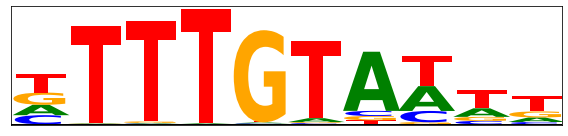

pwm_1_fwd
-0.006702720947265625
0.13250052635192872


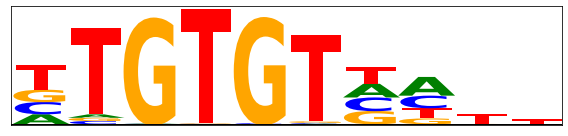

pwm_2_fwd
0.0779161167310057
0.13837569805323768


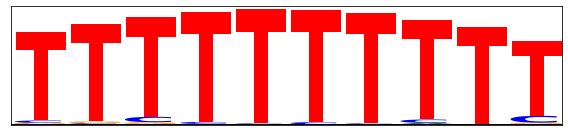


- Top 3 ISMs (negative) - 
Interpreting pattern 5823...
Gene = CTC1
ID = chr17_8224821_-
Score[NT] - Score[RBBP6] = -1.27
Y[NT] - Y[RBBP6] = -0.3941
[Dist site]


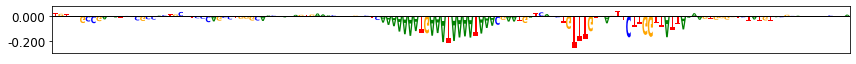

Interpreting pattern 6757...
Gene = CEP89
ID = chr19_32875925_-
Score[NT] - Score[RBBP6] = -1.0789
Y[NT] - Y[RBBP6] = -0.3052
[Dist site]


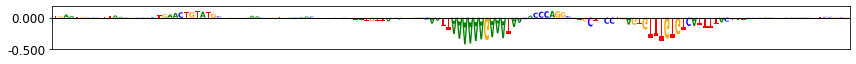

Interpreting pattern 7328...
Gene = ASB1
ID = chr2_238452250_+
Score[NT] - Score[RBBP6] = -1.1257
Y[NT] - Y[RBBP6] = -0.2973
[Dist site]


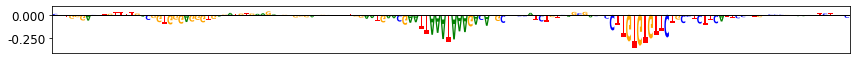

pwm_0_fwd
0.13480945639157396
0.35404905689231575


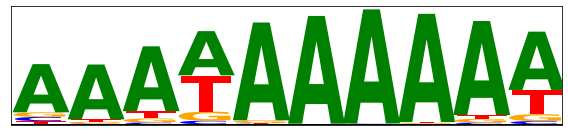

pwm_1_fwd
0.21047062368496608
0.3584312352149383


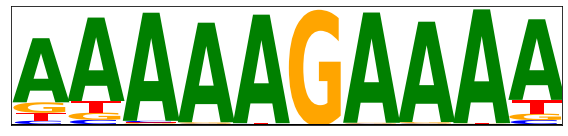

pwm_2_fwd
0.03315207220740237
0.22744659084384725


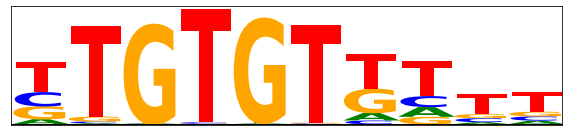

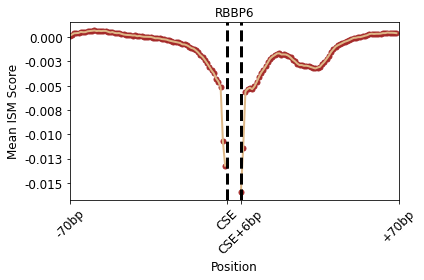

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = SRSF3


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


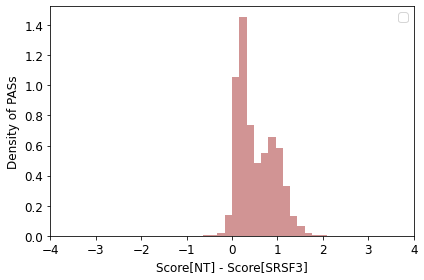

- Top 3 ISMs (positive) - 
Interpreting pattern 4336...
Gene = GPR137C
ID = chr14_52637713_+
Score[NT] - Score[SRSF3] = 1.5192
Y[NT] - Y[SRSF3] = 0.6512
[Dist site]


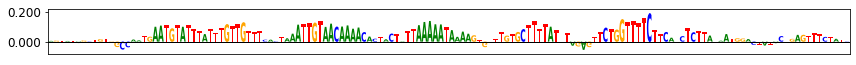

Interpreting pattern 2379...
Gene = CDC42BPG
ID = chr11_64823051_-
Score[NT] - Score[SRSF3] = 2.0173
Y[NT] - Y[SRSF3] = 0.5439
[Dist site]


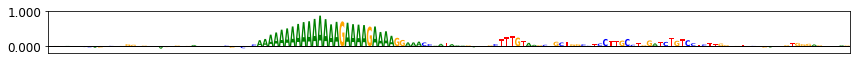

Interpreting pattern 12707...
Gene = FOXK1
ID = chr7_4771442_+
Score[NT] - Score[SRSF3] = 1.4405
Y[NT] - Y[SRSF3] = 0.4466
[Dist site]


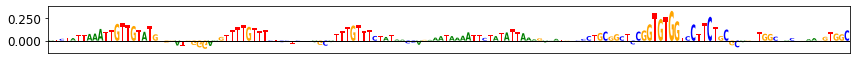

pwm_0_fwd
0.029153253723913277
0.295612275881459


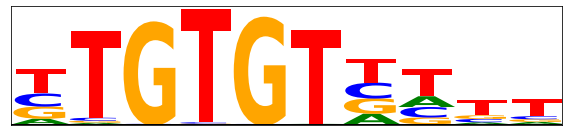

pwm_1_fwd
0.18460866207786464
0.39960746387443924


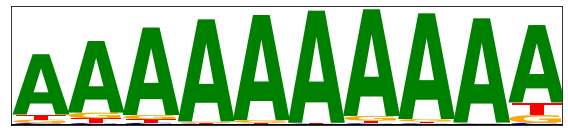

pwm_2_fwd
0.04938855781625949
0.2578888951515665


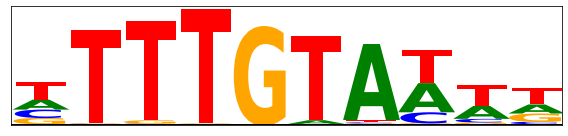


- Top 3 ISMs (negative) - 
Interpreting pattern 2375...
Gene = CD44
ID = chr11_35232398_+
Score[NT] - Score[SRSF3] = -0.0544
Y[NT] - Y[SRSF3] = -0.7722
[Dist site]


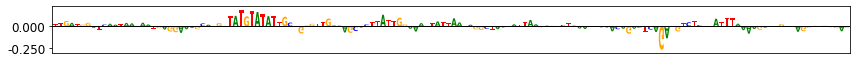

Interpreting pattern 13355...
Gene = KCNV1
ID = chr8_109967001_-
Score[NT] - Score[SRSF3] = -0.1334
Y[NT] - Y[SRSF3] = -0.5366
[Dist site]


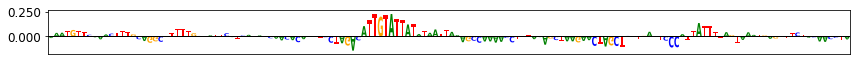

Interpreting pattern 4544...
Gene = SAMD15
ID = chr14_77392163_+
Score[NT] - Score[SRSF3] = -0.1675
Y[NT] - Y[SRSF3] = -0.5163
[Dist site]


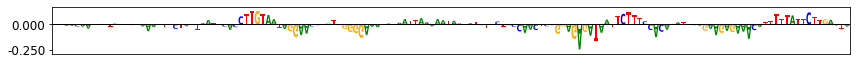

pwm_0_fwd
-0.0016013253379512492
0.1342228786365406


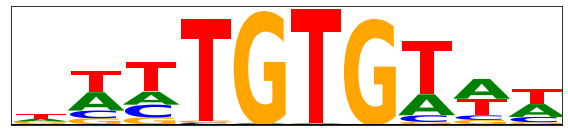

pwm_1_fwd
0.015016808880477392
0.15569119879177637


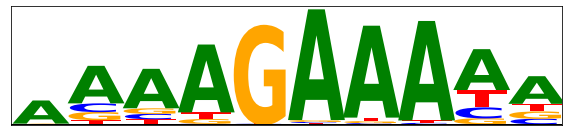

pwm_2_fwd
0.01741735627696772
0.15083421472531217


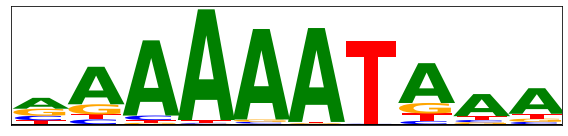

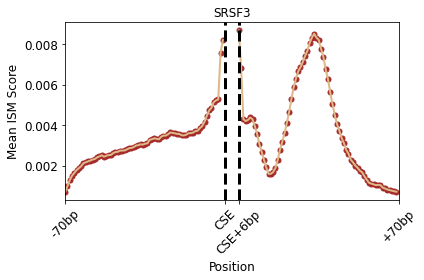

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = SYMPK


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


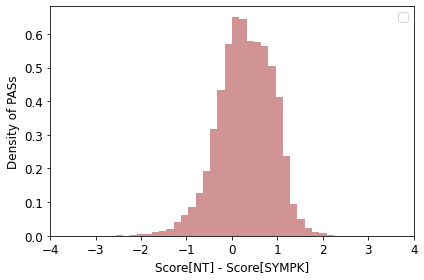

- Top 3 ISMs (positive) - 
Interpreting pattern 6242...
Gene = SAMD14
ID = chr17_50112671_-
Score[NT] - Score[SYMPK] = 1.4421
Y[NT] - Y[SYMPK] = 0.7143
[Prox site]


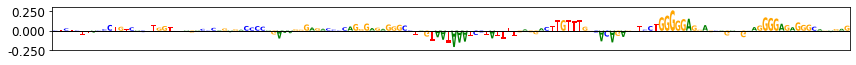

Interpreting pattern 2590...
Gene = MAP4K2
ID = chr11_64789137_-
Score[NT] - Score[SYMPK] = 1.4076
Y[NT] - Y[SYMPK] = 0.575
[Prox site]


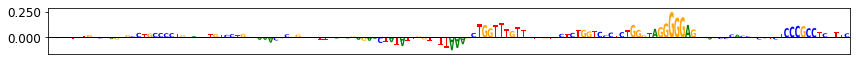

Interpreting pattern 4597...
Gene = TECPR2
ID = chr14_102500177_+
Score[NT] - Score[SYMPK] = 1.4443
Y[NT] - Y[SYMPK] = 0.4867
[Prox site]


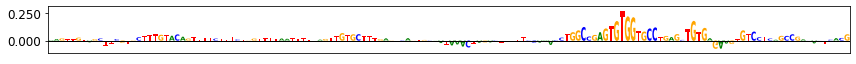

pwm_0_fwd
0.019867907358624634
0.34575087177102565


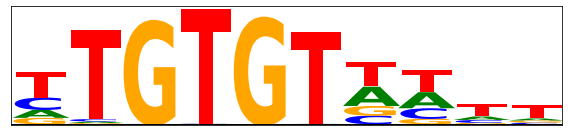

pwm_1_fwd
-0.01417801877427282
0.3339413905516267


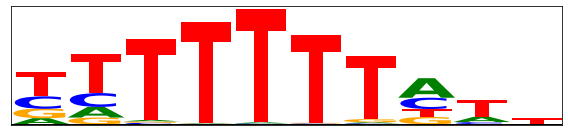

pwm_2_fwd
0.017649275942607213
0.3273507871714844


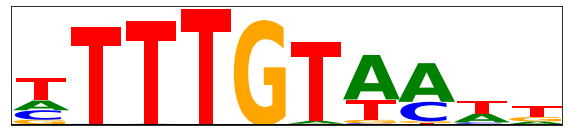


- Top 3 ISMs (negative) - 
Interpreting pattern 3727...
Gene = TMEM120B
ID = chr12_121782998_+
Score[NT] - Score[SYMPK] = -2.2524
Y[NT] - Y[SYMPK] = -0.5274
[Dist site]


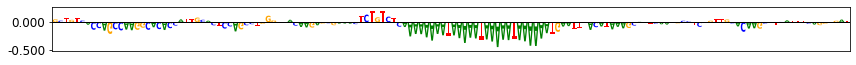

Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[SYMPK] = -1.3572
Y[NT] - Y[SYMPK] = -0.5238
[Dist site]


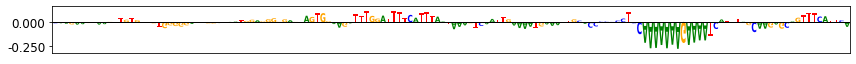

Interpreting pattern 11563...
Gene = TMCO6
ID = chr5_140645806_+
Score[NT] - Score[SYMPK] = -1.1312
Y[NT] - Y[SYMPK] = -0.3756
[Dist site]


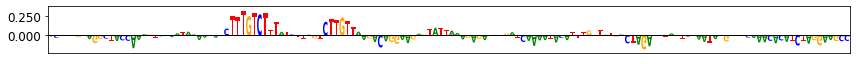

pwm_0_fwd
0.27207837655517086
0.5432237084298683


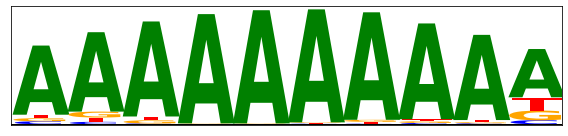

pwm_1_fwd
0.1295062731691852
0.3548757963087802


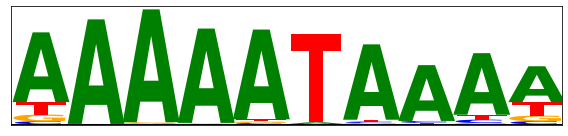

pwm_2_fwd
0.28546991363788643
0.45467409916842977


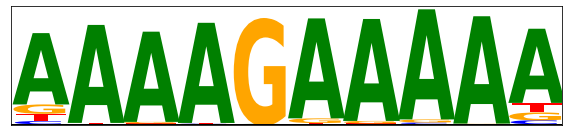

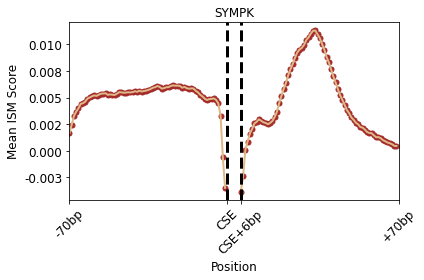

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cell_type_2_ix = THOC5


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


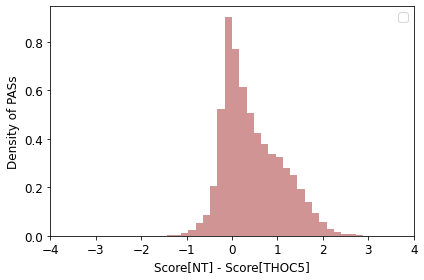

- Top 3 ISMs (positive) - 
Interpreting pattern 9842...
Gene = SKIL
ID = chr3_170396835_+
Score[NT] - Score[THOC5] = 2.1885
Y[NT] - Y[THOC5] = 0.4077
[Dist site]


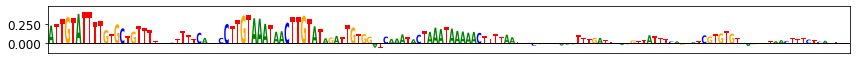

Interpreting pattern 8946...
Gene = GRAMD4
ID = chr22_46679785_+
Score[NT] - Score[THOC5] = 2.2569
Y[NT] - Y[THOC5] = 0.4048
[Dist site]


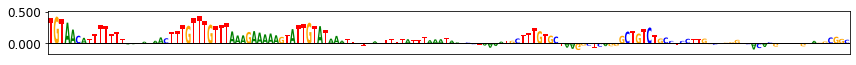

Interpreting pattern 7833...
Gene = MXD1
ID = chr2_69942945_+
Score[NT] - Score[THOC5] = 2.0818
Y[NT] - Y[THOC5] = 0.3958
[Dist site]


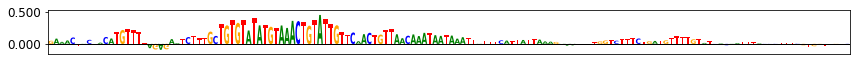

pwm_0_fwd
0.07147362437741508
0.3744298408771384


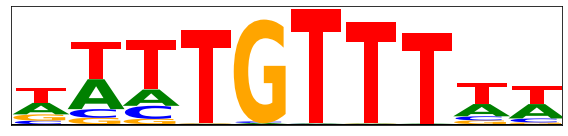

pwm_1_fwd
0.03894844464024596
0.4418956131834056


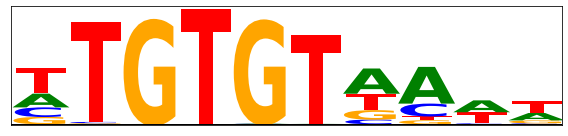

pwm_2_fwd
0.07717248598734536
0.4197437498304579


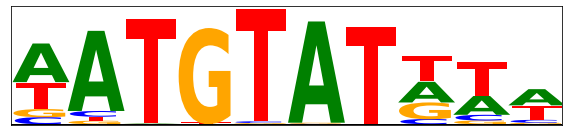


- Top 3 ISMs (negative) - 
Interpreting pattern 1385...
Gene = TTC4
ID = chr1_54742988_+
Score[NT] - Score[THOC5] = -0.7102
Y[NT] - Y[THOC5] = -0.4028
[Dist site]


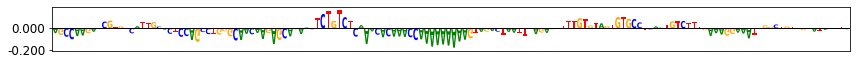

Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[THOC5] = -0.6089
Y[NT] - Y[THOC5] = -0.3571
[Dist site]


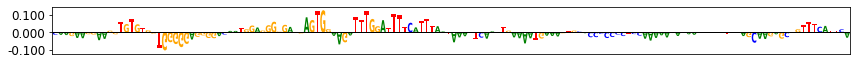

Interpreting pattern 7134...
Gene = ZNF540
ID = chr19_37614095_+
Score[NT] - Score[THOC5] = -0.7677
Y[NT] - Y[THOC5] = -0.2996
[Dist site]


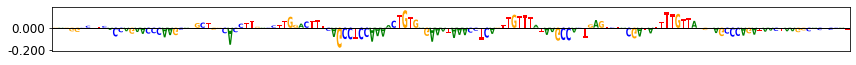

pwm_0_fwd
0.14532308651352577
0.30684552346506433


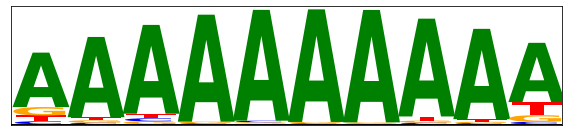

pwm_1_fwd
0.024684576710835716
0.17126459137554642


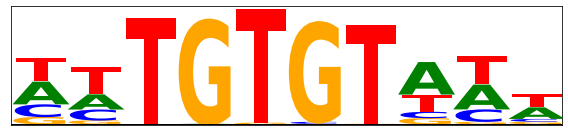

pwm_2_fwd
0.09716203081855435
0.20687808650891223


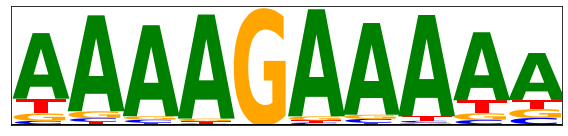

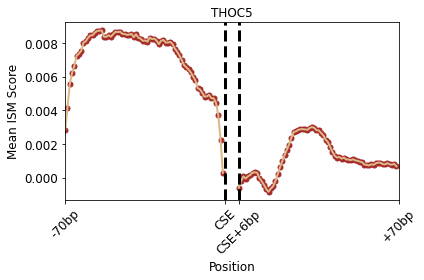

In [16]:
#Run interpretation pipeline for selected cell types

cell_type_2_index = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

for cell_type_2_ix in cell_type_2_index :

    print("cell_type_2_ix = " + str(subset_cell_types[cell_type_2_ix]))
    
    _print_interpretation(cell_type_2_ix=cell_type_2_ix, modisco_suffix='', save_figs=True, fig_name='apa_perturb_10_figures/apa_perturb_10')


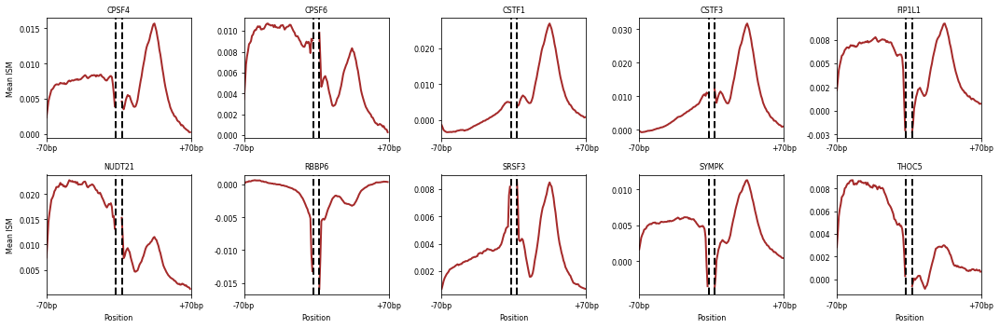

In [17]:
from matplotlib.ticker import FormatStrFormatter

#Plot Average ISM score by position in multi-panel plot

save_figs=True
fig_name='apa_perturb_10_figures/apa_perturb_10'

#Params
cell_type_1_ix = 0

seq_start = 0
seq_end = 146

cse_end = 76

cell_type_index = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
score_ixs = [0, 2]

n_rows = 2
n_cols = 5

f, axs = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 2.5 * n_rows))

flat_mask_merged = np.max(np.concatenate([flat_masks[k][None, :] for k in range(len(flat_masks))], axis=0)[score_ixs, :], axis=0)

for plot_i, cell_type_2_ix in enumerate(cell_type_index) :
    
    #Plot mean importance score across position
    mean_scores_curr = np.mean(flat_scores_merged[cell_type_1_ix, flat_mask_merged == 1., 0, :146, :] - flat_scores_merged[cell_type_2_ix, flat_mask_merged == 1., 0, :146, :], axis=(0, 2))
    
    row = plot_i // n_cols
    col = plot_i % n_cols
    
    axs[row, col].plot(np.arange(mean_scores_curr.shape[0])[:70], mean_scores_curr[:70], color='brown', linewidth=2)
    axs[row, col].plot(np.arange(mean_scores_curr.shape[0])[cse_end:146], mean_scores_curr[cse_end:146], color='brown', linewidth=2)

    #axs[row, col].scatter(np.arange(mean_scores_curr.shape[0])[:70], mean_scores_curr[:70], color='brown', s=25)
    #axs[row, col].scatter(np.arange(mean_scores_curr.shape[0])[cse_end:146], mean_scores_curr[cse_end:146], color='brown', s=25)

    plt.sca(axs[row, col])
    
    plt.axvline(x=70, color='black', linewidth=2, linestyle='--')
    plt.axvline(x=76, color='black', linewidth=2, linestyle='--')

    plt.xlim(0, 145)
    #plt.ylim(0.)

    axs[row, col].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    
    plt.xticks([0, 146], ["-70bp", "+70bp"], fontsize=8)
    plt.yticks(fontsize=8)

    if row == n_rows - 1 :
        plt.xlabel("Position", fontsize=8)
    
    if col == 0 :
        plt.ylabel("Mean ISM", fontsize=8)

    plt.title(str(subset_cell_types[cell_type_2_ix]), fontsize=8)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism_scores.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism_scores.eps")

plt.show()


cell_type_2_ix = CPSF4


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


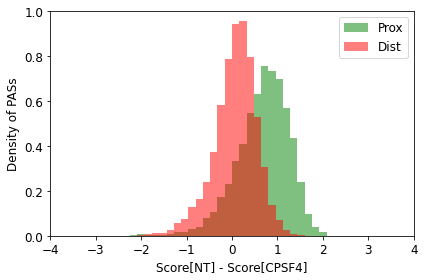

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 4597...
Gene = TECPR2
ID = chr14_102500177_+
Score[NT] - Score[CPSF4] = 1.771
Y[NT] - Y[CPSF4] = 0.4737
[Prox site]


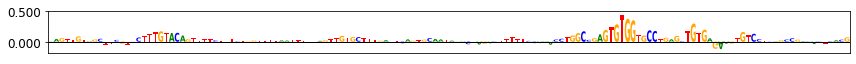

Interpreting pattern 6821...
Gene = FZR1
ID = chr19_3535006_+
Score[NT] - Score[CPSF4] = 1.6995
Y[NT] - Y[CPSF4] = 0.3662
[Prox site]


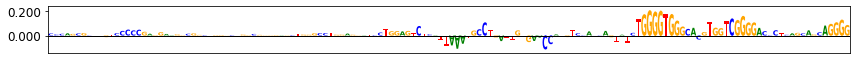

Interpreting pattern 10680...
Gene = TMEM131L
ID = chr4_153636711_+
Score[NT] - Score[CPSF4] = 1.7248
Y[NT] - Y[CPSF4] = 0.3
[Prox site]


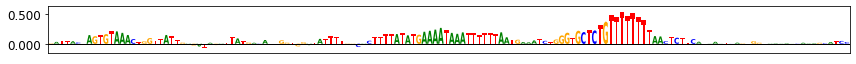

pwm_0_fwd
0.016348423046495003
0.403080965008975


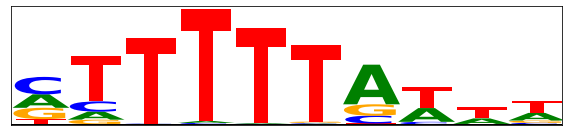

pwm_1_fwd
0.020824646271911322
0.4405266194717557


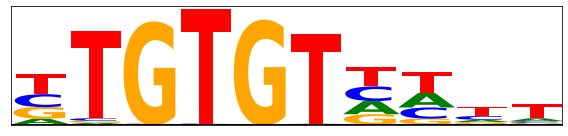

pwm_2_fwd
0.037488073701700875
0.42212294340133666


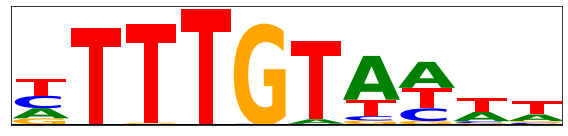


- Top 3 ISMs (negative) - 
Interpreting pattern 8647...
Gene = SALL4
ID = chr20_51784038_-
Score[NT] - Score[CPSF4] = -0.8627
Y[NT] - Y[CPSF4] = -0.4118
[Prox site]


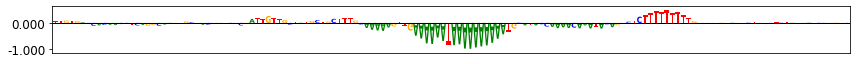

Interpreting pattern 8431...
Gene = CBFA2T2
ID = chr20_33645290_+
Score[NT] - Score[CPSF4] = -0.7517
Y[NT] - Y[CPSF4] = -0.2611
[Prox site]


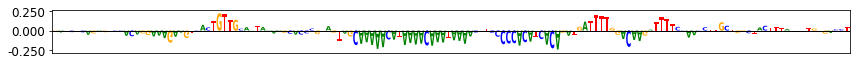

Interpreting pattern 2242...
Gene = VTI1A
ID = chr10_112817968_+
Score[NT] - Score[CPSF4] = -0.7837
Y[NT] - Y[CPSF4] = -0.2576
[Prox site]


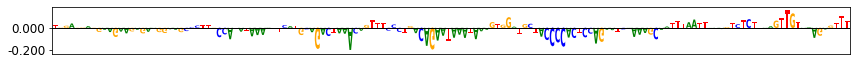

pwm_0_fwd
0.4206399893336017
0.7255048873163664


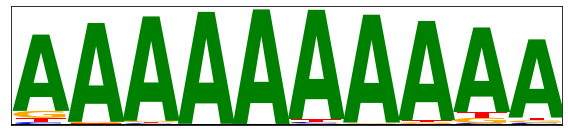

pwm_1_fwd
0.16483630326848045
0.33777688618364005


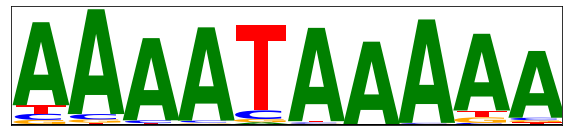

pwm_2_fwd
0.30339653388313625
0.5014257581337639


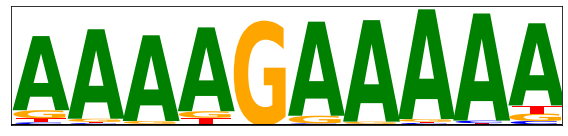

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 918...
Gene = PLEKHA6
ID = chr1_204218853_-
Score[NT] - Score[CPSF4] = 1.0694
Y[NT] - Y[CPSF4] = 0.5455
[Dist site]


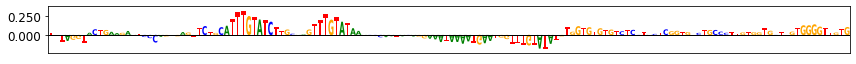

Interpreting pattern 10415...
Gene = NKX3-2
ID = chr4_13540830_-
Score[NT] - Score[CPSF4] = 1.355
Y[NT] - Y[CPSF4] = 0.4022
[Dist site]


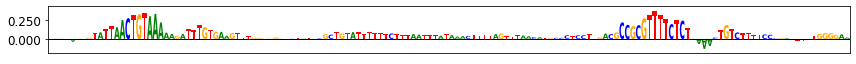

Interpreting pattern 944...
Gene = PRDM16
ID = chr1_3438621_+
Score[NT] - Score[CPSF4] = 1.1248
Y[NT] - Y[CPSF4] = 0.2911
[Dist site]


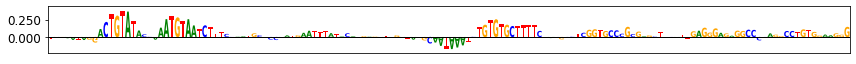

pwm_0_fwd
0.04916266223479961
0.3526078914773875


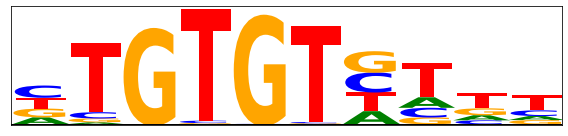

pwm_1_fwd
0.013969225548093833
0.3232236343057148


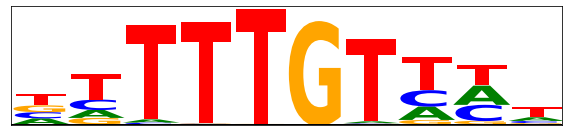

pwm_2_fwd
0.0519779540243603
0.3354447864350818


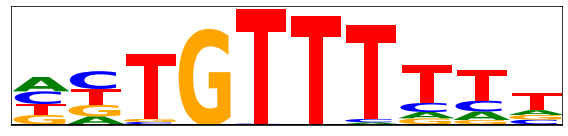


- Top 3 ISMs (negative) - 
Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[CPSF4] = -1.2476
Y[NT] - Y[CPSF4] = -0.5238
[Dist site]


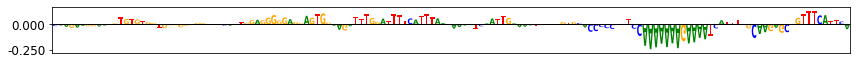

Interpreting pattern 12955...
Gene = SEMA3A
ID = chr7_83956987_-
Score[NT] - Score[CPSF4] = -1.8492
Y[NT] - Y[CPSF4] = -0.3016
[Dist site]


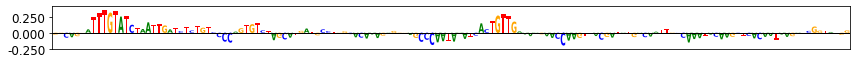

Interpreting pattern 13913...
Gene = FOXE1
ID = chr9_97858627_+
Score[NT] - Score[CPSF4] = -1.6934
Y[NT] - Y[CPSF4] = -0.297
[Dist site]


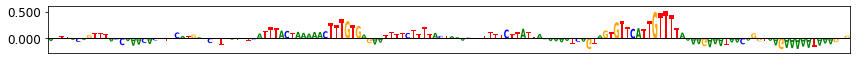

pwm_0_fwd
0.12262642494619708
0.3256101267305139


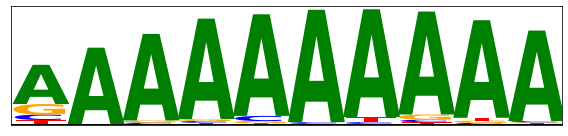

pwm_1_fwd
-0.044938614016853715
0.23380873582330167


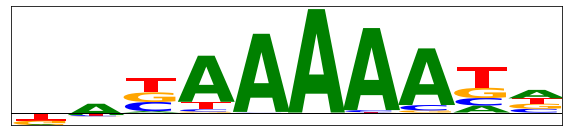

pwm_2_fwd
0.08043540766744903
0.21217862606048582


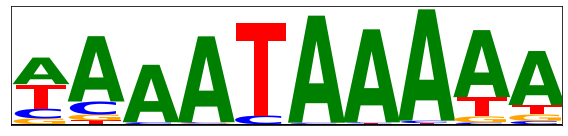

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


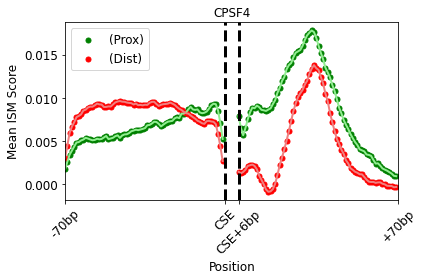

cell_type_2_ix = CPSF6


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


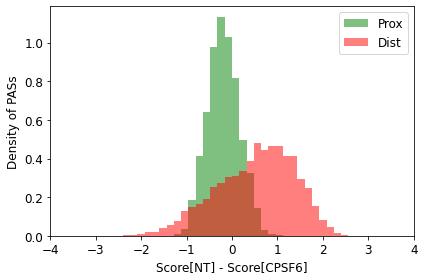

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 2668...
Gene = PEX16
ID = chr11_45910176_-
Score[NT] - Score[CPSF6] = 0.5715
Y[NT] - Y[CPSF6] = 0.1767
[Prox site]


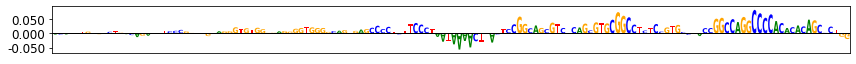

Interpreting pattern 8157...
Gene = SNORC
ID = chr2_232876401_+
Score[NT] - Score[CPSF6] = 0.6529
Y[NT] - Y[CPSF6] = 0.1056
[Prox site]


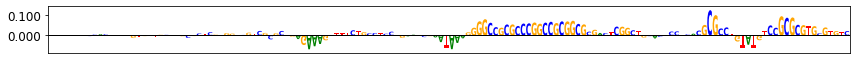

Interpreting pattern 3634...
Gene = SLC48A1
ID = chr12_47781670_+
Score[NT] - Score[CPSF6] = 0.5561
Y[NT] - Y[CPSF6] = 0.0962
[Prox site]


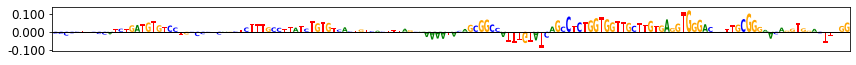

pwm_0_fwd
0.06663700450747825
0.1359760084221706


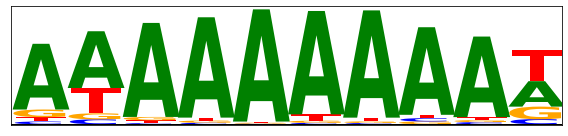

pwm_1_fwd
0.031311125598819094
0.12355082985517142


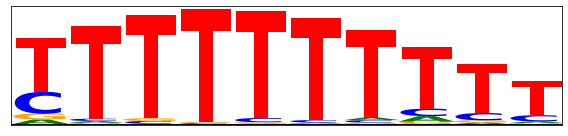

pwm_2_fwd
0.056887853409336726
0.11782421532985383


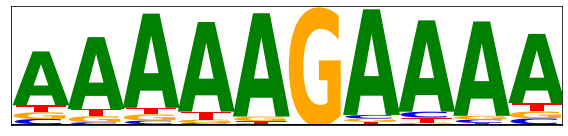


- Top 3 ISMs (negative) - 
Interpreting pattern 4897...
Gene = IREB2
ID = chr15_78498452_+
Score[NT] - Score[CPSF6] = -0.9223
Y[NT] - Y[CPSF6] = -0.6585
[Prox site]


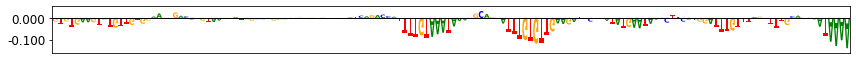

Interpreting pattern 7840...
Gene = NAB1
ID = chr2_190690698_+
Score[NT] - Score[CPSF6] = -1.0517
Y[NT] - Y[CPSF6] = -0.6416
[Prox site]


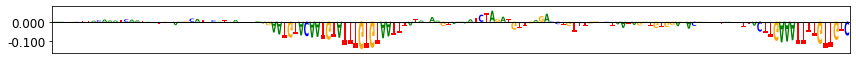

Interpreting pattern 13207...
Gene = CPNE3
ID = chr8_86558661_+
Score[NT] - Score[CPSF6] = -0.9064
Y[NT] - Y[CPSF6] = -0.64
[Prox site]


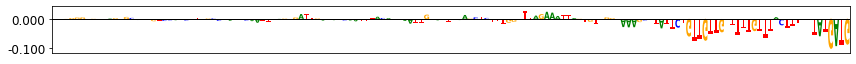

pwm_0_fwd
0.02392733298042268
0.20868021322849611


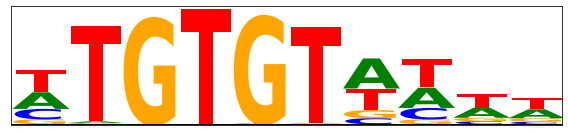

pwm_1_fwd
0.04667227829203886
0.19858620191527898


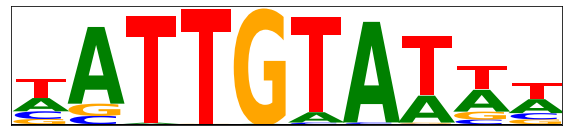

pwm_2_fwd
0.028727311773348578
0.20781000495562096


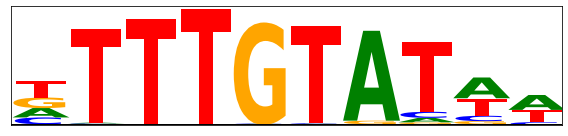

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 1816...
Gene = GPAM
ID = chr10_112149865_-
Score[NT] - Score[CPSF6] = 2.0053
Y[NT] - Y[CPSF6] = 0.6713
[Dist site]


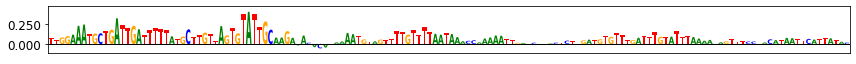

Interpreting pattern 13208...
Gene = CPNE3
ID = chr8_86561413_+
Score[NT] - Score[CPSF6] = 1.9496
Y[NT] - Y[CPSF6] = 0.64
[Dist site]


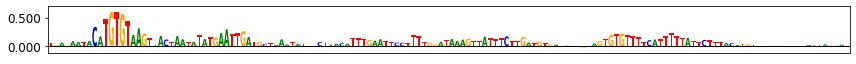

Interpreting pattern 1996...
Gene = OTUD1
ID = chr10_23442179_+
Score[NT] - Score[CPSF6] = 2.1407
Y[NT] - Y[CPSF6] = 0.5225
[Dist site]


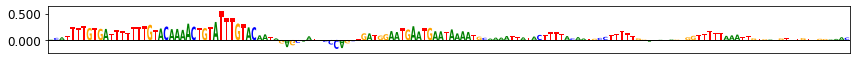

pwm_0_fwd
0.10311685705606916
0.5002760400462642


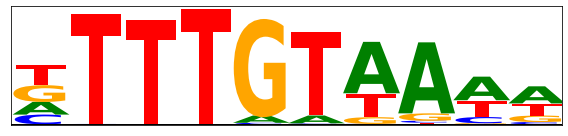

pwm_1_fwd
0.1251638287630948
0.5179175415039063


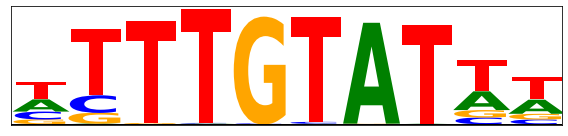

pwm_2_fwd
0.08086958591293236
0.5317496821565448


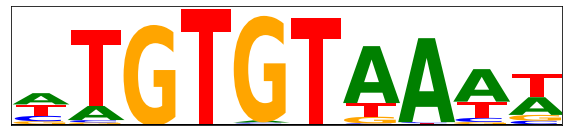


- Top 3 ISMs (negative) - 
Interpreting pattern 5614...
Gene = TEPP
ID = chr16_57988116_+
Score[NT] - Score[CPSF6] = -1.8882
Y[NT] - Y[CPSF6] = -0.1184
[Dist site]


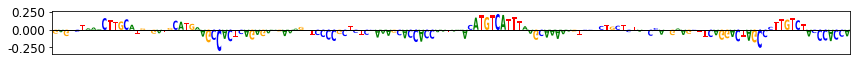

Interpreting pattern 3727...
Gene = TMEM120B
ID = chr12_121782998_+
Score[NT] - Score[CPSF6] = -1.9563
Y[NT] - Y[CPSF6] = -0.1145
[Dist site]


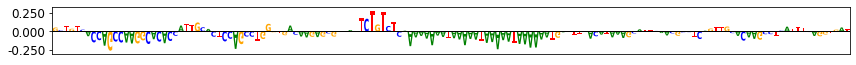

Interpreting pattern 5564...
Gene = SEZ6L2
ID = chr16_29871159_-
Score[NT] - Score[CPSF6] = -1.8351
Y[NT] - Y[CPSF6] = -0.0816
[Dist site]


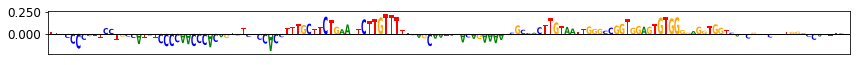

pwm_0_fwd
-0.05097367610976594
0.23418476429030793


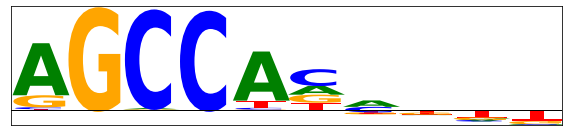

pwm_1_fwd
-0.26746846048325457
0.26494231681131947


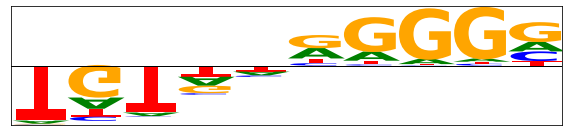

pwm_2_fwd
-0.01919125204994565
0.21685860951741537


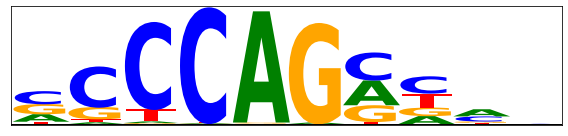

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


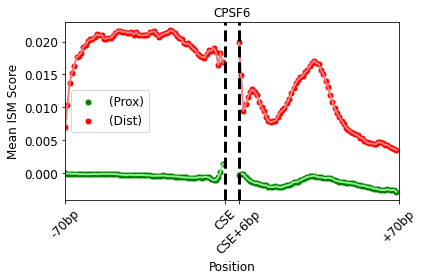

cell_type_2_ix = CSTF1


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


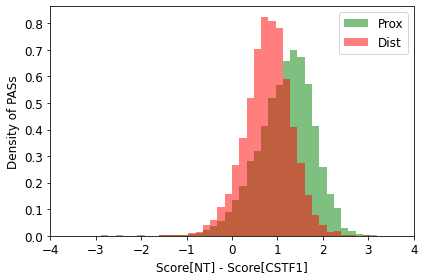

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 14419...
Gene = ENOX2
ID = chrX_130623901_-
Score[NT] - Score[CSTF1] = 2.3126
Y[NT] - Y[CSTF1] = 0.3115
[Prox site]


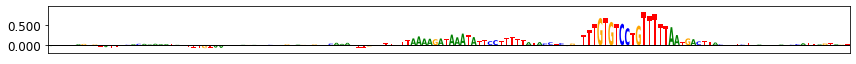

Interpreting pattern 3556...
Gene = RIC8B
ID = chr12_106887284_+
Score[NT] - Score[CSTF1] = 2.302
Y[NT] - Y[CSTF1] = 0.255
[Prox site]


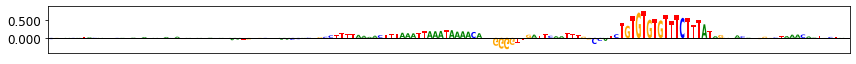

Interpreting pattern 9590...
Gene = MYNN
ID = chr3_169786826_+
Score[NT] - Score[CSTF1] = 2.3285
Y[NT] - Y[CSTF1] = 0.2478
[Prox site]


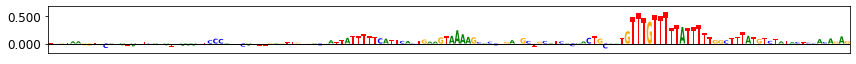

pwm_0_fwd
0.026288127028371584
0.5866631090190608


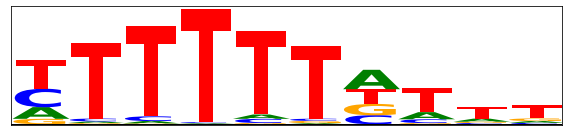

pwm_1_fwd
-0.012783239325087271
0.6143499195875235


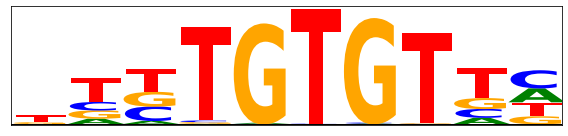

pwm_2_fwd
0.014386630132331608
0.5897964469394328


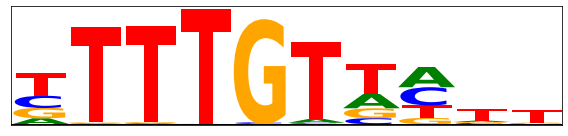


- Top 3 ISMs (negative) - 
Interpreting pattern 10786...
Gene = AHRR
ID = chr5_435110_+
Score[NT] - Score[CSTF1] = -0.3862
Y[NT] - Y[CSTF1] = -0.3106
[Prox site]


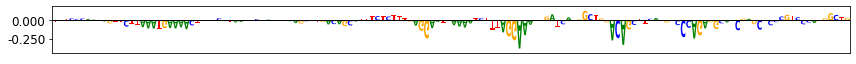

Interpreting pattern 13495...
Gene = PPP1R3B
ID = chr8_9140144_-
Score[NT] - Score[CSTF1] = -0.3476
Y[NT] - Y[CSTF1] = -0.2027
[Prox site]


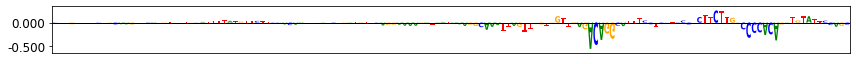

Interpreting pattern 2004...
Gene = PAX2
ID = chr10_100829594_+
Score[NT] - Score[CSTF1] = -0.5848
Y[NT] - Y[CSTF1] = -0.17
[Prox site]


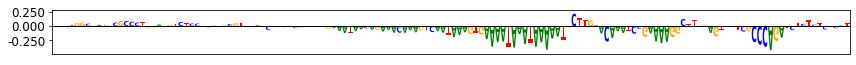

pwm_0_fwd
0.20094520903922414
0.45805769430624477


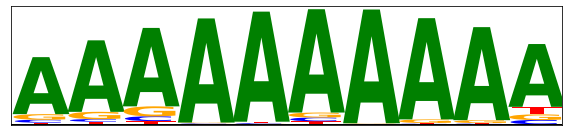

pwm_1_fwd
-0.10673917948620991
0.2863398268384841


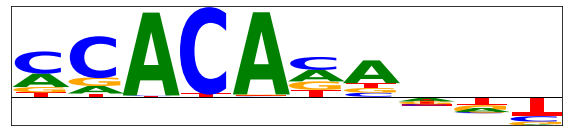

pwm_2_fwd
-0.039680704985849954
0.3304597397527751


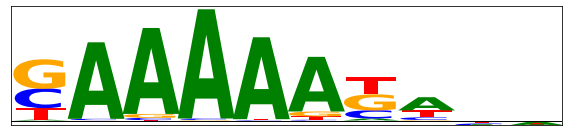

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 10415...
Gene = NKX3-2
ID = chr4_13540830_-
Score[NT] - Score[CSTF1] = 1.9088
Y[NT] - Y[CSTF1] = 0.5022
[Dist site]


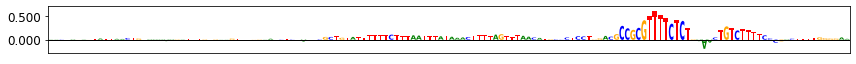

Interpreting pattern 2491...
Gene = ETS1
ID = chr11_128458765_-
Score[NT] - Score[CSTF1] = 1.7987
Y[NT] - Y[CSTF1] = 0.414
[Dist site]


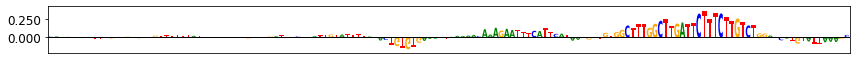

Interpreting pattern 2922...
Gene = ZDHHC5
ID = chr11_57701182_+
Score[NT] - Score[CSTF1] = 1.9193
Y[NT] - Y[CSTF1] = 0.3133
[Dist site]


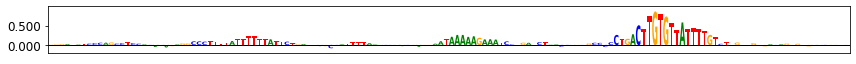

pwm_0_fwd
0.11723842635658219
0.44955691758149896


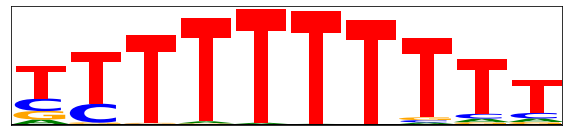

pwm_1_fwd
0.14097813790537922
0.47617262331138094


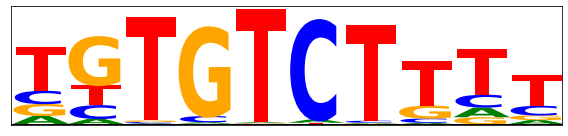

pwm_2_fwd
-0.04593887952104886
0.5428495785698819


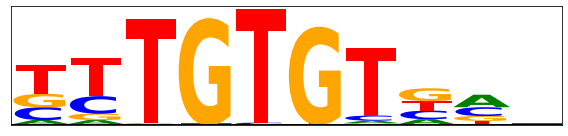


- Top 3 ISMs (negative) - 
Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[CSTF1] = -0.4009
Y[NT] - Y[CSTF1] = -0.5238
[Dist site]


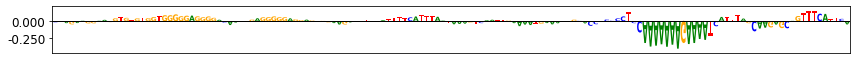

Interpreting pattern 12955...
Gene = SEMA3A
ID = chr7_83956987_-
Score[NT] - Score[CSTF1] = -1.4808
Y[NT] - Y[CSTF1] = -0.4016
[Dist site]


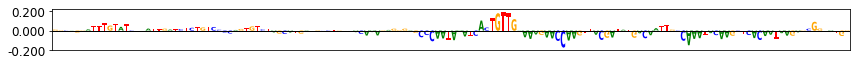

Interpreting pattern 5836...
Gene = DBF4B
ID = chr17_44752732_+
Score[NT] - Score[CSTF1] = -0.7909
Y[NT] - Y[CSTF1] = -0.3375
[Dist site]


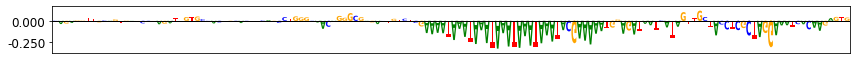

pwm_0_fwd
0.07588422956566016
0.39656586038569613


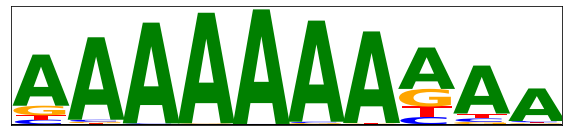

pwm_1_fwd
-0.041067899631129376
0.2955538298024072


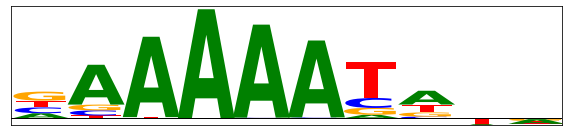

pwm_2_fwd
0.019047270275953883
0.26176382110298024


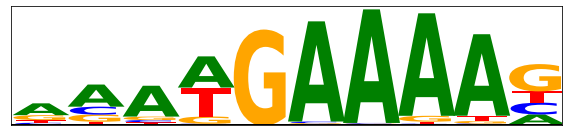

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


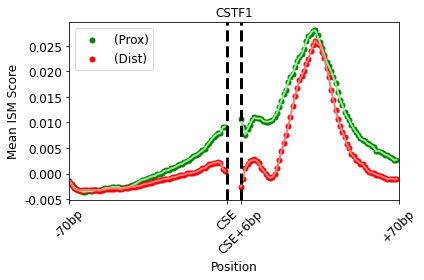

cell_type_2_ix = CSTF3


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


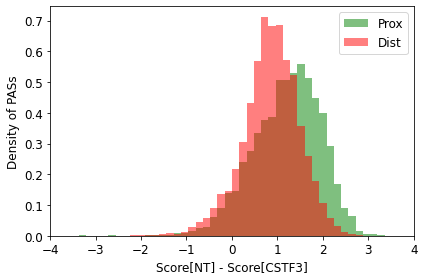

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 10230...
Gene = FBXL5
ID = chr4_15605006_-
Score[NT] - Score[CSTF3] = 2.6975
Y[NT] - Y[CSTF3] = 0.3056
[Prox site]


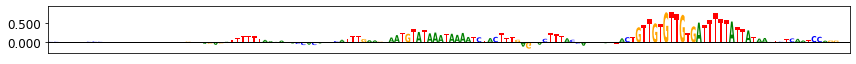

Interpreting pattern 8737...
Gene = ZBTB46
ID = chr20_63744520_-
Score[NT] - Score[CSTF3] = 2.6415
Y[NT] - Y[CSTF3] = 0.2795
[Prox site]


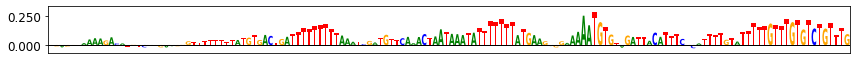

Interpreting pattern 8295...
Gene = TTC21B
ID = chr2_165874386_-
Score[NT] - Score[CSTF3] = 2.6138
Y[NT] - Y[CSTF3] = 0.2791
[Prox site]


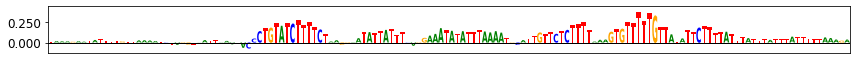

pwm_0_fwd
0.025099898935693796
0.6450546945337912


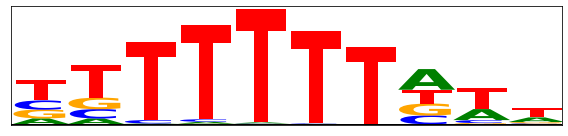

pwm_1_fwd
0.026017402337851422
0.667917350022034


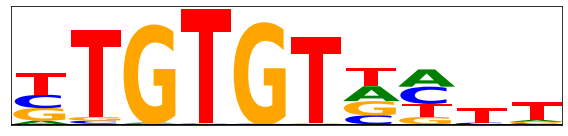

pwm_2_fwd
0.09369466809857135
0.6270757246126075


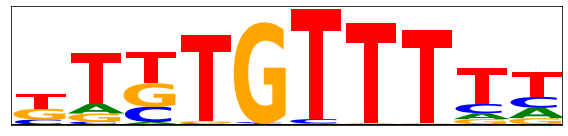


- Top 3 ISMs (negative) - 
Interpreting pattern 10786...
Gene = AHRR
ID = chr5_435110_+
Score[NT] - Score[CSTF3] = -0.5059
Y[NT] - Y[CSTF3] = -0.2925
[Prox site]


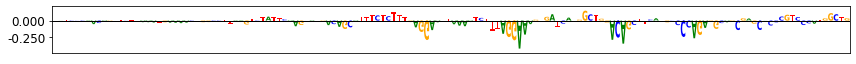

Interpreting pattern 10752...
Gene = WDR1
ID = chr4_10075149_-
Score[NT] - Score[CSTF3] = -0.8383
Y[NT] - Y[CSTF3] = -0.256
[Prox site]


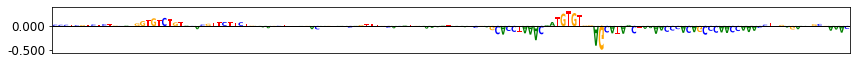

Interpreting pattern 7802...
Gene = MFSD9
ID = chr2_102718415_-
Score[NT] - Score[CSTF3] = -0.6172
Y[NT] - Y[CSTF3] = -0.2243
[Prox site]


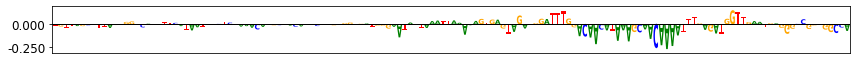

pwm_0_fwd
0.3634175091665962
0.634488621364634


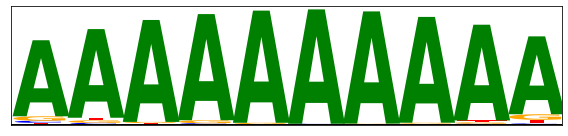

pwm_1_fwd
0.14031746202729284
0.3912236101073092


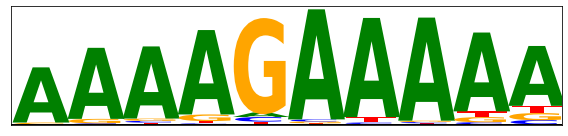

pwm_2_fwd
-0.4225723804786191
0.301479338763053


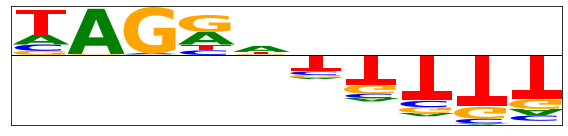

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 2491...
Gene = ETS1
ID = chr11_128458765_-
Score[NT] - Score[CSTF3] = 2.2347
Y[NT] - Y[CSTF3] = 0.3628
[Dist site]


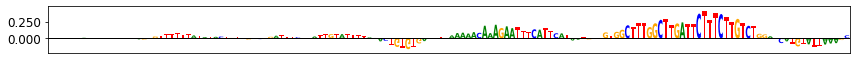

Interpreting pattern 13463...
Gene = PCMTD1
ID = chr8_51817583_-
Score[NT] - Score[CSTF3] = 2.263
Y[NT] - Y[CSTF3] = 0.3185
[Dist site]


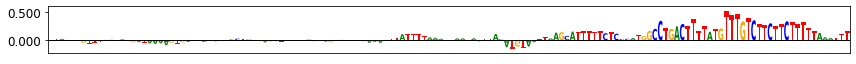

Interpreting pattern 10415...
Gene = NKX3-2
ID = chr4_13540830_-
Score[NT] - Score[CSTF3] = 2.3885
Y[NT] - Y[CSTF3] = 0.3022
[Dist site]


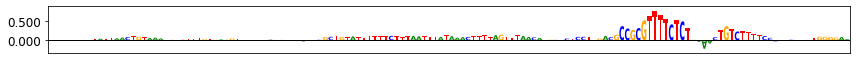

pwm_0_fwd
0.06435850362246485
0.6212070018606413


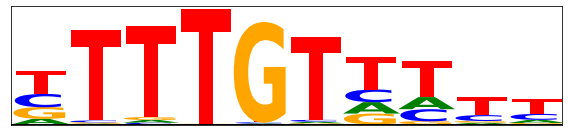

pwm_1_fwd
0.0728450352156704
0.6159131854772567


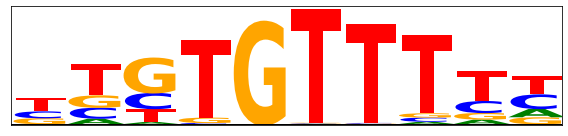

pwm_2_fwd
-0.0289744625700281
0.651303982565589


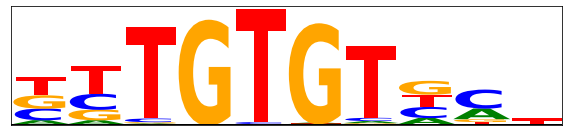


- Top 3 ISMs (negative) - 
Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[CSTF3] = -0.727
Y[NT] - Y[CSTF3] = -0.2571
[Dist site]


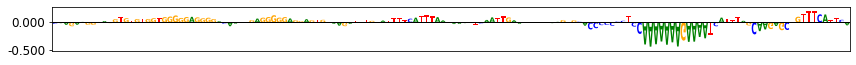

Interpreting pattern 3727...
Gene = TMEM120B
ID = chr12_121782998_+
Score[NT] - Score[CSTF3] = -1.6893
Y[NT] - Y[CSTF3] = -0.1955
[Dist site]


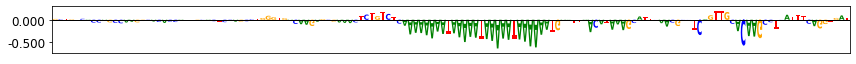

Interpreting pattern 12955...
Gene = SEMA3A
ID = chr7_83956987_-
Score[NT] - Score[CSTF3] = -2.1229
Y[NT] - Y[CSTF3] = -0.1874
[Dist site]


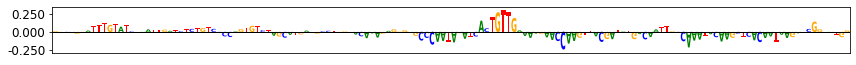

pwm_0_fwd
0.25383216900687106
0.564954750267371


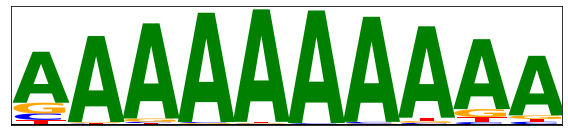

pwm_1_fwd
-0.08434893958234557
0.3284175909659713


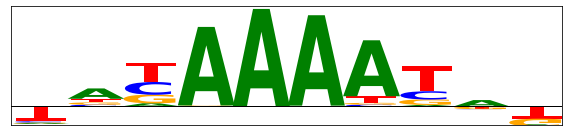

pwm_2_fwd
0.1297008187747469
0.33804394246316427


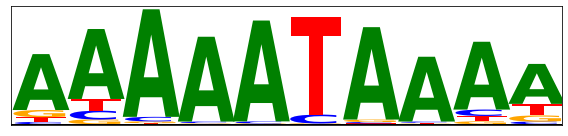

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


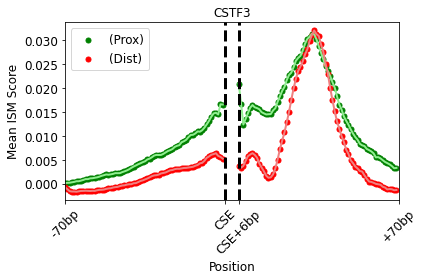

cell_type_2_ix = FIP1L1


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


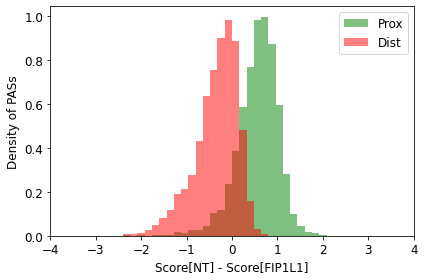

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 10055...
Gene = ADGRA3
ID = chr4_22387383_-
Score[NT] - Score[FIP1L1] = 1.3632
Y[NT] - Y[FIP1L1] = 0.4358
[Prox site]


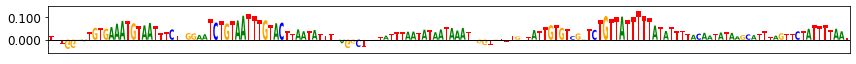

Interpreting pattern 6821...
Gene = FZR1
ID = chr19_3535006_+
Score[NT] - Score[FIP1L1] = 1.6337
Y[NT] - Y[FIP1L1] = 0.4048
[Prox site]


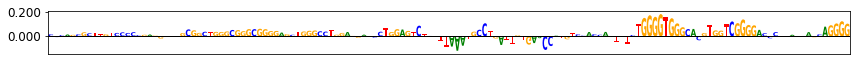

Interpreting pattern 8980...
Gene = MAPK8IP2
ID = chr22_50611549_+
Score[NT] - Score[FIP1L1] = 1.5352
Y[NT] - Y[FIP1L1] = 0.323
[Prox site]


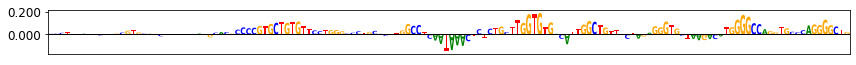

pwm_0_fwd
-0.0002701216472123201
0.27815814842720943


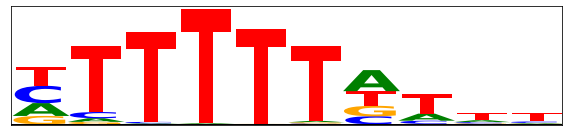

pwm_1_fwd
0.013861977767485836
0.2735569085830297


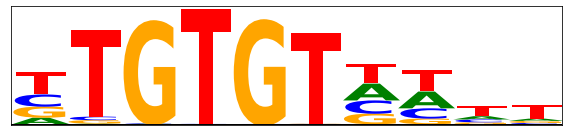

pwm_2_fwd
0.02028455211974606
0.2751012205192358


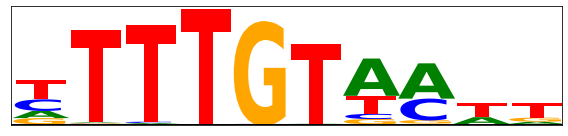


- Top 3 ISMs (negative) - 
Interpreting pattern 7060...
Gene = ZNF181
ID = chr19_34740868_+
Score[NT] - Score[FIP1L1] = -0.9348
Y[NT] - Y[FIP1L1] = -0.2539
[Prox site]


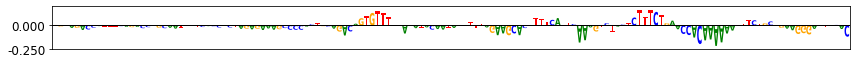

Interpreting pattern 8647...
Gene = SALL4
ID = chr20_51784038_-
Score[NT] - Score[FIP1L1] = -0.899
Y[NT] - Y[FIP1L1] = -0.2118
[Prox site]


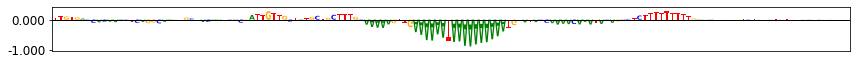

Interpreting pattern 9625...
Gene = NLGN1
ID = chr3_174283096_+
Score[NT] - Score[FIP1L1] = -1.4261
Y[NT] - Y[FIP1L1] = -0.1849
[Prox site]


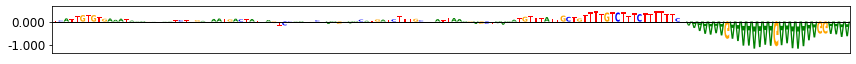

pwm_0_fwd
0.2205344416644122
0.5092171581371411


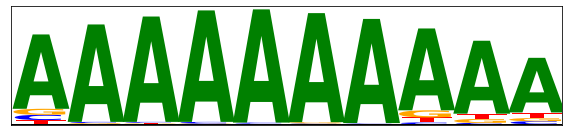

pwm_1_fwd
0.19249612219322662
0.3103159952822918


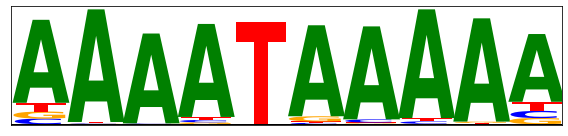

pwm_2_fwd
0.24324653390087658
0.416209341906294


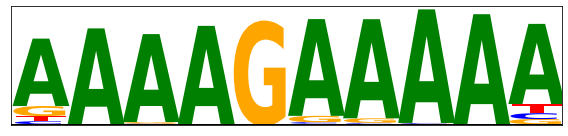

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 1279...
Gene = SYT6
ID = chr1_114089292_-
Score[NT] - Score[FIP1L1] = 0.3814
Y[NT] - Y[FIP1L1] = 0.6786
[Dist site]


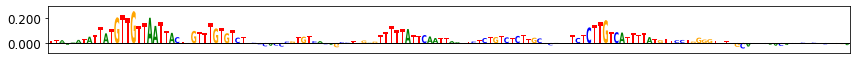

Interpreting pattern 10415...
Gene = NKX3-2
ID = chr4_13540830_-
Score[NT] - Score[FIP1L1] = 0.6007
Y[NT] - Y[FIP1L1] = 0.3637
[Dist site]


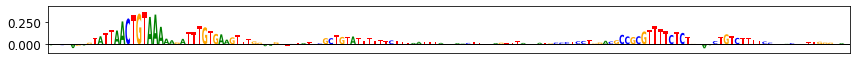

Interpreting pattern 12482...
Gene = USP49
ID = chr6_41789896_-
Score[NT] - Score[FIP1L1] = 0.3694
Y[NT] - Y[FIP1L1] = 0.2771
[Dist site]


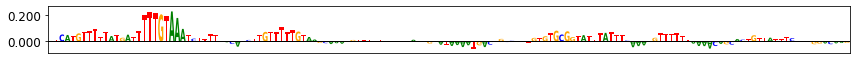

pwm_0_fwd
0.01657651759960034
0.32952070448133675


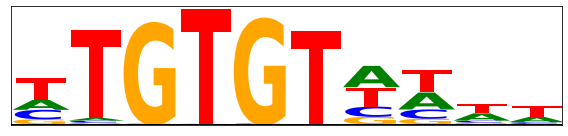

pwm_1_fwd
0.022212753359903428
0.32449966149042114


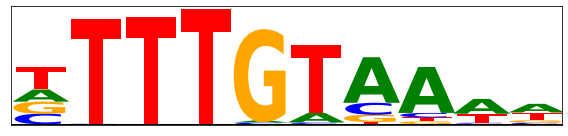

pwm_2_fwd
0.030874915607273578
0.31693891882896424


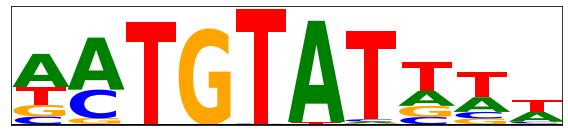


- Top 3 ISMs (negative) - 
Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[FIP1L1] = -1.5836
Y[NT] - Y[FIP1L1] = -0.8571
[Dist site]


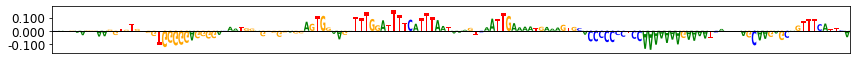

Interpreting pattern 1294...
Gene = TDRKH
ID = chr1_151768651_-
Score[NT] - Score[FIP1L1] = -2.1043
Y[NT] - Y[FIP1L1] = -0.4231
[Dist site]


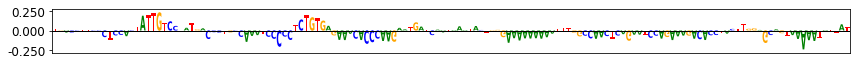

Interpreting pattern 4454...
Gene = OTUB2
ID = chr14_94049619_+
Score[NT] - Score[FIP1L1] = -1.5515
Y[NT] - Y[FIP1L1] = -0.3309
[Dist site]


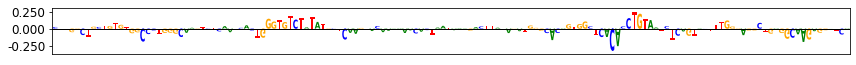

pwm_0_fwd
-0.006571171374084648
0.17204947735755854


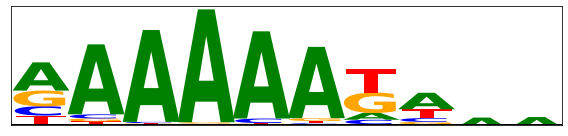

pwm_1_fwd
-0.006912864567869801
0.1597598479965986


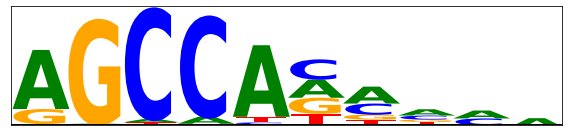

pwm_2_fwd
0.002402042686939245
0.15315066432952879


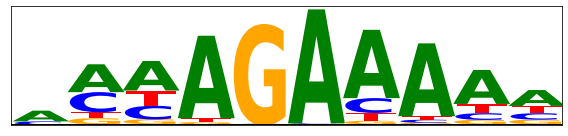

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


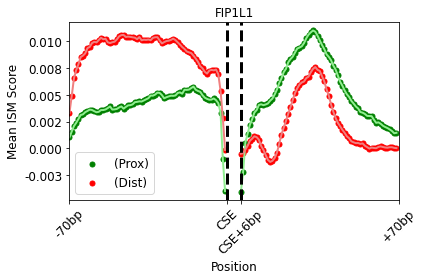

cell_type_2_ix = NUDT21


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


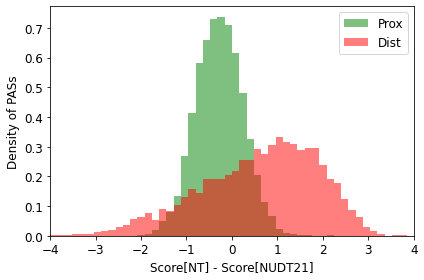

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 234...
Gene = CLCN6
ID = chr1_11843128_+
Score[NT] - Score[NUDT21] = 0.9909
Y[NT] - Y[NUDT21] = 0.4328
[Prox site]


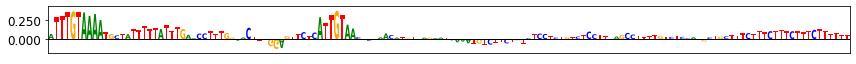

Interpreting pattern 5259...
Gene = CDIP1
ID = chr16_4511326_-
Score[NT] - Score[NUDT21] = 0.8439
Y[NT] - Y[NUDT21] = 0.3454
[Prox site]


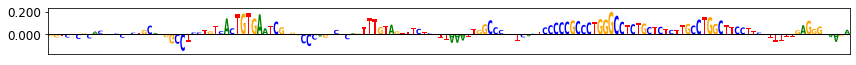

Interpreting pattern 13547...
Gene = RUNX1T1
ID = chr8_91956501_-
Score[NT] - Score[NUDT21] = 1.0708
Y[NT] - Y[NUDT21] = 0.3054
[Prox site]


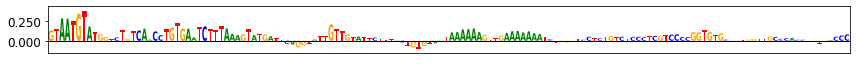

pwm_0_fwd
0.03589005190879106
0.40973889753222464


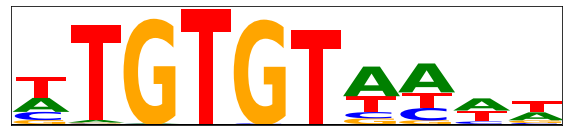

pwm_1_fwd
0.03970628885122446
0.3536288447634003


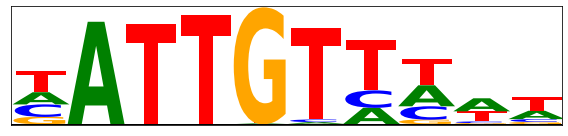

pwm_2_fwd
0.12956498559698998
0.3007335754762213


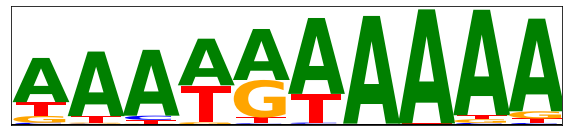


- Top 3 ISMs (negative) - 
Interpreting pattern 1815...
Gene = GPAM
ID = chr10_112153241_-
Score[NT] - Score[NUDT21] = -1.5728
Y[NT] - Y[NUDT21] = -0.8355
[Prox site]


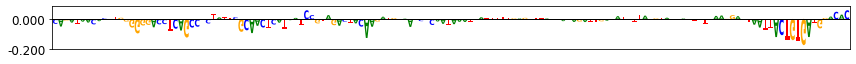

Interpreting pattern 9396...
Gene = EOGT
ID = chr3_68977527_-
Score[NT] - Score[NUDT21] = -1.344
Y[NT] - Y[NUDT21] = -0.8007
[Prox site]


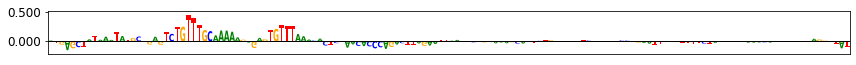

Interpreting pattern 4068...
Gene = TFDP1
ID = chr13_113640818_+
Score[NT] - Score[NUDT21] = -1.8547
Y[NT] - Y[NUDT21] = -0.7427
[Prox site]


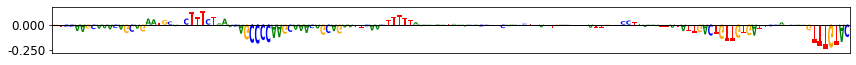

pwm_0_fwd
0.02307557770534838
0.23709783117612931


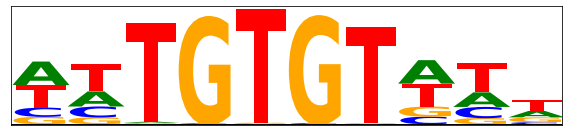

pwm_1_fwd
0.02123133747362783
0.20422354399390488


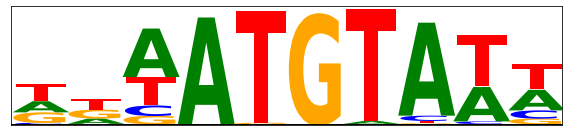

pwm_2_fwd
0.035454809202431395
0.23189749479911487


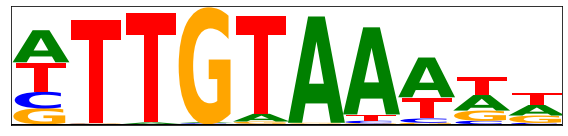

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 10487...
Gene = PLK4
ID = chr4_127899071_+
Score[NT] - Score[NUDT21] = 3.1329
Y[NT] - Y[NUDT21] = 0.6722
[Dist site]


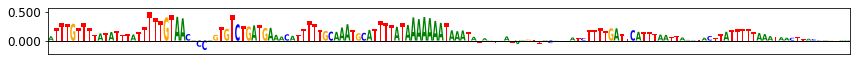

Interpreting pattern 4338...
Gene = GSKIP
ID = chr14_96387288_+
Score[NT] - Score[NUDT21] = 2.7405
Y[NT] - Y[NUDT21] = 0.6667
[Dist site]


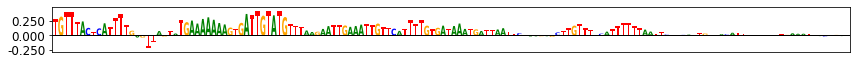

Interpreting pattern 8412...
Gene = B4GALT5
ID = chr20_49632945_-
Score[NT] - Score[NUDT21] = 2.8672
Y[NT] - Y[NUDT21] = 0.6477
[Dist site]


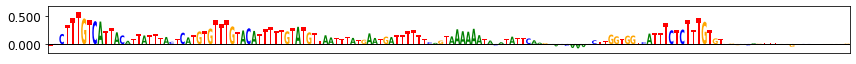

pwm_0_fwd
0.1789314897419655
0.864721678021836


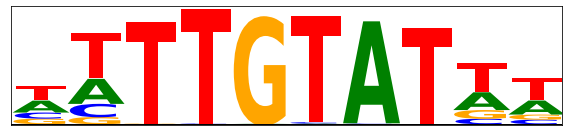

pwm_1_fwd
0.05314722898083803
0.8150586583973032


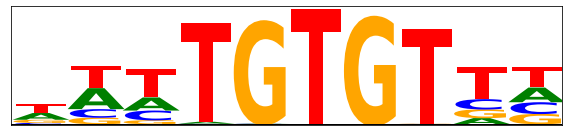

pwm_2_fwd
0.12083774179220198
0.8334649014472962


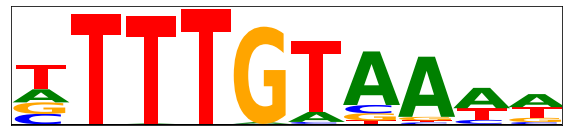


- Top 3 ISMs (negative) - 
Interpreting pattern 7131...
Gene = ZNF529
ID = chr19_36543615_-
Score[NT] - Score[NUDT21] = -2.4728
Y[NT] - Y[NUDT21] = -0.4407
[Dist site]


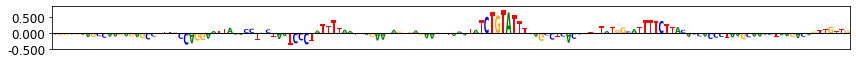

Interpreting pattern 14356...
Gene = BCOR
ID = chrX_40049815_-
Score[NT] - Score[NUDT21] = -2.3952
Y[NT] - Y[NUDT21] = -0.3663
[Dist site]


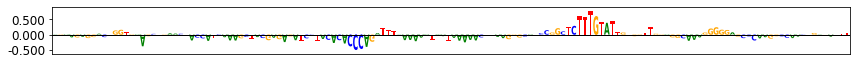

Interpreting pattern 9245...
Gene = CAMKV
ID = chr3_49857214_-
Score[NT] - Score[NUDT21] = -3.0353
Y[NT] - Y[NUDT21] = -0.2394
[Dist site]


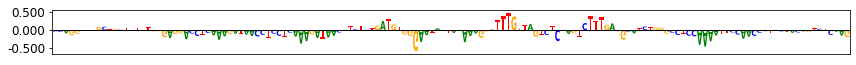

pwm_0_fwd
-0.023376632315909817
0.39448620336741086


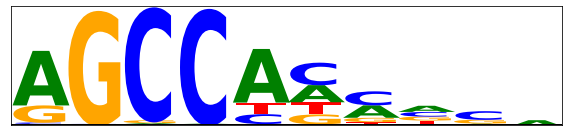

pwm_1_fwd
-0.026097833047999012
0.35629424907193324


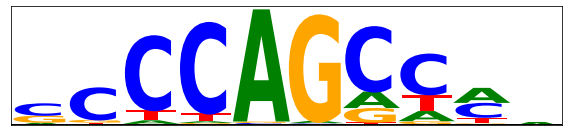

pwm_2_fwd
-0.05454177021980286
0.38452912449836735


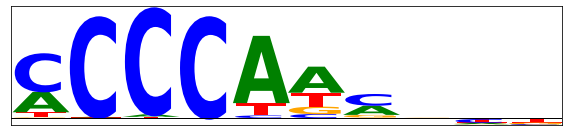

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


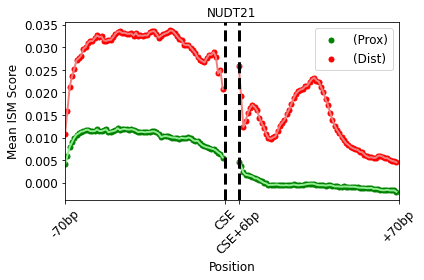

cell_type_2_ix = RBBP6


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


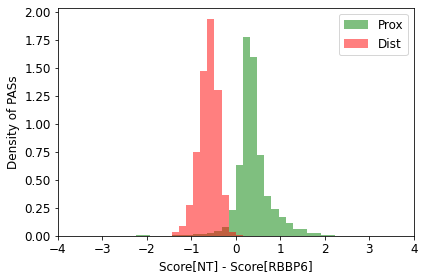

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 8980...
Gene = MAPK8IP2
ID = chr22_50611549_+
Score[NT] - Score[RBBP6] = 1.6343
Y[NT] - Y[RBBP6] = 0.4002
[Prox site]


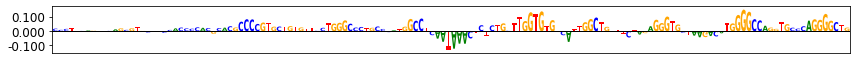

Interpreting pattern 7638...
Gene = GPR35
ID = chr2_240631249_+
Score[NT] - Score[RBBP6] = 1.9674
Y[NT] - Y[RBBP6] = 0.3407
[Prox site]


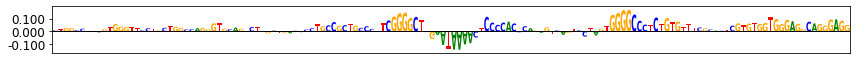

Interpreting pattern 8722...
Gene = UBOX5
ID = chr20_3109612_-
Score[NT] - Score[RBBP6] = 1.5042
Y[NT] - Y[RBBP6] = 0.33
[Prox site]


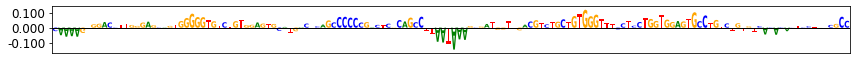

pwm_0_fwd
0.008359347889932357
0.10895842295014456


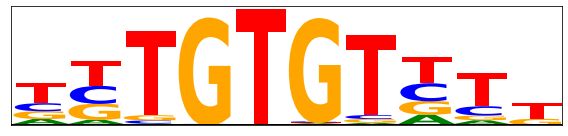

pwm_1_fwd
0.014895980214812062
0.10559671719868978


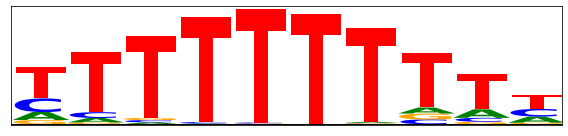

pwm_2_fwd
-0.012845203053256322
0.13817144199337125


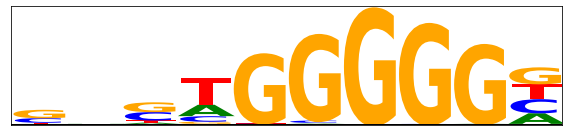


- Top 3 ISMs (negative) - 
Interpreting pattern 7298...
Gene = ANKRD23
ID = chr2_96834312_-
Score[NT] - Score[RBBP6] = -0.4341
Y[NT] - Y[RBBP6] = -0.2102
[Prox site]


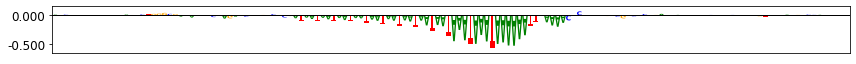

Interpreting pattern 9625...
Gene = NLGN1
ID = chr3_174283096_+
Score[NT] - Score[RBBP6] = -1.9104
Y[NT] - Y[RBBP6] = -0.108
[Prox site]


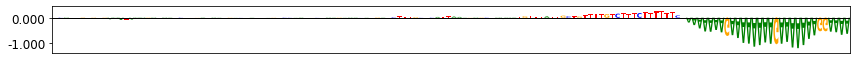

Interpreting pattern 10455...
Gene = PCDH7
ID = chr4_31145506_+
Score[NT] - Score[RBBP6] = -1.5096
Y[NT] - Y[RBBP6] = -0.0805
[Prox site]


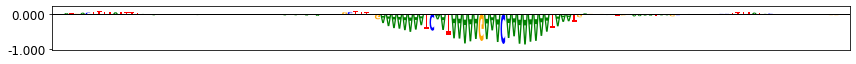

pwm_0_fwd
0.2394085848211557
0.4862850811375284


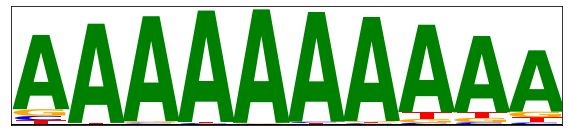

pwm_1_fwd
0.17539123926129374
0.2753271465118115


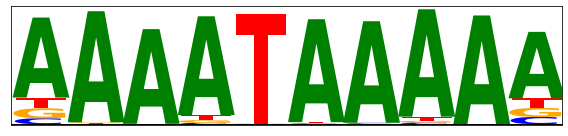

pwm_2_fwd
0.12019584178924561
0.3030363966436947


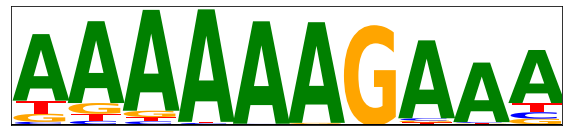

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 14310...
Gene = ZNF484
ID = chr9_92844179_-
Score[NT] - Score[RBBP6] = -0.2135
Y[NT] - Y[RBBP6] = 0.1615
[Dist site]


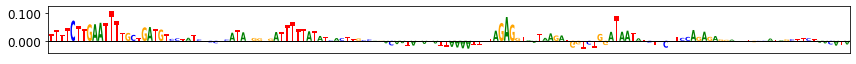

Interpreting pattern 1104...
Gene = RPS6KC1
ID = chr1_213274606_+
Score[NT] - Score[RBBP6] = -0.2104
Y[NT] - Y[RBBP6] = 0.0828
[Dist site]


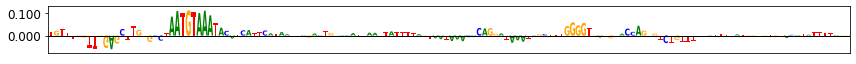

Interpreting pattern 9339...
Gene = DBR1
ID = chr3_138161012_-
Score[NT] - Score[RBBP6] = -0.1669
Y[NT] - Y[RBBP6] = 0.0717
[Dist site]


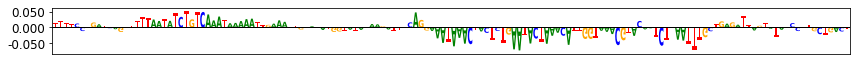

pwm_0_fwd
0.057571685441675034
0.1357724996174083


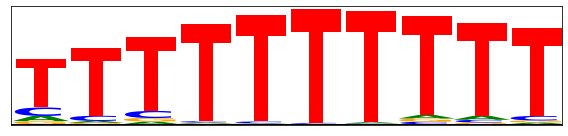

pwm_1_fwd
0.036910340992827397
0.10277786777444083


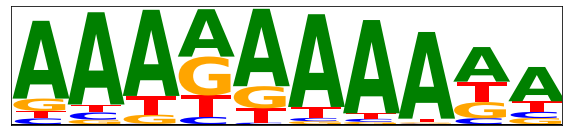

pwm_2_fwd
-0.011684698251942498
0.1092604119979327


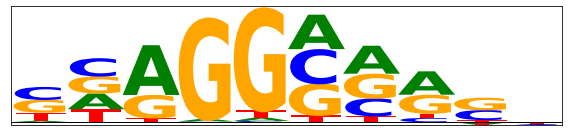


- Top 3 ISMs (negative) - 
Interpreting pattern 5823...
Gene = CTC1
ID = chr17_8224821_-
Score[NT] - Score[RBBP6] = -1.27
Y[NT] - Y[RBBP6] = -0.3941
[Dist site]


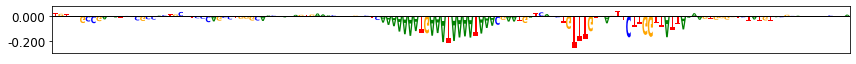

Interpreting pattern 7328...
Gene = ASB1
ID = chr2_238452250_+
Score[NT] - Score[RBBP6] = -1.1257
Y[NT] - Y[RBBP6] = -0.2973
[Dist site]


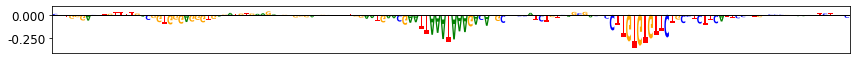

Interpreting pattern 10395...
Gene = MXD4
ID = chr4_2247432_-
Score[NT] - Score[RBBP6] = -1.1433
Y[NT] - Y[RBBP6] = -0.2845
[Dist site]


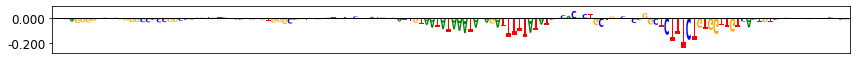

pwm_0_fwd
0.09909335953086171
0.19689772627246913


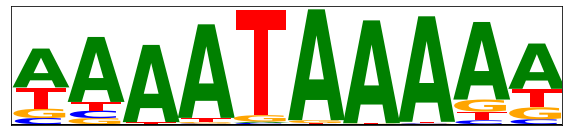

pwm_1_fwd
0.04264563445836468
0.23547650182616298


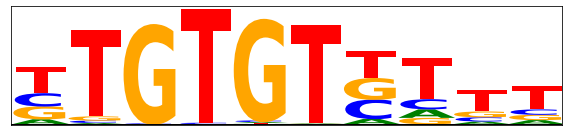

pwm_2_fwd
0.06606614298936797
0.2583585454196465


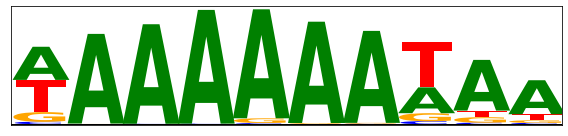

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


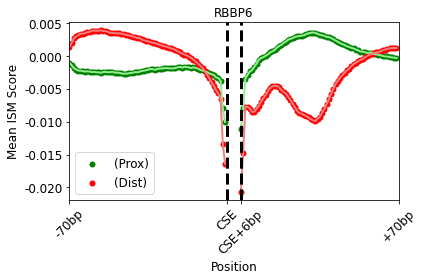

cell_type_2_ix = SRSF3


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


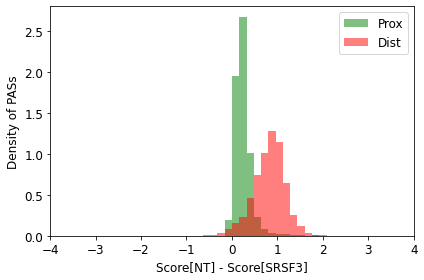

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 6107...
Gene = NOG
ID = chr17_56595186_+
Score[NT] - Score[SRSF3] = 1.0933
Y[NT] - Y[SRSF3] = 0.5435
[Prox site]


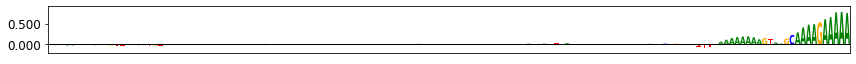

Interpreting pattern 3190...
Gene = ETV6
ID = chr12_11891642_+
Score[NT] - Score[SRSF3] = 0.7755
Y[NT] - Y[SRSF3] = 0.4239
[Prox site]


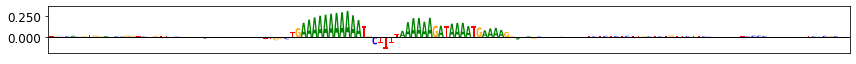

Interpreting pattern 7298...
Gene = ANKRD23
ID = chr2_96834312_-
Score[NT] - Score[SRSF3] = 0.7627
Y[NT] - Y[SRSF3] = 0.3388
[Prox site]


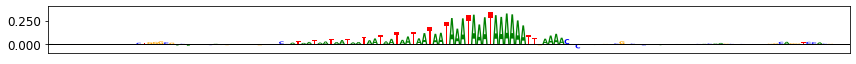

pwm_0_fwd
0.1273816270138844
0.23494470925216215


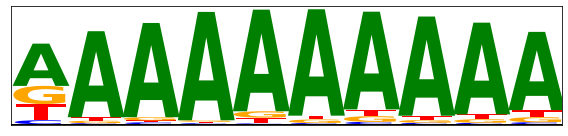

pwm_1_fwd
0.08042502295126958
0.175006891800239


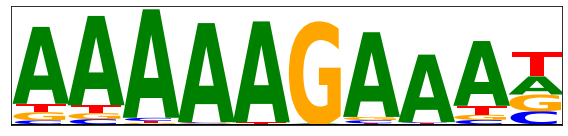

pwm_2_fwd
0.027871213006038287
0.07917865771873324


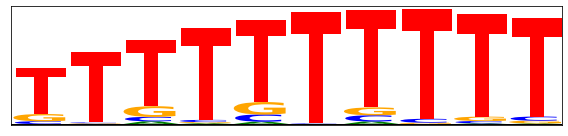


- Top 3 ISMs (negative) - 
Interpreting pattern 9979...
Gene = VGLL3
ID = chr3_86940637_-
Score[NT] - Score[SRSF3] = -0.0421
Y[NT] - Y[SRSF3] = -0.433
[Prox site]


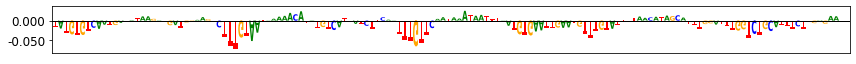

Interpreting pattern 774...
Gene = MTF1
ID = chr1_37814813_-
Score[NT] - Score[SRSF3] = -0.0424
Y[NT] - Y[SRSF3] = -0.2949
[Prox site]


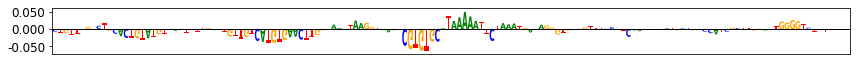

Interpreting pattern 14038...
Gene = NFX1
ID = chr9_33370178_+
Score[NT] - Score[SRSF3] = -0.0871
Y[NT] - Y[SRSF3] = -0.2758
[Prox site]


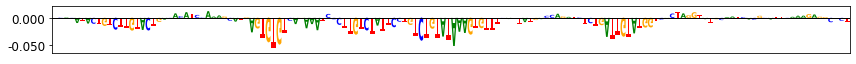

pwm_0_fwd
-0.002636991069389631
0.09019966339508549


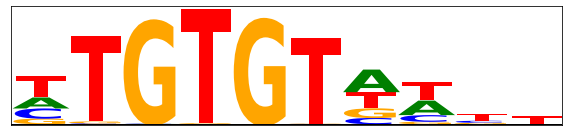

pwm_1_fwd
-0.01068474060151635
0.06911352239003996


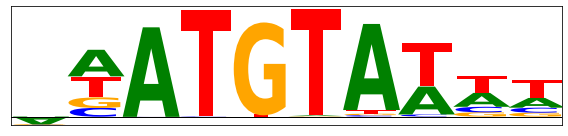

pwm_2_fwd
0.005328973503999933
0.07800342648528343


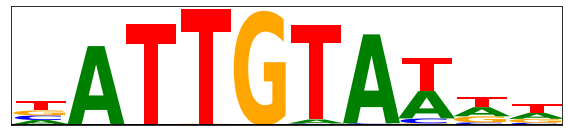

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 4336...
Gene = GPR137C
ID = chr14_52637713_+
Score[NT] - Score[SRSF3] = 1.5192
Y[NT] - Y[SRSF3] = 0.6512
[Dist site]


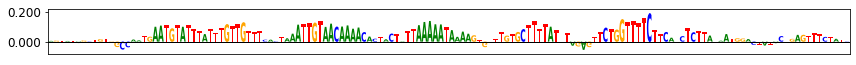

Interpreting pattern 2379...
Gene = CDC42BPG
ID = chr11_64823051_-
Score[NT] - Score[SRSF3] = 2.0173
Y[NT] - Y[SRSF3] = 0.5439
[Dist site]


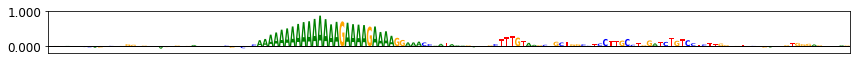

Interpreting pattern 535...
Gene = H6PD
ID = chr1_9271337_+
Score[NT] - Score[SRSF3] = 1.4726
Y[NT] - Y[SRSF3] = 0.4079
[Dist site]


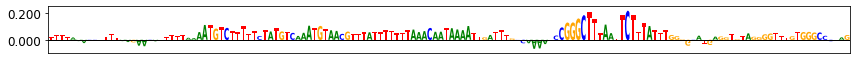

pwm_0_fwd
0.03931359722232568
0.29363299692709616


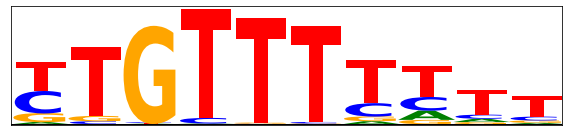

pwm_1_fwd
0.02161142241280034
0.2883538603461335


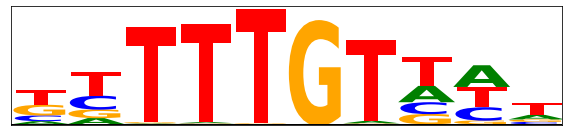

pwm_2_fwd
0.021920848824083804
0.3009450275450945


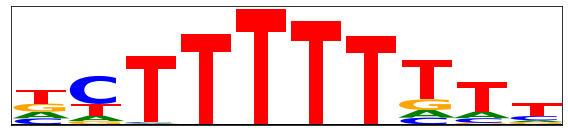


- Top 3 ISMs (negative) - 
Interpreting pattern 2375...
Gene = CD44
ID = chr11_35232398_+
Score[NT] - Score[SRSF3] = -0.0544
Y[NT] - Y[SRSF3] = -0.7722
[Dist site]


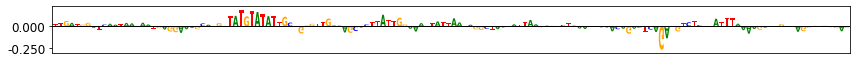

Interpreting pattern 13355...
Gene = KCNV1
ID = chr8_109967001_-
Score[NT] - Score[SRSF3] = -0.1334
Y[NT] - Y[SRSF3] = -0.5366
[Dist site]


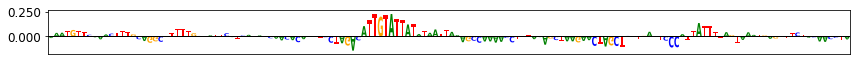

Interpreting pattern 4544...
Gene = SAMD15
ID = chr14_77392163_+
Score[NT] - Score[SRSF3] = -0.1675
Y[NT] - Y[SRSF3] = -0.5163
[Dist site]


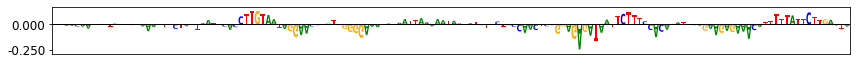

pwm_0_fwd
-0.04144034421659811
0.1629791090905786


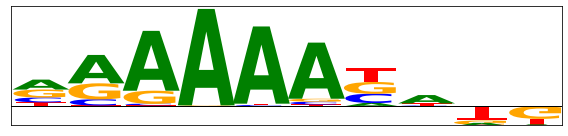

pwm_1_fwd
-0.0395796326490549
0.14986940467888527


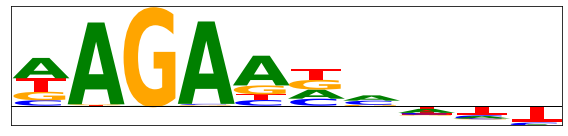

pwm_2_fwd
-0.06102616315086682
0.16767463684082032


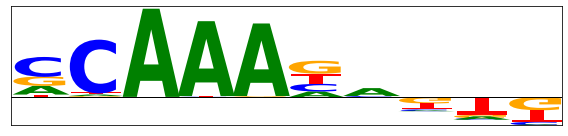

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


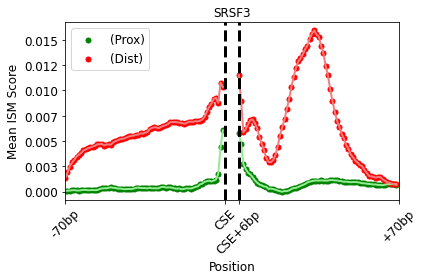

cell_type_2_ix = SYMPK


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


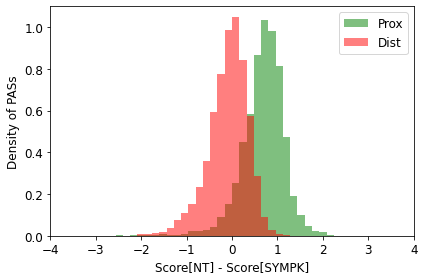

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 6877...
Gene = MAP3K10
ID = chr19_40215575_+
Score[NT] - Score[SYMPK] = 1.7861
Y[NT] - Y[SYMPK] = 0.3847
[Prox site]


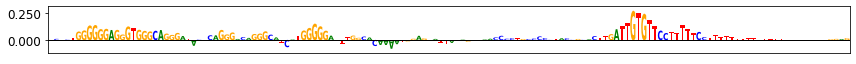

Interpreting pattern 8980...
Gene = MAPK8IP2
ID = chr22_50611549_+
Score[NT] - Score[SYMPK] = 1.7056
Y[NT] - Y[SYMPK] = 0.2875
[Prox site]


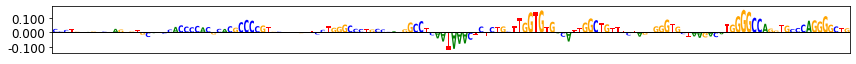

Interpreting pattern 13229...
Gene = DENND3
ID = chr8_141194248_+
Score[NT] - Score[SYMPK] = 1.8212
Y[NT] - Y[SYMPK] = 0.275
[Prox site]


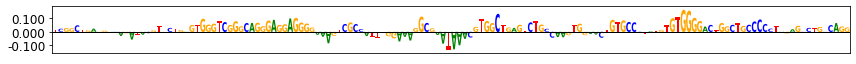

pwm_0_fwd
0.012145374852370324
0.31256578466112317


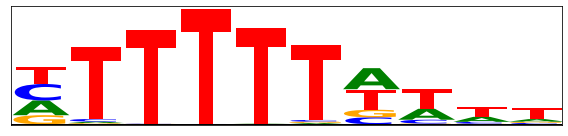

pwm_1_fwd
0.02491956258536408
0.3059133096825923


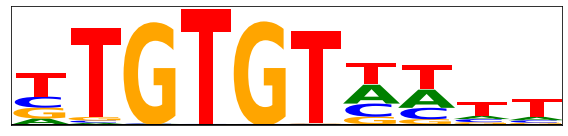

pwm_2_fwd
0.032713837784845476
0.3164780870151981


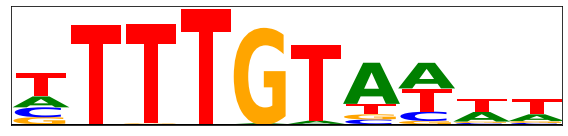


- Top 3 ISMs (negative) - 
Interpreting pattern 7060...
Gene = ZNF181
ID = chr19_34740868_+
Score[NT] - Score[SYMPK] = -0.5138
Y[NT] - Y[SYMPK] = -0.3261
[Prox site]


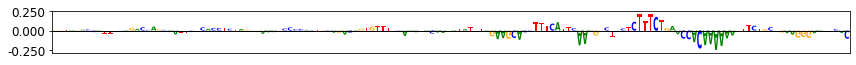

Interpreting pattern 8647...
Gene = SALL4
ID = chr20_51784038_-
Score[NT] - Score[SYMPK] = -0.9774
Y[NT] - Y[SYMPK] = -0.2689
[Prox site]


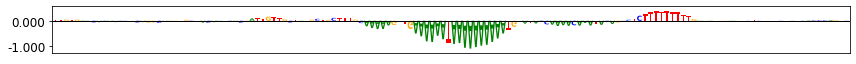

Interpreting pattern 10169...
Gene = COQ2
ID = chr4_83264303_-
Score[NT] - Score[SYMPK] = -0.6355
Y[NT] - Y[SYMPK] = -0.1866
[Prox site]


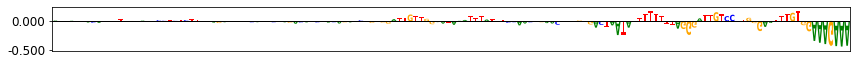

pwm_0_fwd
0.3228738669766725
0.6175878603403805


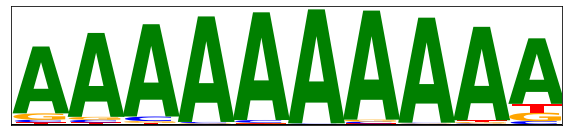

pwm_1_fwd
0.1884388929680933
0.42169708179522164


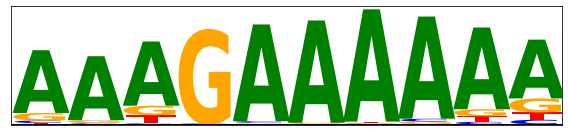

pwm_2_fwd
0.19469821671493182
0.37937009844161174


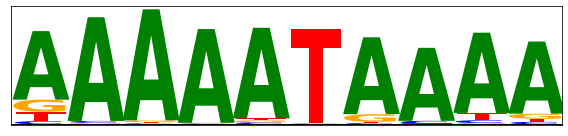

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 1700...
Gene = CNNM2
ID = chr10_103083385_+
Score[NT] - Score[SYMPK] = 0.8215
Y[NT] - Y[SYMPK] = 0.3228
[Dist site]


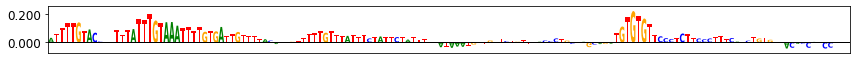

Interpreting pattern 3861...
Gene = DCUN1D2
ID = chr13_113455819_-
Score[NT] - Score[SYMPK] = 0.731
Y[NT] - Y[SYMPK] = 0.3022
[Dist site]


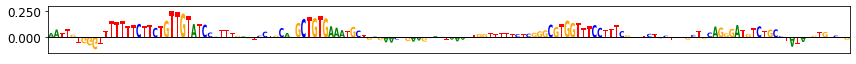

Interpreting pattern 10415...
Gene = NKX3-2
ID = chr4_13540830_-
Score[NT] - Score[SYMPK] = 0.987
Y[NT] - Y[SYMPK] = 0.3022
[Dist site]


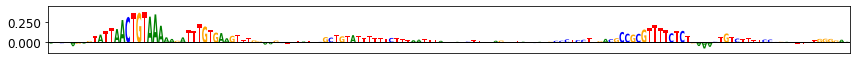

pwm_0_fwd
0.017322811147124036
0.3038715280888642


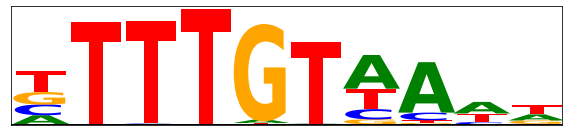

pwm_1_fwd
0.032455223100679415
0.29766928183065877


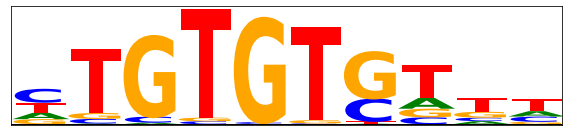

pwm_2_fwd
0.009583770418630063
0.26790676672481795


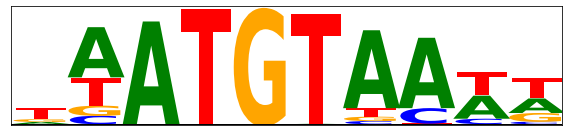


- Top 3 ISMs (negative) - 
Interpreting pattern 3727...
Gene = TMEM120B
ID = chr12_121782998_+
Score[NT] - Score[SYMPK] = -2.2524
Y[NT] - Y[SYMPK] = -0.5274
[Dist site]


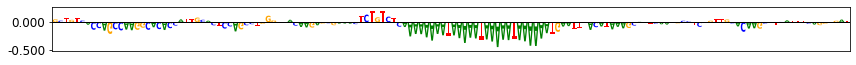

Interpreting pattern 12633...
Gene = CLCN1
ID = chr7_143353862_+
Score[NT] - Score[SYMPK] = -1.3572
Y[NT] - Y[SYMPK] = -0.5238
[Dist site]


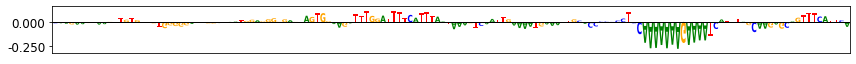

Interpreting pattern 12955...
Gene = SEMA3A
ID = chr7_83956987_-
Score[NT] - Score[SYMPK] = -1.7562
Y[NT] - Y[SYMPK] = -0.3302
[Dist site]


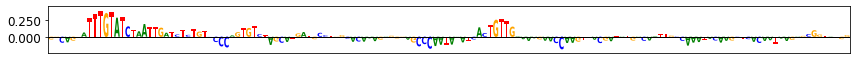

pwm_0_fwd
0.1425614920954838
0.31370293423394174


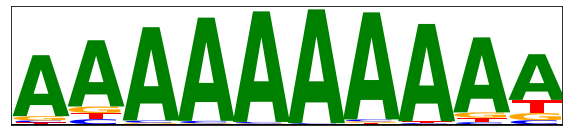

pwm_1_fwd
0.0849815732371198
0.2135803974457901


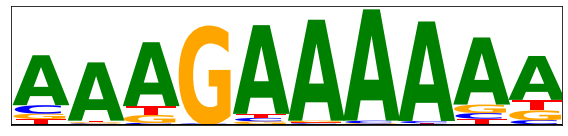

pwm_2_fwd
0.07651707955126494
0.2380079713857399


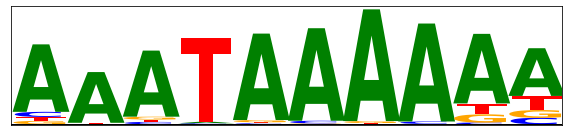

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


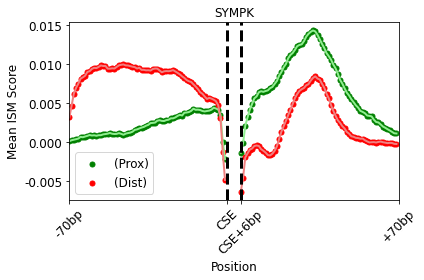

cell_type_2_ix = THOC5


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


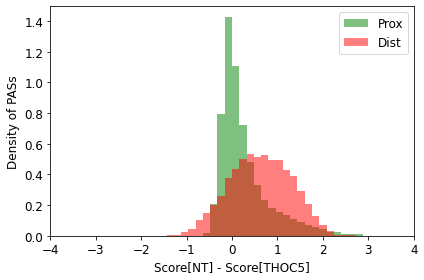

[score_ix = 0]
- Top 3 ISMs (positive) - 
Interpreting pattern 7638...
Gene = GPR35
ID = chr2_240631249_+
Score[NT] - Score[THOC5] = 2.6675
Y[NT] - Y[THOC5] = 0.3836
[Prox site]


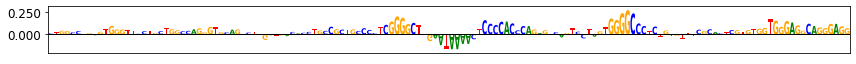

Interpreting pattern 7373...
Gene = C2orf72
ID = chr2_231047797_+
Score[NT] - Score[THOC5] = 2.1438
Y[NT] - Y[THOC5] = 0.2719
[Prox site]


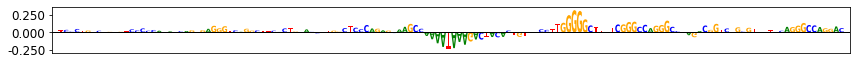

Interpreting pattern 13533...
Gene = RHPN1
ID = chr8_143382808_+
Score[NT] - Score[THOC5] = 2.3052
Y[NT] - Y[THOC5] = 0.2556
[Prox site]


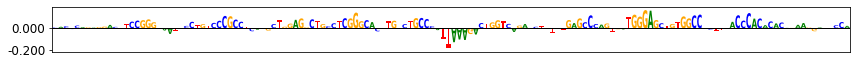

pwm_0_fwd
-0.026442660134414146
0.16427715336225956


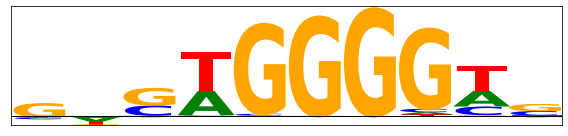

pwm_1_fwd
-0.02047175863054064
0.14400957854588828


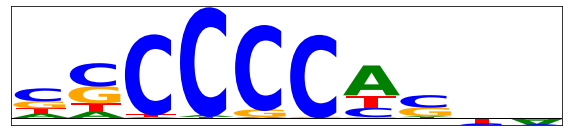

pwm_2_fwd
0.1493681681904816
0.25063024327374883


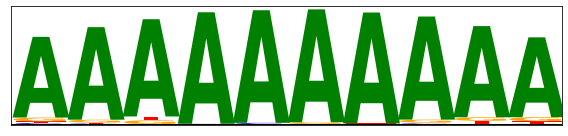


- Top 3 ISMs (negative) - 
Interpreting pattern 3180...
Gene = ETFBKMT
ID = chr12_31668120_+
Score[NT] - Score[THOC5] = -0.4115
Y[NT] - Y[THOC5] = -0.4605
[Prox site]


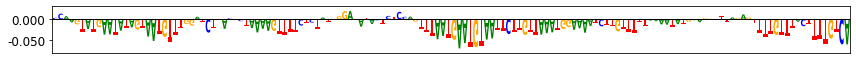

Interpreting pattern 9979...
Gene = VGLL3
ID = chr3_86940637_-
Score[NT] - Score[THOC5] = -0.3646
Y[NT] - Y[THOC5] = -0.433
[Prox site]


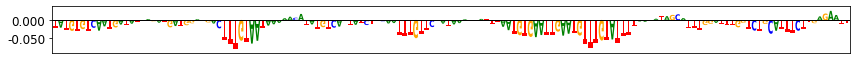

Interpreting pattern 9840...
Gene = SKIL
ID = chr3_170393162_+
Score[NT] - Score[THOC5] = -0.3817
Y[NT] - Y[THOC5] = -0.4041
[Prox site]


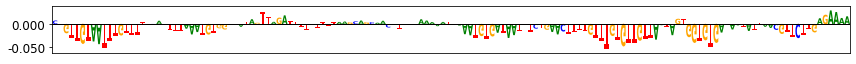

pwm_0_fwd
0.012011921522664091
0.17654798346407274


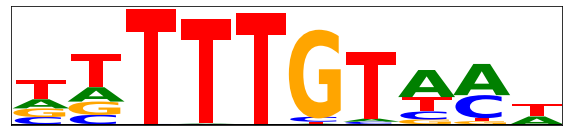

pwm_1_fwd
0.037202466214263194
0.20498418151932274


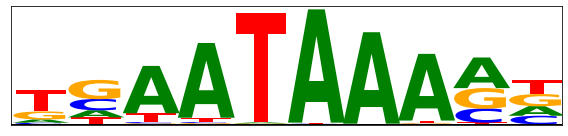

pwm_2_fwd
0.0227808285403896
0.19136196761517912


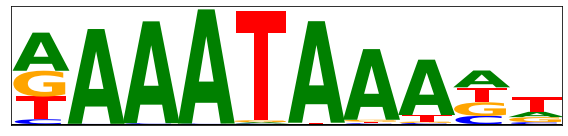

[score_ix = 2]
- Top 3 ISMs (positive) - 
Interpreting pattern 9842...
Gene = SKIL
ID = chr3_170396835_+
Score[NT] - Score[THOC5] = 2.1885
Y[NT] - Y[THOC5] = 0.4077
[Dist site]


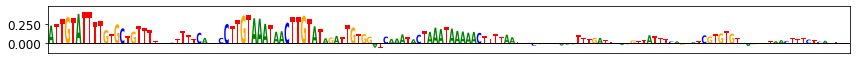

Interpreting pattern 8946...
Gene = GRAMD4
ID = chr22_46679785_+
Score[NT] - Score[THOC5] = 2.2569
Y[NT] - Y[THOC5] = 0.4048
[Dist site]


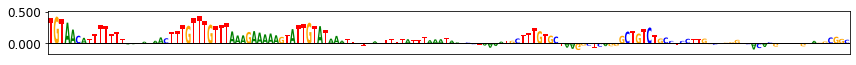

Interpreting pattern 7833...
Gene = MXD1
ID = chr2_69942945_+
Score[NT] - Score[THOC5] = 2.0818
Y[NT] - Y[THOC5] = 0.3958
[Dist site]


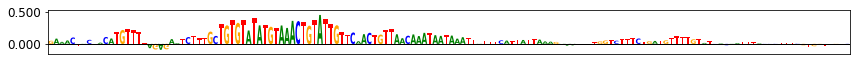

pwm_0_fwd
0.07470827922392427
0.5198256177580758


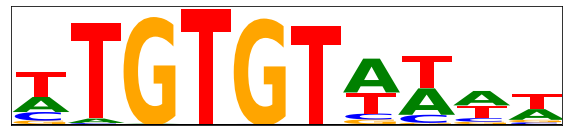

pwm_1_fwd
0.08459762208005214
0.5088574456830397


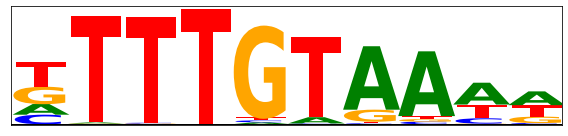

pwm_2_fwd
0.0633920284232708
0.5216088189019097


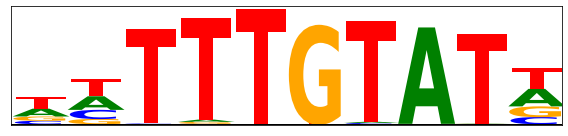


- Top 3 ISMs (negative) - 
Interpreting pattern 7134...
Gene = ZNF540
ID = chr19_37614095_+
Score[NT] - Score[THOC5] = -0.7677
Y[NT] - Y[THOC5] = -0.2996
[Dist site]


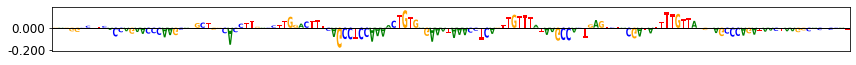

Interpreting pattern 3635...
Gene = SLC48A1
ID = chr12_47782751_+
Score[NT] - Score[THOC5] = -0.822
Y[NT] - Y[THOC5] = -0.2786
[Dist site]


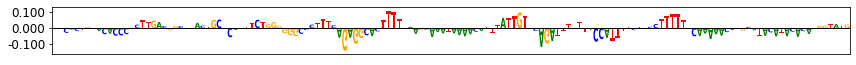

Interpreting pattern 5403...
Gene = HAGH
ID = chr16_1799787_-
Score[NT] - Score[THOC5] = -0.787
Y[NT] - Y[THOC5] = -0.2706
[Dist site]


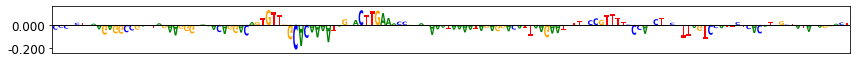

pwm_0_fwd
0.026386054003680194
0.1593656764207063


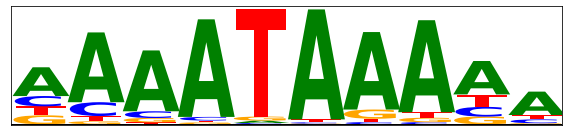

pwm_1_fwd
-0.02906202919078323
0.20087108396134287


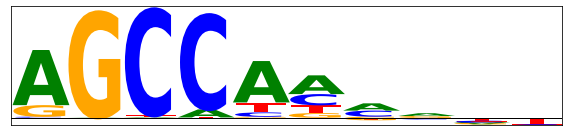

pwm_2_fwd
-0.023845711475660822
0.20219121339942228


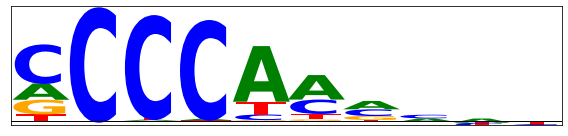

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


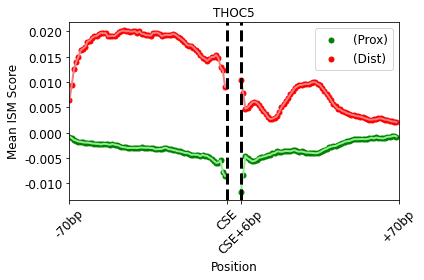

In [18]:
#Run interpretation pipeline for selected cell types (separated by proximal/distal PASs)

cell_type_2_index = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

for cell_type_2_ix in cell_type_2_index :

    print("cell_type_2_ix = " + str(subset_cell_types[cell_type_2_ix]))
    
    _print_interpretation_by_score(cell_type_2_ix=cell_type_2_ix, modisco_suffix='_filtered', save_figs=True, fig_name='apa_perturb_10_figures/apa_perturb_10_by_score')


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


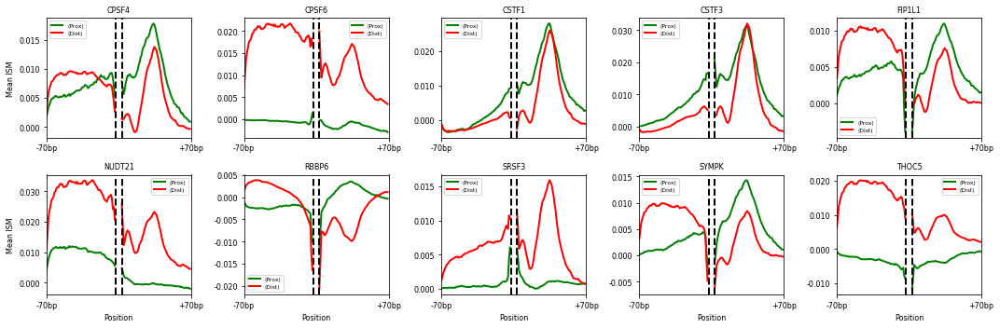

In [19]:
from matplotlib.ticker import FormatStrFormatter

#Plot Average ISM score by position in multi-panel plot (separated by proximal/distal PASs)

save_figs=True
fig_name='apa_perturb_10_figures/apa_perturb_10_by_score'

#Params
cell_type_1_ix = 0

seq_start = 0
seq_end = 146

cse_end = 76

cell_type_index = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
score_ixs = [0, 2]

score_strs=['Prox', 'Dist']
score_colors=['green', 'red']
score_light_colors=['green', 'red']#['lightgreen', 'lightcoral']

n_rows = 2
n_cols = 5

f, axs = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 2.5 * n_rows))

for plot_i, cell_type_2_ix in enumerate(cell_type_index) :
    
    #Plot mean importance score across position (distal/non-distal PASs)
    mean_scores = [
        np.mean(flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))
        for score_ix in score_ixs
    ]
    
    row = plot_i // n_cols
    col = plot_i % n_cols
    
    ls = []
    
    for score_i, score_ix in enumerate(mean_scores) :
        mean_scores_curr = mean_scores[score_i]
        
        l1 = axs[row, col].plot(np.arange(mean_scores_curr.shape[0])[:70], mean_scores_curr[:70], color=score_light_colors[score_i], linewidth=2, label="(" + score_strs[score_i] + ")")
        axs[row, col].plot(np.arange(mean_scores_curr.shape[0])[cse_end:146], mean_scores_curr[cse_end:146], color=score_light_colors[score_i], linewidth=2)

        #axs[row, col].scatter(np.arange(mean_scores_curr.shape[0])[:70], mean_scores_curr[:70], color=score_colors[score_i], s=25, label="(" + score_strs[score_i] + ")")
        #axs[row, col].scatter(np.arange(mean_scores_curr.shape[0])[cse_end:146], mean_scores_curr[cse_end:146], color=score_colors[score_i], s=25)
        
        ls.append(l1[0])
    
    plt.sca(axs[row, col])
    
    plt.axvline(x=70, color='black', linewidth=2, linestyle='--')
    plt.axvline(x=76, color='black', linewidth=2, linestyle='--')

    plt.xlim(0, 145)
    #plt.ylim(0.)

    axs[row, col].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    
    plt.xticks([0, 146], ["-70bp", "+70bp"], fontsize=8)
    plt.yticks(fontsize=8)

    if row == n_rows - 1 :
        plt.xlabel("Position", fontsize=8)
    
    if col == 0 :
        plt.ylabel("Mean ISM", fontsize=8)

    plt.title(str(subset_cell_types[cell_type_2_ix]), fontsize=8)
    
    plt.legend(handles=ls, fontsize=6)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism_scores.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism_scores.eps")

plt.show()


Interpreting pattern 189...
Gene = CCSAP
ID = chr1_229321012_-
Score[NT] - Score[NUDT21] = 2.4857
Y[NT] - Y[NUDT21] = 0.4573
[Dist site]
NT (scores) - Perturb (scores) = 


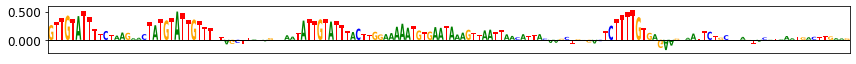

---
Interpreting pattern 830...
Gene = NRAS
ID = chr1_114704469_-
Score[NT] - Score[NUDT21] = 2.071
Y[NT] - Y[NUDT21] = 0.53
[Dist site]
NT (scores) - Perturb (scores) = 


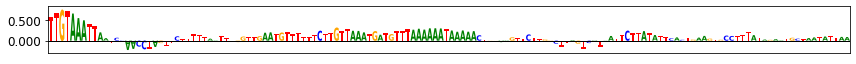

---
Interpreting pattern 94...
Gene = ARL8A
ID = chr1_202133407_-
Score[NT] - Score[NUDT21] = 2.1293
Y[NT] - Y[NUDT21] = 0.3029
[Dist site]
NT (scores) - Perturb (scores) = 


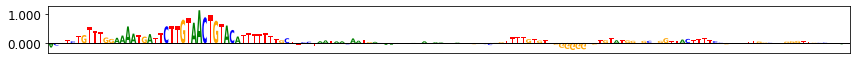

---


In [22]:
#NUDT21 hand-picked examples

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_NUDT21'

cell_type_1_ix = 0
cell_type_2_ix = 6

seq_start = 0
seq_end = 146

ixs = [189, 830, 94]

flat_ts_diff = flat_ts_merged[:, cell_type_2_ix] - flat_ts_merged[:, cell_type_1_ix]
flat_y_diff = flat_y[:, cell_type_2_ix] - flat_y[:, cell_type_1_ix]

for i in ixs :
    print("Interpreting pattern " + str(i) + "...")
    print("Gene = " + str(flat_gene_names[i]))
    print("ID = " + str(flat_ids[i]))
    print("Score[" + subset_cell_types[cell_type_1_ix] + "] - Score[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_ts_diff[i], 4)))
    print("Y[" + subset_cell_types[cell_type_1_ix] + "] - Y[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_y_diff[i], 4)))

    score_str = "Prox" if flat_prox_mask[i] == 1. else ("Middle" if flat_middle_mask[i] == 1. else "Dist")
    print("[" + score_str + " site]")

    print("NT (scores) - Perturb (scores) = ")
    plot_seq_scores(
        (flat_scores_merged[cell_type_1_ix, i, 0, seq_start:seq_end, :] - flat_scores_merged[cell_type_2_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :],
        figsize=(12, 1),
        plot_y_ticks=True,
        save_figs=save_figs,
        fig_name=fig_name + "_ism" + "_example_ix_" + str(i)
    )
    
    print("---")


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


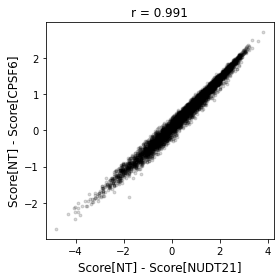

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


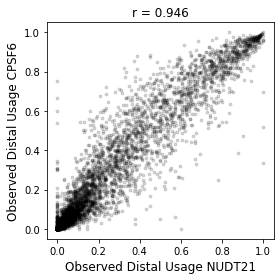

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


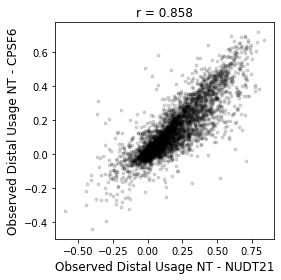

Interpreting pattern 189...
Gene = CCSAP
ID = chr1_229321012_-
Score[NT] - Score[NUDT21] = 2.4857
Y[NT] - Y[NUDT21] = 0.4573
Score[NT] - Score[CPSF6] = 1.8133
Y[NT] - Y[CPSF6] = 0.3723
[Dist site]
NT (scores) - Perturb (scores) = 


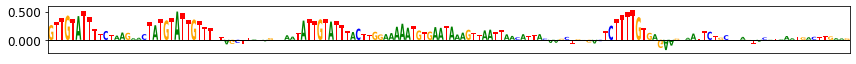

NT (scores) - Perturb (scores other) = 


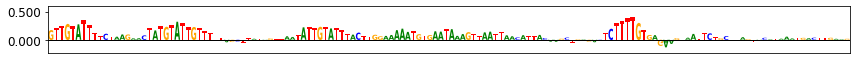

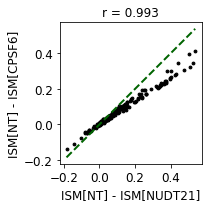

--- individual model patterns ---
NT (scores) - Perturb (scores) = 
bootstrap_ix = 0


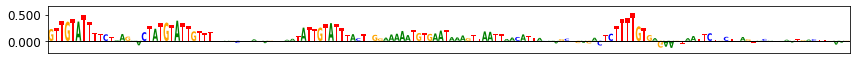

bootstrap_ix = 1


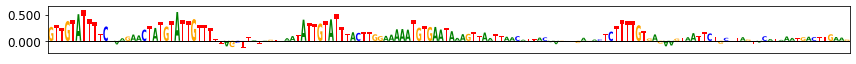

bootstrap_ix = 2


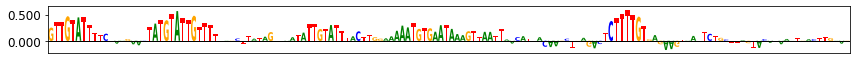

NT (scores) - Perturb (scores other) = 
bootstrap_ix = 0


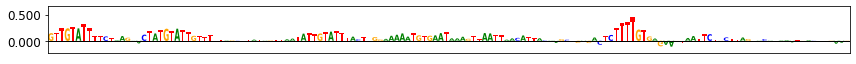

bootstrap_ix = 1


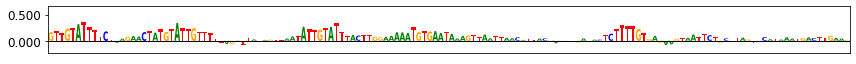

bootstrap_ix = 2


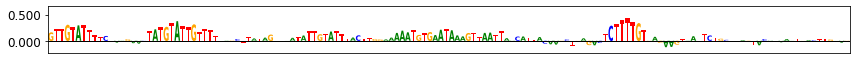

----------


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


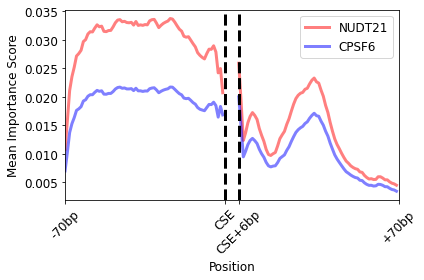

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


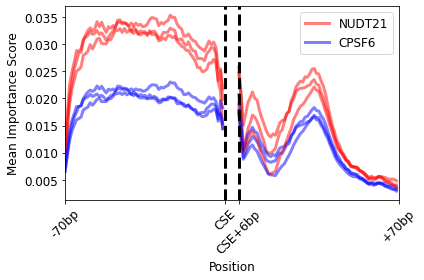

In [29]:
#NUDT21 vs. CPSF6 (distal)

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_NUDT21_vs_CPSF6'

cell_type_1_ix = 0
cell_type_2_ix = 6
cell_type_2_ix_other = 2

score_ix = 2

seq_start = 0
seq_end = 146

flat_ts_diff = flat_ts[:, cell_type_2_ix, score_ix] - flat_ts[:, cell_type_1_ix, score_ix]
flat_y_diff = flat_y[:, cell_type_2_ix] - flat_y[:, cell_type_1_ix]

flat_ts_diff_other = flat_ts[:, cell_type_2_ix_other, score_ix] - flat_ts[:, cell_type_1_ix, score_ix]
flat_y_diff_other = flat_y[:, cell_type_2_ix_other] - flat_y[:, cell_type_1_ix]

#Compare model scores and measurements for replicate cell types

r_val = spearmanr(flat_ts[flat_masks[score_ix] == 1., cell_type_1_ix, score_ix] - flat_ts[flat_masks[score_ix] == 1., cell_type_2_ix, score_ix], flat_ts[flat_masks[score_ix] == 1., cell_type_1_ix, score_ix] - flat_ts[flat_masks[score_ix] == 1., cell_type_2_ix_other, score_ix])[0]

f = plt.figure(figsize=(4, 4))

plt.scatter(flat_ts[flat_masks[score_ix] == 1., cell_type_1_ix, score_ix] - flat_ts[flat_masks[score_ix] == 1., cell_type_2_ix, score_ix], flat_ts[flat_masks[score_ix] == 1., cell_type_1_ix, score_ix] - flat_ts[flat_masks[score_ix] == 1., cell_type_2_ix_other, score_ix], color='black', alpha=0.15, s=8)

plt.xlabel("Score[NT] - Score[" + str(subset_cell_types[cell_type_2_ix]) + "]", fontsize=12)
plt.ylabel("Score[NT] - Score[" + str(subset_cell_types[cell_type_2_ix_other]) + "]", fontsize=12)

plt.title("r = " + str(round(r_val, 3)), fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_score_scatter.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_score_scatter.eps")

plt.show()

r_val = spearmanr(y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix]]], y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix_other]]])[0]

f = plt.figure(figsize=(4, 4))

plt.scatter(y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix]]], y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix_other]]], color='black', alpha=0.15, s=8)

plt.xlabel("Observed Distal Usage " + str(subset_cell_types[cell_type_2_ix]), fontsize=12)
plt.ylabel("Observed Distal Usage " + str(subset_cell_types[cell_type_2_ix_other]), fontsize=12)

plt.title("r = " + str(round(r_val, 3)), fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_pdui_scatter.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_pdui_scatter.eps")

plt.show()

r_val = spearmanr(y_dist[:, cell_type_dict[subset_cell_types[cell_type_1_ix]]] - y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix]]], y_dist[:, cell_type_dict[subset_cell_types[cell_type_1_ix]]] - y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix_other]]])[0]

f = plt.figure(figsize=(4, 4))

plt.scatter(y_dist[:, cell_type_dict[subset_cell_types[cell_type_1_ix]]] - y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix]]], y_dist[:, cell_type_dict[subset_cell_types[cell_type_1_ix]]] - y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix_other]]], color='black', alpha=0.15, s=8)

plt.xlabel("Observed Distal Usage NT - " + str(subset_cell_types[cell_type_2_ix]), fontsize=12)
plt.ylabel("Observed Distal Usage NT - " + str(subset_cell_types[cell_type_2_ix_other]), fontsize=12)

plt.title("r = " + str(round(r_val, 3)), fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_pdui_residual_scatter.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_pdui_residual_scatter.eps")

plt.show()

#Compare pattern interpretations (hand-picked examples)
i = 189

print("Interpreting pattern " + str(i) + "...")
print("Gene = " + str(flat_gene_names[i]))
print("ID = " + str(flat_ids[i]))
print("Score[" + subset_cell_types[cell_type_1_ix] + "] - Score[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_ts_diff[i], 4)))
print("Y[" + subset_cell_types[cell_type_1_ix] + "] - Y[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_y_diff[i], 4)))
print("Score[" + subset_cell_types[cell_type_1_ix] + "] - Score[" + subset_cell_types[cell_type_2_ix_other] + "] = " + str(round(-flat_ts_diff_other[i], 4)))
print("Y[" + subset_cell_types[cell_type_1_ix] + "] - Y[" + subset_cell_types[cell_type_2_ix_other] + "] = " + str(round(-flat_y_diff_other[i], 4)))

score_str = "Prox" if flat_prox_mask[i] == 1. else ("Middle" if flat_middle_mask[i] == 1. else "Dist")
print("[" + score_str + " site]")

diff_scores = (flat_scores[cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores[cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]
diff_scores_other = (flat_scores[cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores[cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]

y_min = min(np.min(diff_scores), np.min(diff_scores_other)) - 0.1 * max(np.max(np.abs(diff_scores)), np.max(np.abs(diff_scores_other)))
y_max = max(np.max(diff_scores), np.max(diff_scores_other)) + 0.1 * max(np.max(np.abs(diff_scores)), np.max(np.abs(diff_scores_other)))

print("NT (scores) - Perturb (scores) = ")
plot_seq_scores(
    diff_scores,
    figsize=(12, 1),
    y_min=y_min, y_max=y_max,
    plot_y_ticks=True,
    save_figs=save_figs,
    fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix)
)

print("NT (scores) - Perturb (scores other) = ")
plot_seq_scores(
    diff_scores_other,
    figsize=(12, 1),
    y_min=y_min, y_max=y_max,
    plot_y_ticks=True,
    save_figs=save_figs,
    fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix_other)
)

#Scatter ISM scores between replicate perturbations
diff_scores_repl_1 = np.sum((flat_scores[cell_type_1_ix, score_ix, i, 0, :, :] - flat_scores[cell_type_2_ix, score_ix, i, 0, :, :]) * flat_x[i, 0, :, :], axis=-1)
diff_scores_repl_2 = np.sum((flat_scores[cell_type_1_ix, score_ix, i, 0, :, :] - flat_scores[cell_type_2_ix_other, score_ix, i, 0, :, :]) * flat_x[i, 0, :, :], axis=-1)

r_val = spearmanr(diff_scores_repl_1, diff_scores_repl_2)[0]

f = plt.figure(figsize=(3, 3))

plt.scatter(diff_scores_repl_1, diff_scores_repl_2, color='black', s=8)

min_v = min(np.min(diff_scores_repl_1), np.min(diff_scores_repl_2))
max_v = max(np.max(diff_scores_repl_1), np.max(diff_scores_repl_2))

plt.plot([min_v, max_v], [min_v, max_v], linewidth=2, linestyle='--', color='darkgreen')

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.xlabel("ISM[NT] - ISM[" + str(subset_cell_types[cell_type_2_ix]) + "]", fontsize=12)
plt.ylabel("ISM[NT] - ISM[" + str(subset_cell_types[cell_type_2_ix_other]) + "]", fontsize=12)

plt.title("r = " + str(round(r_val, 3)), fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism" + "_example_ix_" + str(i) + "_scatter.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism" + "_example_ix_" + str(i) + "_scatter.eps")

plt.show()

print("--- individual model patterns ---")

n_bootstraps = 3

print("NT (scores) - Perturb (scores) = ")

y_min = np.inf
y_max = -np.inf
y_max_abs = -np.inf
for bootstrap_ix in range(n_bootstraps) :
    y_min = min(y_min, np.min((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]))
    y_min = min(y_min, np.min((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]))
    
    y_max = max(y_max, np.max((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]))
    y_max = max(y_max, np.max((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]))
    
    y_max_abs = max(y_max_abs, np.max(np.abs((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :])))
    y_max_abs = max(y_max_abs, np.max(np.abs((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :])))

y_min = y_min - 0.1 * y_max_abs
y_max = y_max + 0.1 * y_max_abs

for bootstrap_ix in range(n_bootstraps) :
    
    print("bootstrap_ix = " + str(bootstrap_ix))

    plot_seq_scores(
        (flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :],
        figsize=(12, 1),
        y_min=y_min, y_max=y_max,
        plot_y_ticks=True,
        save_figs=save_figs,
        fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix) + "_bootstrap_ix_" + str(bootstrap_ix)
    )

print("NT (scores) - Perturb (scores other) = ")

for bootstrap_ix in range(n_bootstraps) :
    
    print("bootstrap_ix = " + str(bootstrap_ix))

    plot_seq_scores(
        (flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :],
        figsize=(12, 1),
        y_min=y_min, y_max=y_max,
        plot_y_ticks=True,
        save_figs=save_figs,
        fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix_other) + "_bootstrap_ix_" + str(bootstrap_ix)
    )

print("----------")

#Plot mean importance score across position
mean_scores = np.mean(flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))
mean_scores_other = np.mean(flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix_other, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))

f = plt.figure(figsize=(6, 4))

l1 = plt.plot(np.arange(mean_scores.shape[0])[:70], mean_scores[:70], color='red', linewidth=3, alpha=0.5, label=str(subset_cell_types[cell_type_2_ix]))
plt.plot(np.arange(mean_scores.shape[0])[76:146], mean_scores[76:146], color='red', linewidth=3, alpha=0.5)

l2 = plt.plot(np.arange(mean_scores.shape[0])[:70], mean_scores_other[:70], color='blue', linewidth=3, alpha=0.5, label=str(subset_cell_types[cell_type_2_ix_other]))
plt.plot(np.arange(mean_scores.shape[0])[76:146], mean_scores_other[76:146], color='blue', linewidth=3, alpha=0.5)

plt.axvline(x=70, color='black', linewidth=3, linestyle='--')
plt.axvline(x=76, color='black', linewidth=3, linestyle='--')

plt.xlim(0, 145)
#plt.ylim(0.)

plt.xticks([0, 70, 76, 146], ["-70bp", "CSE", "CSE+6bp", "+70bp"], fontsize=12, rotation=45)
plt.yticks(fontsize=12)

plt.xlabel("Position", fontsize=12)
plt.ylabel("Mean Importance Score", fontsize=12)

plt.legend(handles=[l1[0], l2[0]], fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism_scores.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism_scores.eps")

plt.show()

#For individual bootstrap models of the ensemble

n_boostraps = 3

f = plt.figure(figsize=(6, 4))

l1 = None
l2 = None
for bootstrap_ix in range(n_bootstraps) :

    scores_curr = np.mean(flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))
    scores_curr_other = np.mean(flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))

    l1t = plt.plot(np.arange(scores_curr.shape[0])[:70], scores_curr[:70], color='red', linewidth=3, alpha=0.5, label=str(subset_cell_types[cell_type_2_ix]) if bootstrap_ix == 0 else None)
    plt.plot(np.arange(scores_curr.shape[0])[76:146], scores_curr[76:146], color='red', linewidth=3, alpha=0.5)

    l2t = plt.plot(np.arange(scores_curr.shape[0])[:70], scores_curr_other[:70], color='blue', linewidth=3, alpha=0.5, label=str(subset_cell_types[cell_type_2_ix_other]) if bootstrap_ix == 0 else None)
    plt.plot(np.arange(scores_curr.shape[0])[76:146], scores_curr_other[76:146], color='blue', linewidth=3, alpha=0.5)

    if bootstrap_ix == 0 :
        l1 = l1t
        l2 = l2t

plt.axvline(x=70, color='black', linewidth=3, linestyle='--')
plt.axvline(x=76, color='black', linewidth=3, linestyle='--')

plt.xlim(0, 145)
#plt.ylim(0.)

plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.3f'))

plt.xticks([0, 70, 76, 146], ["-70bp", "CSE", "CSE+6bp", "+70bp"], fontsize=12, rotation=45)
plt.yticks(fontsize=12)

plt.xlabel("Position", fontsize=12)
plt.ylabel("Mean Importance Score", fontsize=12)

plt.legend(handles=[l1[0], l2[0]], fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism_scores_per_bootstrap.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism_scores_per_bootstrap.eps")

plt.show()


Interpreting pattern 714...
Gene = MCL1
ID = chr1_150574558_-
Score[NT] - Score[CSTF3] = 1.9499
Y[NT] - Y[CSTF3] = 0.2831
[Dist site]
NT (scores) - Perturb (scores) = 


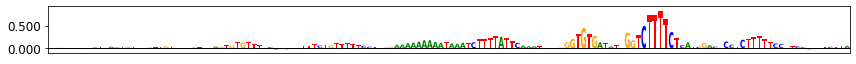

---
Interpreting pattern 1735...
Gene = DNA2
ID = chr10_68414064_-
Score[NT] - Score[CSTF3] = 1.7585
Y[NT] - Y[CSTF3] = 0.2918
[Dist site]
NT (scores) - Perturb (scores) = 


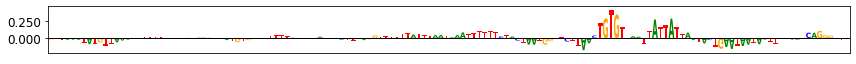

---
Interpreting pattern 2243...
Gene = VTI1A
ID = chr10_112818744_+
Score[NT] - Score[CSTF3] = 1.7935
Y[NT] - Y[CSTF3] = 0.3286
[Dist site]
NT (scores) - Perturb (scores) = 


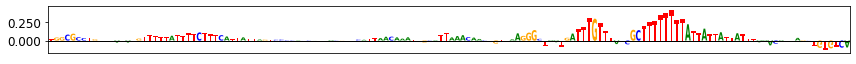

---


In [23]:
#CSTF3 hand-picked examples

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_CSTF3'

cell_type_1_ix = 0
cell_type_2_ix = 4

seq_start = 0
seq_end = 146

ixs = [714, 1735, 2243]

flat_ts_diff = flat_ts_merged[:, cell_type_2_ix] - flat_ts_merged[:, cell_type_1_ix]
flat_y_diff = flat_y[:, cell_type_2_ix] - flat_y[:, cell_type_1_ix]

for i in ixs :
    print("Interpreting pattern " + str(i) + "...")
    print("Gene = " + str(flat_gene_names[i]))
    print("ID = " + str(flat_ids[i]))
    print("Score[" + subset_cell_types[cell_type_1_ix] + "] - Score[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_ts_diff[i], 4)))
    print("Y[" + subset_cell_types[cell_type_1_ix] + "] - Y[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_y_diff[i], 4)))

    score_str = "Prox" if flat_prox_mask[i] == 1. else ("Middle" if flat_middle_mask[i] == 1. else "Dist")
    print("[" + score_str + " site]")

    print("NT (scores) - Perturb (scores) = ")
    plot_seq_scores(
        (flat_scores_merged[cell_type_1_ix, i, 0, seq_start:seq_end, :] - flat_scores_merged[cell_type_2_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :],
        figsize=(12, 1),
        plot_y_ticks=True,
        save_figs=save_figs,
        fig_name=fig_name + "_ism" + "_example_ix_" + str(i)
    )
    
    print("---")


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


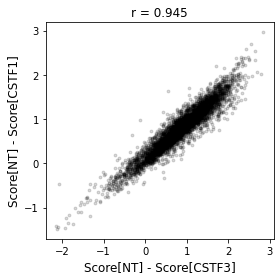

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


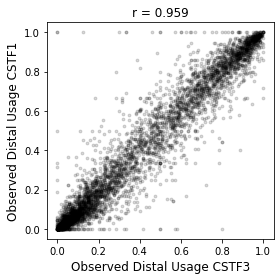

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


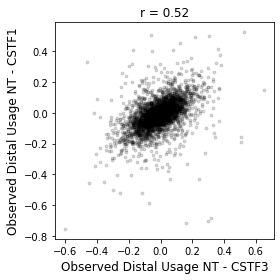

Interpreting pattern 714...
Gene = MCL1
ID = chr1_150574558_-
Score[NT] - Score[CSTF3] = 1.9499
Y[NT] - Y[CSTF3] = 0.2831
Score[NT] - Score[CSTF1] = 1.6272
Y[NT] - Y[CSTF1] = 0.1523
[Dist site]
NT (scores) - Perturb (scores) = 


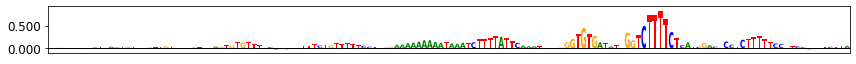

NT (scores) - Perturb (scores other) = 


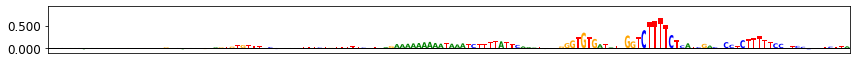

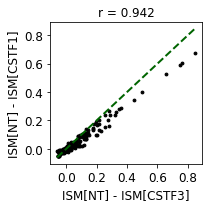

--- individual model patterns ---
NT (scores) - Perturb (scores) = 
bootstrap_ix = 0


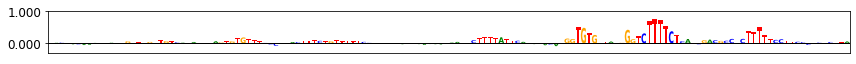

bootstrap_ix = 1


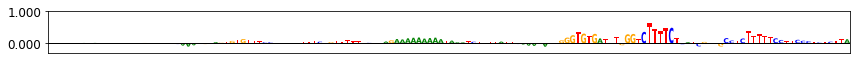

bootstrap_ix = 2


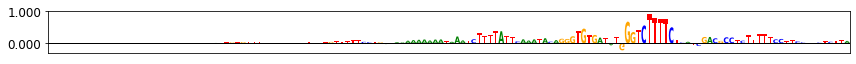

NT (scores) - Perturb (scores other) = 
bootstrap_ix = 0


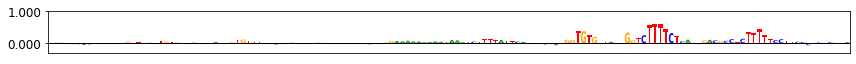

bootstrap_ix = 1


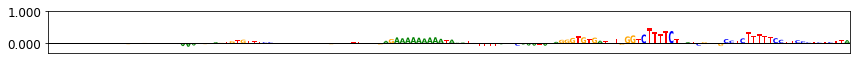

bootstrap_ix = 2


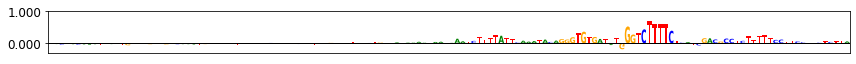

----------


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


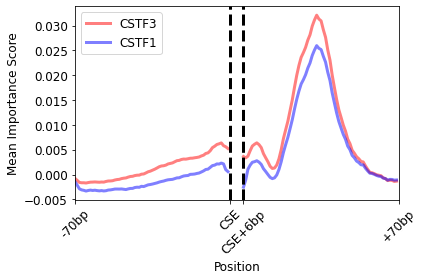

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


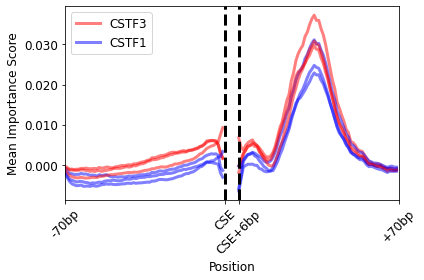

In [30]:
#CSTF3 vs. CSTF1 (distal)

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_CSTF3_vs_CSTF1'

cell_type_1_ix = 0
cell_type_2_ix = 4
cell_type_2_ix_other = 3

score_ix = 2

seq_start = 0
seq_end = 146

flat_ts_diff = flat_ts[:, cell_type_2_ix, score_ix] - flat_ts[:, cell_type_1_ix, score_ix]
flat_y_diff = flat_y[:, cell_type_2_ix] - flat_y[:, cell_type_1_ix]

flat_ts_diff_other = flat_ts[:, cell_type_2_ix_other, score_ix] - flat_ts[:, cell_type_1_ix, score_ix]
flat_y_diff_other = flat_y[:, cell_type_2_ix_other] - flat_y[:, cell_type_1_ix]

#Compare model scores and measurements for replicate cell types

r_val = spearmanr(flat_ts[flat_masks[score_ix] == 1., cell_type_1_ix, score_ix] - flat_ts[flat_masks[score_ix] == 1., cell_type_2_ix, score_ix], flat_ts[flat_masks[score_ix] == 1., cell_type_1_ix, score_ix] - flat_ts[flat_masks[score_ix] == 1., cell_type_2_ix_other, score_ix])[0]

f = plt.figure(figsize=(4, 4))

plt.scatter(flat_ts[flat_masks[score_ix] == 1., cell_type_1_ix, score_ix] - flat_ts[flat_masks[score_ix] == 1., cell_type_2_ix, score_ix], flat_ts[flat_masks[score_ix] == 1., cell_type_1_ix, score_ix] - flat_ts[flat_masks[score_ix] == 1., cell_type_2_ix_other, score_ix], color='black', alpha=0.15, s=8)

plt.xlabel("Score[NT] - Score[" + str(subset_cell_types[cell_type_2_ix]) + "]", fontsize=12)
plt.ylabel("Score[NT] - Score[" + str(subset_cell_types[cell_type_2_ix_other]) + "]", fontsize=12)

plt.title("r = " + str(round(r_val, 3)), fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_score_scatter.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_score_scatter.eps")

plt.show()

r_val = spearmanr(y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix]]], y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix_other]]])[0]

f = plt.figure(figsize=(4, 4))

plt.scatter(y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix]]], y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix_other]]], color='black', alpha=0.15, s=8)

plt.xlabel("Observed Distal Usage " + str(subset_cell_types[cell_type_2_ix]), fontsize=12)
plt.ylabel("Observed Distal Usage " + str(subset_cell_types[cell_type_2_ix_other]), fontsize=12)

plt.title("r = " + str(round(r_val, 3)), fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_pdui_scatter.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_pdui_scatter.eps")

plt.show()

r_val = spearmanr(y_dist[:, cell_type_dict[subset_cell_types[cell_type_1_ix]]] - y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix]]], y_dist[:, cell_type_dict[subset_cell_types[cell_type_1_ix]]] - y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix_other]]])[0]

f = plt.figure(figsize=(4, 4))

plt.scatter(y_dist[:, cell_type_dict[subset_cell_types[cell_type_1_ix]]] - y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix]]], y_dist[:, cell_type_dict[subset_cell_types[cell_type_1_ix]]] - y_dist[:, cell_type_dict[subset_cell_types[cell_type_2_ix_other]]], color='black', alpha=0.15, s=8)

plt.xlabel("Observed Distal Usage NT - " + str(subset_cell_types[cell_type_2_ix]), fontsize=12)
plt.ylabel("Observed Distal Usage NT - " + str(subset_cell_types[cell_type_2_ix_other]), fontsize=12)

plt.title("r = " + str(round(r_val, 3)), fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_pdui_residual_scatter.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_pdui_residual_scatter.eps")

plt.show()

#Compare pattern interpretations (hand-picked examples)
i = 714#1735#2243

print("Interpreting pattern " + str(i) + "...")
print("Gene = " + str(flat_gene_names[i]))
print("ID = " + str(flat_ids[i]))
print("Score[" + subset_cell_types[cell_type_1_ix] + "] - Score[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_ts_diff[i], 4)))
print("Y[" + subset_cell_types[cell_type_1_ix] + "] - Y[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_y_diff[i], 4)))
print("Score[" + subset_cell_types[cell_type_1_ix] + "] - Score[" + subset_cell_types[cell_type_2_ix_other] + "] = " + str(round(-flat_ts_diff_other[i], 4)))
print("Y[" + subset_cell_types[cell_type_1_ix] + "] - Y[" + subset_cell_types[cell_type_2_ix_other] + "] = " + str(round(-flat_y_diff_other[i], 4)))

score_str = "Prox" if flat_prox_mask[i] == 1. else ("Middle" if flat_middle_mask[i] == 1. else "Dist")
print("[" + score_str + " site]")

diff_scores = (flat_scores[cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores[cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]
diff_scores_other = (flat_scores[cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores[cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]

y_min = min(np.min(diff_scores), np.min(diff_scores_other)) - 0.1 * max(np.max(np.abs(diff_scores)), np.max(np.abs(diff_scores_other)))
y_max = max(np.max(diff_scores), np.max(diff_scores_other)) + 0.1 * max(np.max(np.abs(diff_scores)), np.max(np.abs(diff_scores_other)))

print("NT (scores) - Perturb (scores) = ")
plot_seq_scores(
    diff_scores,
    figsize=(12, 1),
    y_min=y_min, y_max=y_max,
    plot_y_ticks=True,
    save_figs=save_figs,
    fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix)
)

print("NT (scores) - Perturb (scores other) = ")
plot_seq_scores(
    diff_scores_other,
    figsize=(12, 1),
    y_min=y_min, y_max=y_max,
    plot_y_ticks=True,
    save_figs=save_figs,
    fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix_other)
)

#Scatter ISM scores between replicate perturbations
diff_scores_repl_1 = np.sum((flat_scores[cell_type_1_ix, score_ix, i, 0, :, :] - flat_scores[cell_type_2_ix, score_ix, i, 0, :, :]) * flat_x[i, 0, :, :], axis=-1)
diff_scores_repl_2 = np.sum((flat_scores[cell_type_1_ix, score_ix, i, 0, :, :] - flat_scores[cell_type_2_ix_other, score_ix, i, 0, :, :]) * flat_x[i, 0, :, :], axis=-1)

r_val = spearmanr(diff_scores_repl_1, diff_scores_repl_2)[0]

f = plt.figure(figsize=(3, 3))

plt.scatter(diff_scores_repl_1, diff_scores_repl_2, color='black', s=8)

min_v = min(np.min(diff_scores_repl_1), np.min(diff_scores_repl_2))
max_v = max(np.max(diff_scores_repl_1), np.max(diff_scores_repl_2))

plt.plot([min_v, max_v], [min_v, max_v], linewidth=2, linestyle='--', color='darkgreen')

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.xlabel("ISM[NT] - ISM[" + str(subset_cell_types[cell_type_2_ix]) + "]", fontsize=12)
plt.ylabel("ISM[NT] - ISM[" + str(subset_cell_types[cell_type_2_ix_other]) + "]", fontsize=12)

plt.title("r = " + str(round(r_val, 3)), fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism" + "_example_ix_" + str(i) + "_scatter.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism" + "_example_ix_" + str(i) + "_scatter.eps")

plt.show()

print("--- individual model patterns ---")

n_bootstraps = 3

print("NT (scores) - Perturb (scores) = ")

y_min = np.inf
y_max = -np.inf
y_max_abs = -np.inf
for bootstrap_ix in range(n_bootstraps) :
    y_min = min(y_min, np.min((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]))
    y_min = min(y_min, np.min((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]))
    
    y_max = max(y_max, np.max((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]))
    y_max = max(y_max, np.max((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :]))
    
    y_max_abs = max(y_max_abs, np.max(np.abs((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :])))
    y_max_abs = max(y_max_abs, np.max(np.abs((flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :])))

y_min = y_min - 0.1 * y_max_abs
y_max = y_max + 0.1 * y_max_abs

for bootstrap_ix in range(n_bootstraps) :
    
    print("bootstrap_ix = " + str(bootstrap_ix))

    plot_seq_scores(
        (flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :],
        figsize=(12, 1),
        y_min=y_min, y_max=y_max,
        plot_y_ticks=True,
        save_figs=save_figs,
        fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix) + "_bootstrap_ix_" + str(bootstrap_ix)
    )

print("NT (scores) - Perturb (scores other) = ")

for bootstrap_ix in range(n_bootstraps) :
    
    print("bootstrap_ix = " + str(bootstrap_ix))

    plot_seq_scores(
        (flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, i, 0, seq_start:seq_end, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :],
        figsize=(12, 1),
        y_min=y_min, y_max=y_max,
        plot_y_ticks=True,
        save_figs=save_figs,
        fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix_other) + "_bootstrap_ix_" + str(bootstrap_ix)
    )

print("----------")

#Plot mean importance score across position
mean_scores = np.mean(flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))
mean_scores_other = np.mean(flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix_other, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))

f = plt.figure(figsize=(6, 4))

l1 = plt.plot(np.arange(mean_scores.shape[0])[:70], mean_scores[:70], color='red', linewidth=3, alpha=0.5, label=str(subset_cell_types[cell_type_2_ix]))
plt.plot(np.arange(mean_scores.shape[0])[76:146], mean_scores[76:146], color='red', linewidth=3, alpha=0.5)

l2 = plt.plot(np.arange(mean_scores.shape[0])[:70], mean_scores_other[:70], color='blue', linewidth=3, alpha=0.5, label=str(subset_cell_types[cell_type_2_ix_other]))
plt.plot(np.arange(mean_scores.shape[0])[76:146], mean_scores_other[76:146], color='blue', linewidth=3, alpha=0.5)

plt.axvline(x=70, color='black', linewidth=3, linestyle='--')
plt.axvline(x=76, color='black', linewidth=3, linestyle='--')

plt.xlim(0, 145)
#plt.ylim(0.)

plt.xticks([0, 70, 76, 146], ["-70bp", "CSE", "CSE+6bp", "+70bp"], fontsize=12, rotation=45)
plt.yticks(fontsize=12)

plt.xlabel("Position", fontsize=12)
plt.ylabel("Mean Importance Score", fontsize=12)

plt.legend(handles=[l1[0], l2[0]], fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism_scores.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism_scores.eps")

plt.show()

#For individual bootstrap models of the ensemble

n_boostraps = 3

f = plt.figure(figsize=(6, 4))

l1 = None
l2 = None
for bootstrap_ix in range(n_bootstraps) :

    scores_curr = np.mean(flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))
    scores_curr_other = np.mean(flat_scores_ensemble[bootstrap_ix][cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores_ensemble[bootstrap_ix][cell_type_2_ix_other, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))

    l1t = plt.plot(np.arange(scores_curr.shape[0])[:70], scores_curr[:70], color='red', linewidth=3, alpha=0.5, label=str(subset_cell_types[cell_type_2_ix]) if bootstrap_ix == 0 else None)
    plt.plot(np.arange(scores_curr.shape[0])[76:146], scores_curr[76:146], color='red', linewidth=3, alpha=0.5)

    l2t = plt.plot(np.arange(scores_curr.shape[0])[:70], scores_curr_other[:70], color='blue', linewidth=3, alpha=0.5, label=str(subset_cell_types[cell_type_2_ix_other]) if bootstrap_ix == 0 else None)
    plt.plot(np.arange(scores_curr.shape[0])[76:146], scores_curr_other[76:146], color='blue', linewidth=3, alpha=0.5)

    if bootstrap_ix == 0 :
        l1 = l1t
        l2 = l2t

plt.axvline(x=70, color='black', linewidth=3, linestyle='--')
plt.axvline(x=76, color='black', linewidth=3, linestyle='--')

plt.xlim(0, 145)
#plt.ylim(0.)

plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.3f'))

plt.xticks([0, 70, 76, 146], ["-70bp", "CSE", "CSE+6bp", "+70bp"], fontsize=12, rotation=45)
plt.yticks(fontsize=12)

plt.xlabel("Position", fontsize=12)
plt.ylabel("Mean Importance Score", fontsize=12)

plt.legend(handles=[l1[0], l2[0]], fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism_scores_per_bootstrap.png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism_scores_per_bootstrap.eps")

plt.show()


Interpreting pattern 109...
Gene = ATF6
ID = chr1_161964070_+
Score[NT] - Score[RBBP6] = -0.7683
Y[NT] - Y[RBBP6] = -0.3289
[Dist site]
NT (scores) - Perturb (scores) = 


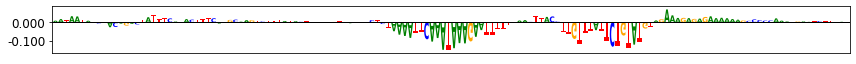

---
Interpreting pattern 271...
Gene = CTNNBIP1
ID = chr1_9848276_-
Score[NT] - Score[RBBP6] = -0.8304
Y[NT] - Y[RBBP6] = -0.3286
[Dist site]
NT (scores) - Perturb (scores) = 


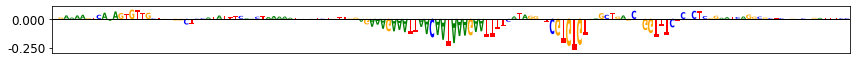

---


In [24]:
#RBBP6 hand-picked examples

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_RBBP6'

cell_type_1_ix = 0
cell_type_2_ix = 7

seq_start = 0
seq_end = 146

ixs = [109, 271]

flat_ts_diff = flat_ts_merged[:, cell_type_2_ix] - flat_ts_merged[:, cell_type_1_ix]
flat_y_diff = flat_y[:, cell_type_2_ix] - flat_y[:, cell_type_1_ix]

for i in ixs :
    print("Interpreting pattern " + str(i) + "...")
    print("Gene = " + str(flat_gene_names[i]))
    print("ID = " + str(flat_ids[i]))
    print("Score[" + subset_cell_types[cell_type_1_ix] + "] - Score[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_ts_diff[i], 4)))
    print("Y[" + subset_cell_types[cell_type_1_ix] + "] - Y[" + subset_cell_types[cell_type_2_ix] + "] = " + str(round(-flat_y_diff[i], 4)))

    score_str = "Prox" if flat_prox_mask[i] == 1. else ("Middle" if flat_middle_mask[i] == 1. else "Dist")
    print("[" + score_str + " site]")

    print("NT (scores) - Perturb (scores) = ")
    plot_seq_scores(
        (flat_scores_merged[cell_type_1_ix, i, 0, seq_start:seq_end, :] - flat_scores_merged[cell_type_2_ix, i, 0, seq_start:seq_end, :]) * flat_x[i, 0, seq_start:seq_end, :],
        figsize=(12, 1),
        plot_y_ticks=True,
        save_figs=save_figs,
        fig_name=fig_name + "_ism" + "_example_ix_" + str(i)
    )
    
    print("---")


Interpreting pattern 189...
Gene = CCSAP
ID = chr1_229321012_-
[Dist site]
--- cell_type_2 = 'NUDT21' ---


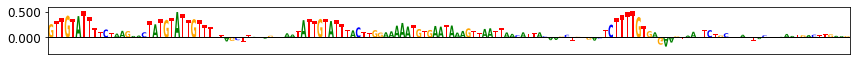

--- cell_type_2 = 'CPSF6' ---


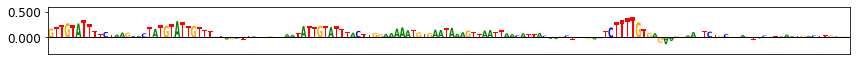

--- cell_type_2 = 'CSTF3' ---


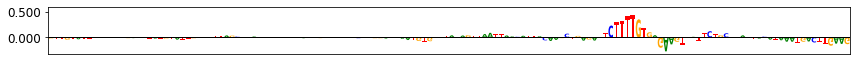

--- cell_type_2 = 'CSTF1' ---


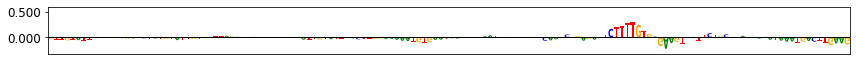

In [26]:
#ISMs and model scores across perturbations (same scale; hand-picked examples)

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_NUDT21_CSTF3_same_scale'

seq_start = 0
seq_end = 146

ixs = [189]

cell_type_index = [6, 2, 4, 3]

for i in ixs :
    print("Interpreting pattern " + str(i) + "...")
    print("Gene = " + str(flat_gene_names[i]))
    print("ID = " + str(flat_ids[i]))
    
    score_str = "Prox" if flat_prox_mask[i] == 1. else ("Middle" if flat_middle_mask[i] == 1. else "Dist")
    print("[" + score_str + " site]")

    diff_scores = (flat_scores_merged[cell_type_1_ix:cell_type_1_ix+1, i, 0, seq_start:seq_end, :] - flat_scores_merged[:, i, 0, seq_start:seq_end, :]) * flat_x[i, :, seq_start:seq_end, :]
    
    y_min = np.min(diff_scores[cell_type_index]) - 0.1 * np.max(np.abs(diff_scores[cell_type_index]))
    y_max = np.max(diff_scores[cell_type_index]) + 0.1 * np.max(np.abs(diff_scores[cell_type_index]))
    
    for cell_type_2_ix in cell_type_index :
    
        print("--- cell_type_2 = '" + str(subset_cell_types[cell_type_2_ix]) + "' ---")
    
        plot_seq_scores(
            diff_scores[cell_type_2_ix, :, :],
            figsize=(12, 1),
            y_min=y_min, y_max=y_max,
            plot_y_ticks=True,
            save_figs=save_figs,
            fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix)
        )


Interpreting pattern 189...
Gene = CCSAP
ID = chr1_229321012_-
[Dist site]
--- cell_type_2 = 'NUDT21' ---


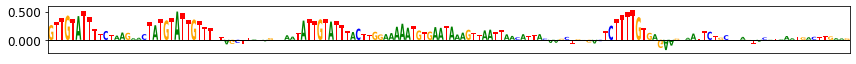

--- cell_type_2 = 'CSTF3' ---


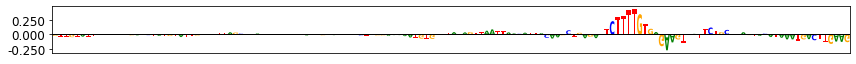

--- cell_type_2 = 'RBBP6' ---


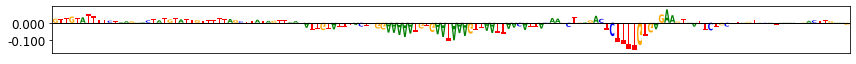

In [19]:
#ISMs and model scores across perturbations (same scale; hand-picked examples)

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_NUDT21_CSTF3'

seq_start = 0
seq_end = 146

ixs = [189]

cell_type_1_ix = 0

cell_type_index = [6, 4, 7]

for i in ixs :
    print("Interpreting pattern " + str(i) + "...")
    print("Gene = " + str(flat_gene_names[i]))
    print("ID = " + str(flat_ids[i]))
    
    score_str = "Prox" if flat_prox_mask[i] == 1. else ("Middle" if flat_middle_mask[i] == 1. else "Dist")
    print("[" + score_str + " site]")

    diff_scores = (flat_scores_merged[cell_type_1_ix:cell_type_1_ix+1, i, 0, seq_start:seq_end, :] - flat_scores_merged[:, i, 0, seq_start:seq_end, :]) * flat_x[i, :, seq_start:seq_end, :]
    
    y_min = np.min(diff_scores[cell_type_index]) - 0.1 * np.max(np.abs(diff_scores[cell_type_index]))
    y_max = np.max(diff_scores[cell_type_index]) + 0.1 * np.max(np.abs(diff_scores[cell_type_index]))
    
    for cell_type_2_ix in cell_type_index :
    
        print("--- cell_type_2 = '" + str(subset_cell_types[cell_type_2_ix]) + "' ---")
    
        plot_seq_scores(
            diff_scores[cell_type_2_ix, :, :],
            figsize=(12, 1),
            #y_min=y_min, y_max=y_max,
            plot_y_ticks=True,
            save_figs=save_figs,
            fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix)
        )


Interpreting pattern 1766...
Gene = ERLIN1
ID = chr10_100150094_-
[Dist site]
--- cell_type_2 = 'NUDT21' ---


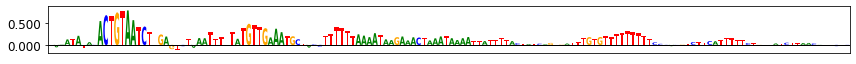

--- cell_type_2 = 'CSTF3' ---


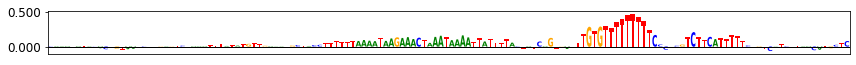

--- cell_type_2 = 'RBBP6' ---


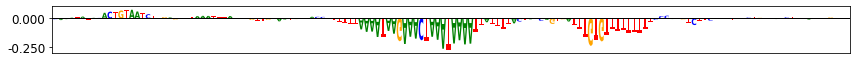

Interpreting pattern 3308...
Gene = KMT5A
ID = chr12_123409358_+
[Dist site]
--- cell_type_2 = 'NUDT21' ---


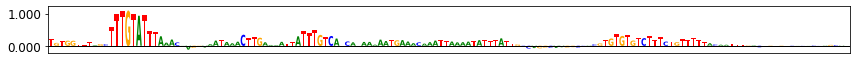

--- cell_type_2 = 'CSTF3' ---


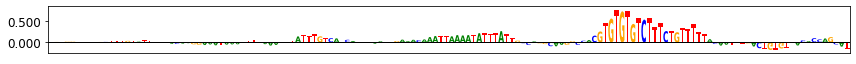

--- cell_type_2 = 'RBBP6' ---


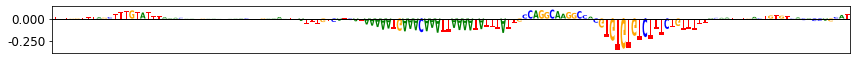

Interpreting pattern 11299...
Gene = PAIP2
ID = chr5_139369717_+
[Dist site]
--- cell_type_2 = 'NUDT21' ---


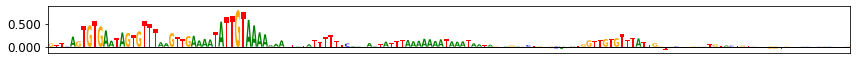

--- cell_type_2 = 'CSTF3' ---


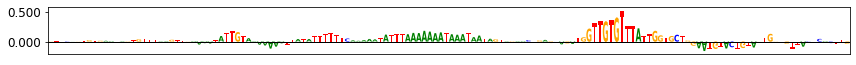

--- cell_type_2 = 'RBBP6' ---


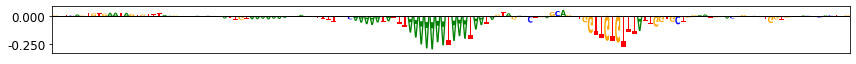

In [20]:
#ISMs and model scores across perturbations (same scale; hand-picked examples)

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_NUDT21_CSTF3_RBBP6'

seq_start = 0
seq_end = 146

ixs = [1766, 3308, 11299]

cell_type_1_ix = 0

cell_type_index = [6, 4, 7]

for i in ixs :
    print("Interpreting pattern " + str(i) + "...")
    print("Gene = " + str(flat_gene_names[i]))
    print("ID = " + str(flat_ids[i]))
    
    score_str = "Prox" if flat_prox_mask[i] == 1. else ("Middle" if flat_middle_mask[i] == 1. else "Dist")
    print("[" + score_str + " site]")

    diff_scores = (flat_scores_merged[cell_type_1_ix:cell_type_1_ix+1, i, 0, seq_start:seq_end, :] - flat_scores_merged[:, i, 0, seq_start:seq_end, :]) * flat_x[i, :, seq_start:seq_end, :]
    
    y_min = np.min(diff_scores[cell_type_index]) - 0.1 * np.max(np.abs(diff_scores[cell_type_index]))
    y_max = np.max(diff_scores[cell_type_index]) + 0.1 * np.max(np.abs(diff_scores[cell_type_index]))
    
    for cell_type_2_ix in cell_type_index :
    
        print("--- cell_type_2 = '" + str(subset_cell_types[cell_type_2_ix]) + "' ---")
    
        plot_seq_scores(
            diff_scores[cell_type_2_ix, :, :],
            figsize=(12, 1),
            #y_min=y_min, y_max=y_max,
            plot_y_ticks=True,
            save_figs=save_figs,
            fig_name=fig_name + "_ism" + "_example_ix_" + str(i) + "_cell_type_2_ix_" + str(cell_type_2_ix)
        )


--- cell_type_2 = 'NUDT21' ---
NUDT21_pwm_0_fwd
0.042685610221308165
0.8506891503053553


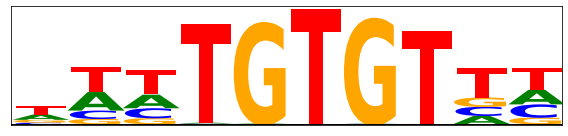

----------
NUDT21_pwm_1_fwd
0.16534737642112585
0.9294057541792092


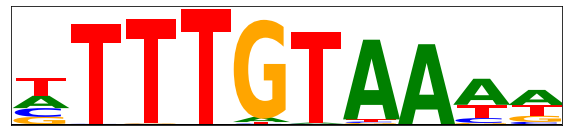

----------
NUDT21_pwm_2_fwd
0.0720766422631857
0.912656715588692


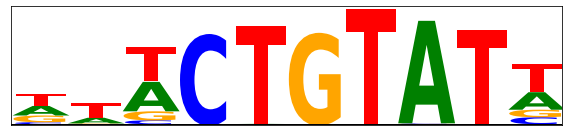

----------
NUDT21_pwm_3_fwd
0.20631838203606445
0.8966035753347298


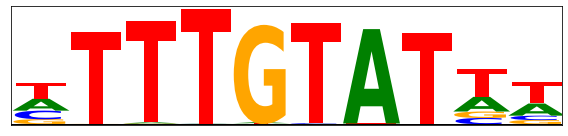

----------
NUDT21_pwm_4_fwd
0.018261191461767454
0.8037952280774409


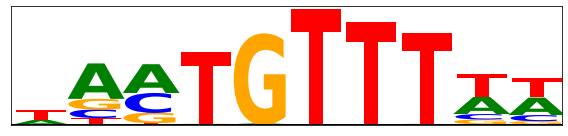

----------
NUDT21_pwm_5_fwd
-1.1682650210939616e-05
0.815986765584638


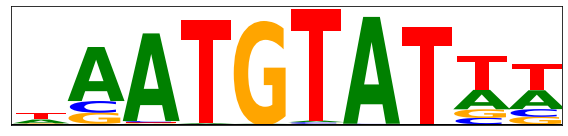

----------
NUDT21_pwm_6_fwd
0.20659450541387447
0.7534644860226113


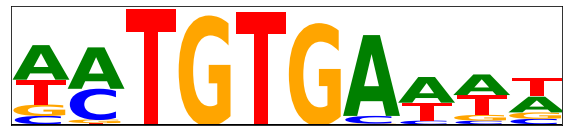

----------
NUDT21_pwm_7_fwd
0.17419561194286282
0.7234382584351282


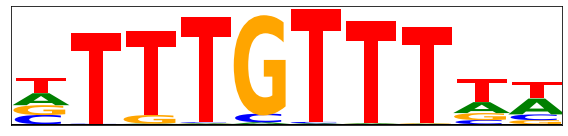

----------
NUDT21_pwm_8_fwd
0.041648255234144824
0.7510004138629698


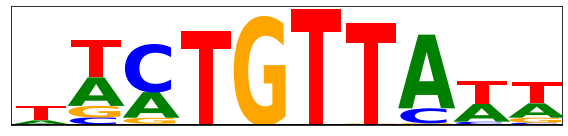

----------
NUDT21_pwm_9_fwd
0.12008685202434147
0.7208340114560621


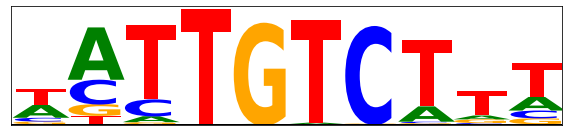

----------
NUDT21_pwm_10_fwd
0.1972596716700178
0.8995976557334264


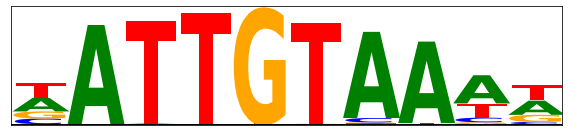

----------
NUDT21_pwm_11_fwd
0.10138721563776985
0.8509733772668683


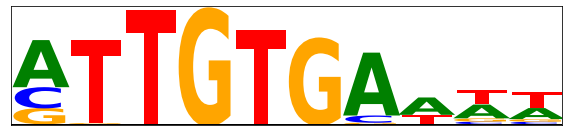

----------
NUDT21_pwm_12_fwd
0.07204392809590858
0.7846636426152035


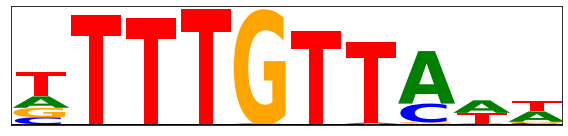

----------
NUDT21_pwm_13_fwd
0.27328587126224596
0.6187370945544953


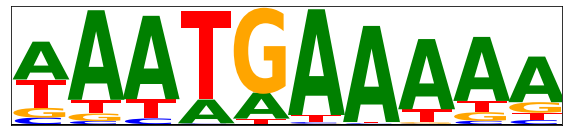

----------
NUDT21_pwm_14_fwd
0.20487122599854063
0.8502811346353437


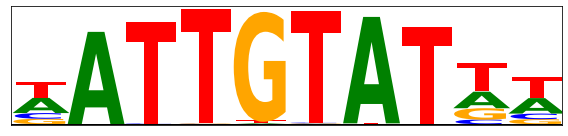

----------
NUDT21_pwm_15_fwd
0.05402772738554766
0.7958111511212644


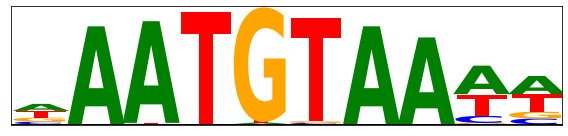

----------
NUDT21_pwm_16_fwd
0.08605463285491152
0.8372860973736025


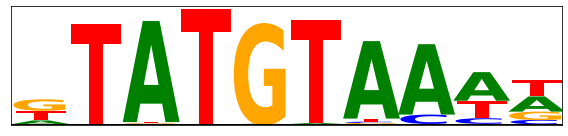

----------
NUDT21_pwm_17_fwd
0.15448027792159447
0.9529135572282892


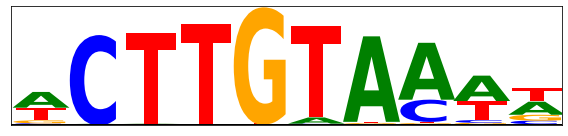

----------
NUDT21_pwm_18_fwd
-0.04080223041830711
0.8382204798818792


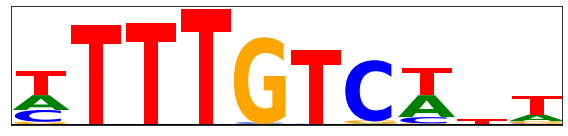

----------
NUDT21_pwm_19_fwd
0.1317541551350349
0.8211743028918702


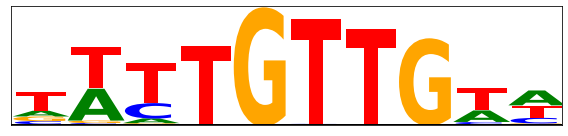

----------
NUDT21_pwm_20_fwd
0.10209649838702216
0.9304996625291115


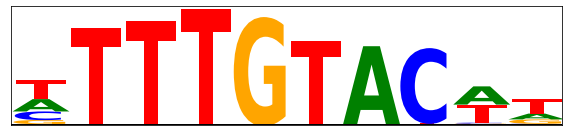

----------
NUDT21_pwm_21_fwd
0.12391288660942237
0.9142726743474919


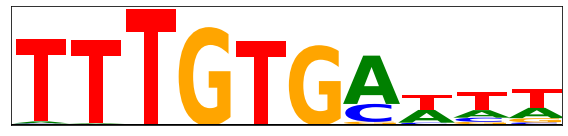

----------
NUDT21_pwm_22_fwd
0.12870762627175514
0.8810394084199946


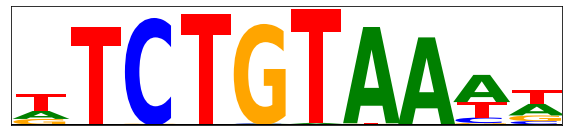

----------
NUDT21_pwm_23_fwd
0.18803325987631275
0.9112996915335296


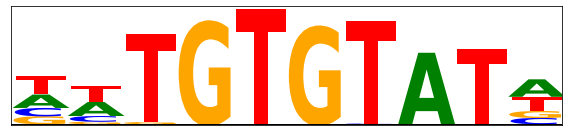

----------
NUDT21_pwm_24_fwd
0.1676652136813389
0.7347445380821657


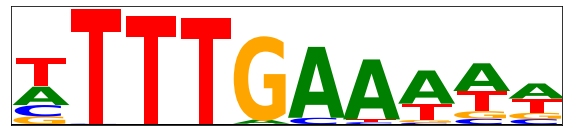

----------
NUDT21_pwm_25_fwd
0.1315999071738299
0.7546038930556354


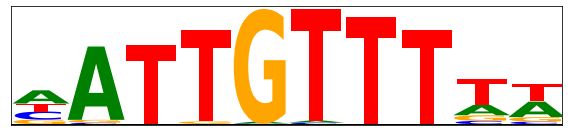

----------
NUDT21_pwm_26_fwd
0.09475999963497686
0.8358261642341842


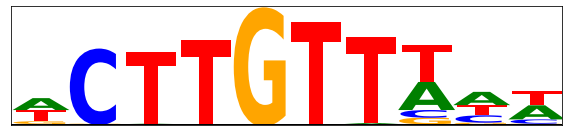

----------
NUDT21_pwm_27_fwd
0.22779087438905168
0.9945548313892693


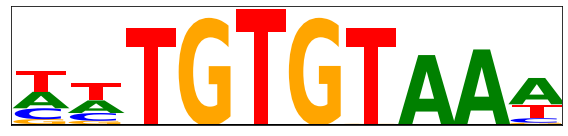

----------
NUDT21_pwm_28_fwd
0.1340273843952483
0.7250195267741665


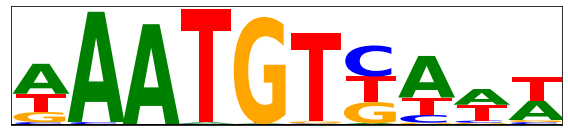

----------
NUDT21_pwm_29_fwd
0.07196259101231893
0.8062113899451036


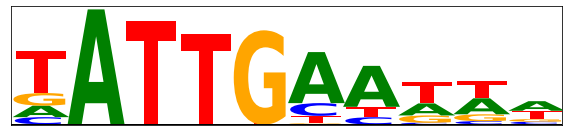

----------
NUDT21_pwm_30_fwd
-0.008774261600923865
0.7599603008750259


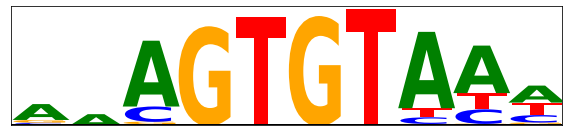

----------
NUDT21_pwm_31_fwd
0.07005269304911294
0.7601427211761475


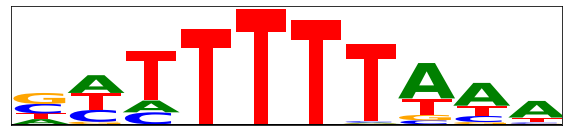

----------
NUDT21_pwm_32_fwd
0.13628501441027666
0.9022583806836928


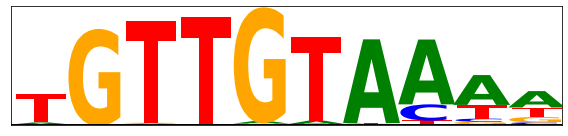

----------
NUDT21_pwm_33_fwd
0.04571738159739887
0.8364720381223238


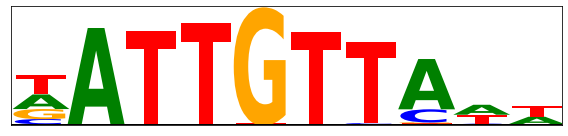

----------
NUDT21_pwm_34_fwd
0.10471959449875522
0.811335359492772


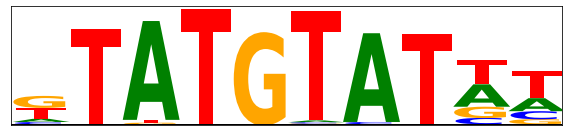

----------
NUDT21_pwm_35_fwd
0.10933822359837274
0.8867171133068246


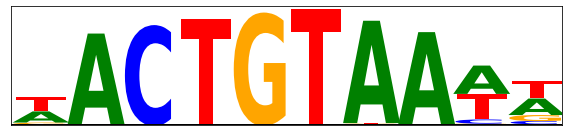

----------
NUDT21_pwm_36_fwd
0.08638193049329394
0.8004875101941696


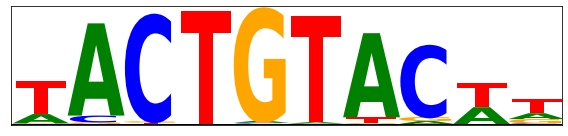

----------
NUDT21_pwm_37_fwd
-0.1250390244953668
0.7975121704500112


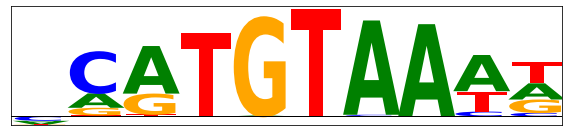

----------
NUDT21_pwm_38_fwd
0.08546433332489757
0.8695393275439254


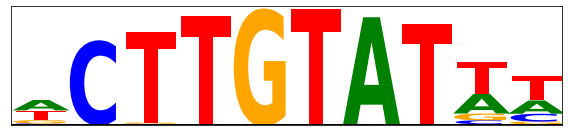

----------
NUDT21_pwm_39_fwd
0.04466773641520533
0.8142146209190633


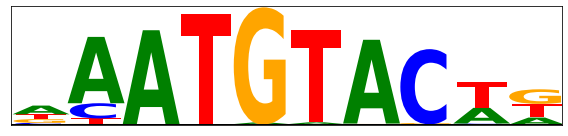

----------
NUDT21_pwm_40_fwd
0.06546209900124561
0.9639455515204124


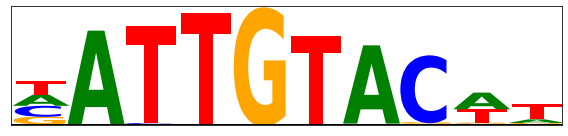

----------
NUDT21_pwm_41_fwd
-0.09391259050369263
0.8027857646942139


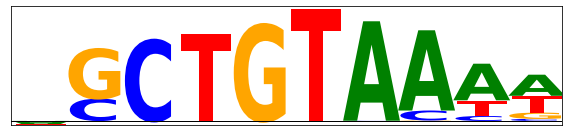

----------
NUDT21_pwm_42_fwd
0.13422702464860736
0.8772016584258719


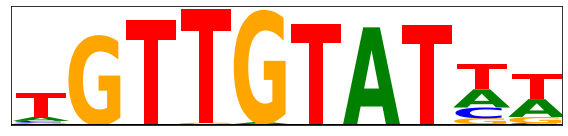

----------
NUDT21_pwm_43_fwd
0.1274117436519889
0.8460470953653025


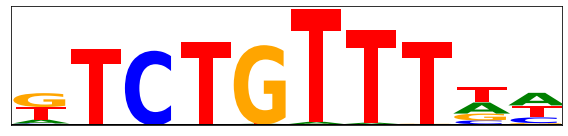

----------
NUDT21_pwm_44_fwd
0.03381155610084534
0.8100534629821777


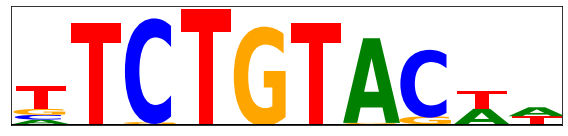

----------
NUDT21_pwm_45_fwd
0.11286524920850187
0.727752837619266


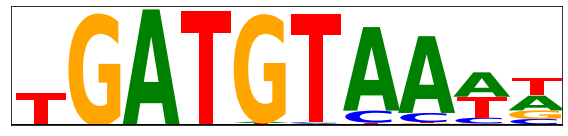

----------
NUDT21_pwm_46_fwd
0.018659858181052008
0.7255802298245365


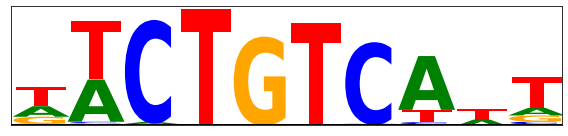

----------
NUDT21_pwm_47_fwd
0.14106216870821442
0.7945899259127103


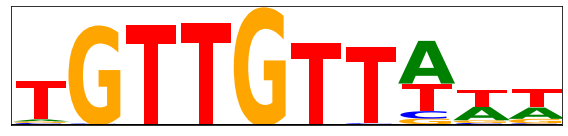

----------
NUDT21_pwm_48_fwd
-0.04741312776293074
0.7541570493153164


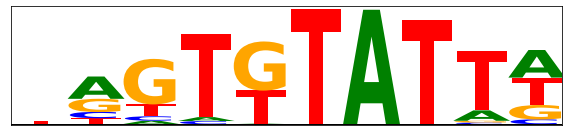

----------
NUDT21_pwm_49_fwd
-0.16306135429526275
0.8430433597204819


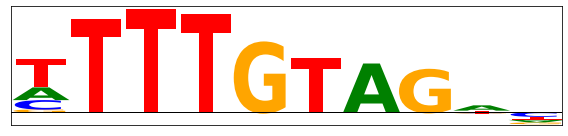

----------
NUDT21_pwm_50_fwd
-0.11913486171413111
0.8670569342535894


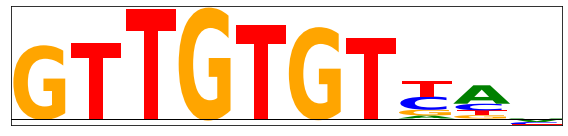

----------
--- cell_type_2 = 'CSTF3' ---
CSTF3_pwm_0_fwd
-0.00942058910032828
0.6264448110201805


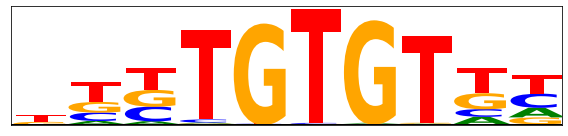

----------
CSTF3_pwm_1_fwd
0.047332711268992175
0.5480411866368764


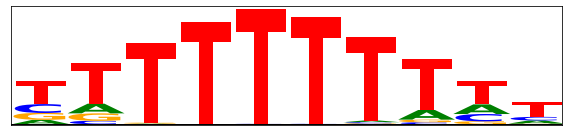

----------
CSTF3_pwm_2_fwd
0.09273639518507037
0.5761865556578105


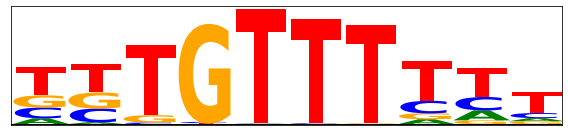

----------
CSTF3_pwm_3_fwd
0.023306302043132422
0.5898753046510047


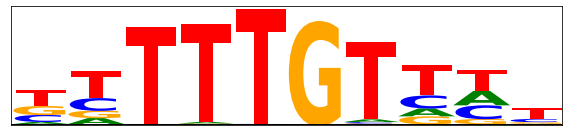

----------
CSTF3_pwm_4_fwd
0.11621185855773111
0.5173157384262824


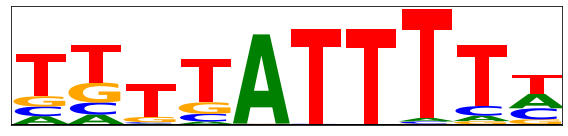

----------
CSTF3_pwm_5_fwd
0.024339427947998038
0.5623812274543607


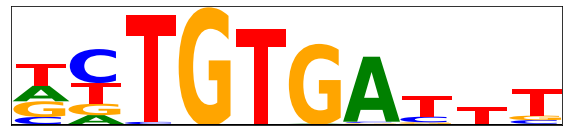

----------
CSTF3_pwm_6_fwd
0.24722441128924885
0.581988933656068


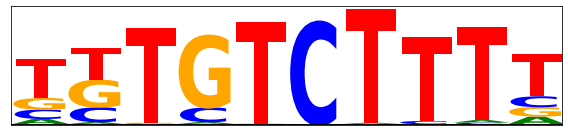

----------
CSTF3_pwm_7_fwd
0.04012798852327337
0.5323763596384149


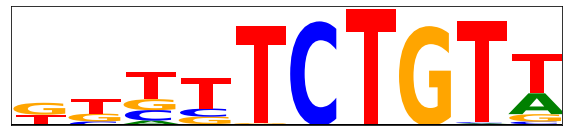

----------
CSTF3_pwm_8_fwd
0.0001009127943988053
0.5412100943966188


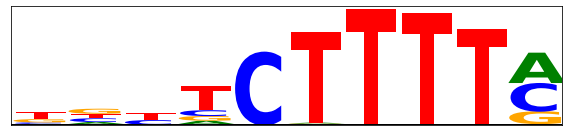

----------
CSTF3_pwm_9_fwd
0.07791184694339068
0.5171844086280236


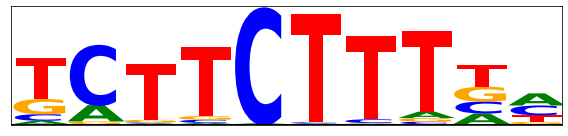

----------
CSTF3_pwm_10_fwd
0.042483028192170626
0.5065187354362448


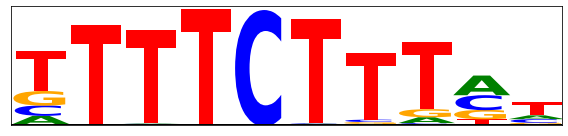

----------
CSTF3_pwm_11_fwd
0.13998520246116064
0.5090463802378665


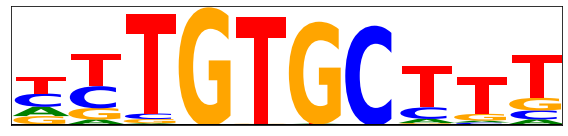

----------
CSTF3_pwm_12_fwd
0.070468285408887
0.6010147571563721


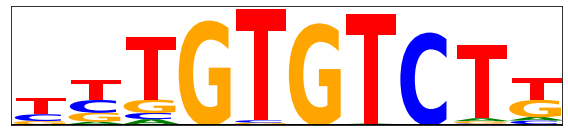

----------
CSTF3_pwm_13_fwd
0.10963301289151285
0.5373627316184908


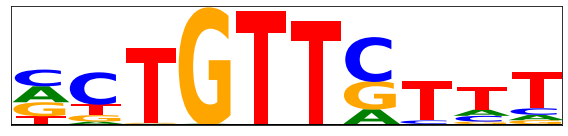

----------
CSTF3_pwm_14_fwd
0.18671699230160033
0.5804966989017668


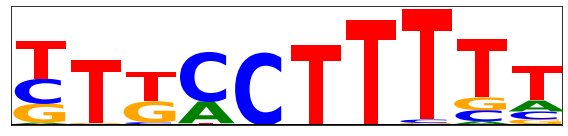

----------
CSTF3_pwm_15_fwd
0.004320633628151625
0.6069252904256185


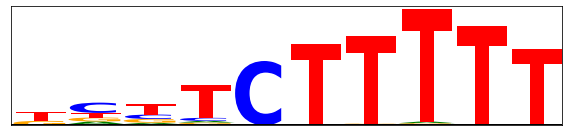

----------
CSTF3_pwm_16_fwd
0.2050706318446568
0.47886507851736887


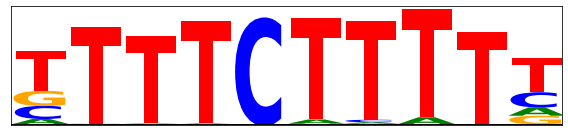

----------
CSTF3_pwm_17_fwd
-0.026425715855189734
0.5724684647151402


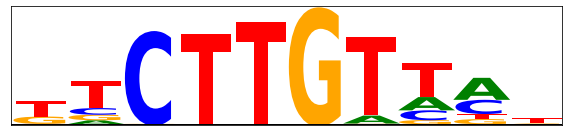

----------
CSTF3_pwm_18_fwd
-0.027180398523417956
0.5620595850975685


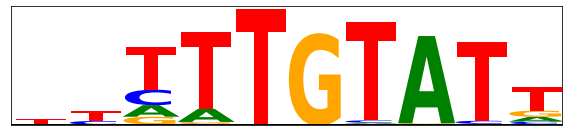

----------
CSTF3_pwm_19_fwd
0.127290980231683
0.4535191719105702


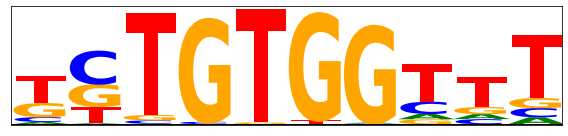

----------
CSTF3_pwm_20_fwd
0.07915621284780831
0.5139092212298821


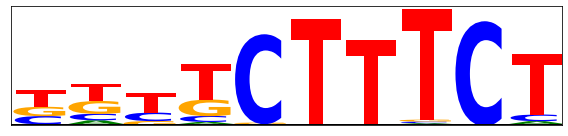

----------
CSTF3_pwm_21_fwd
0.12473797223863808
0.5273574656813684


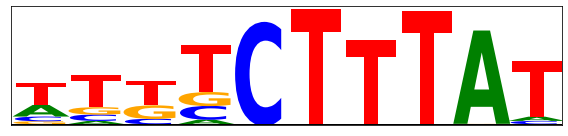

----------
CSTF3_pwm_22_fwd
-0.011581570144713393
0.5358789295662106


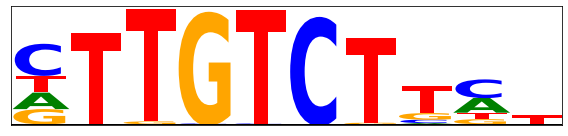

----------
CSTF3_pwm_23_fwd
-0.036063672139726846
0.5055878409023943


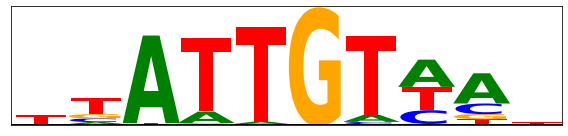

----------
CSTF3_pwm_24_fwd
0.022516283781632125
0.5038142494533373


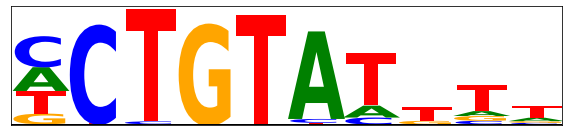

----------
CSTF3_pwm_25_fwd
-0.008924081789708778
0.5447499556879026


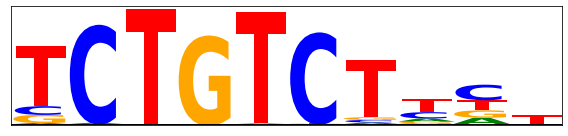

----------
CSTF3_pwm_26_fwd
0.09776568911292335
0.5681849288940429


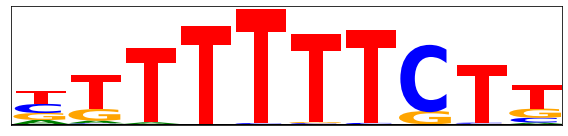

----------
CSTF3_pwm_27_fwd
0.2227208161572797
0.5459936446006145


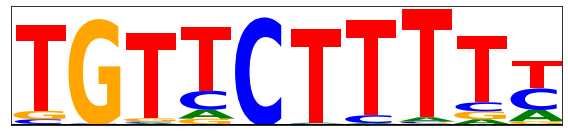

----------
CSTF3_pwm_28_fwd
0.1445968324892989
0.5522337432219604


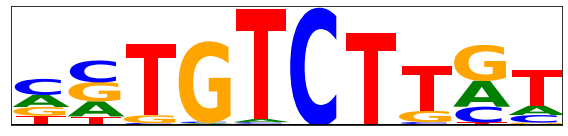

----------
CSTF3_pwm_29_fwd
0.21425045266443368
0.5184961095148203


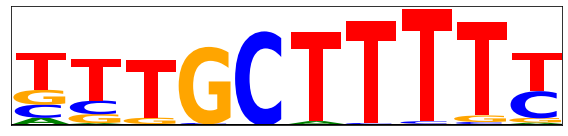

----------
CSTF3_pwm_30_fwd
0.023175036388894774
0.49018181510593584


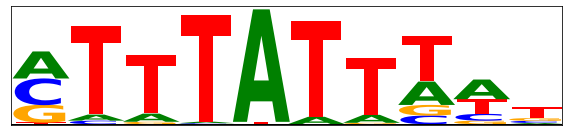

----------
CSTF3_pwm_31_fwd
0.04101691216230393
0.5096874269843101


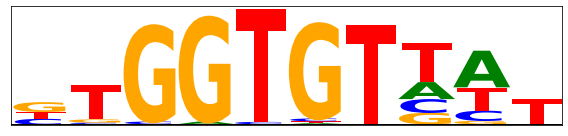

----------
CSTF3_pwm_32_fwd
0.12508249521255493
0.5880914664268493


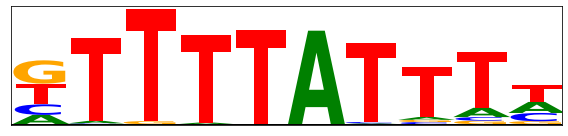

----------
CSTF3_pwm_33_fwd
0.19281449019908906
0.553003354707072


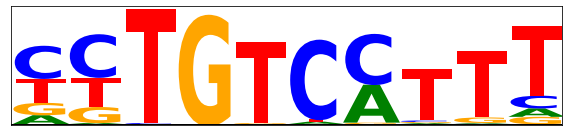

----------
CSTF3_pwm_34_fwd
0.20001403407046672
0.6589874685856334


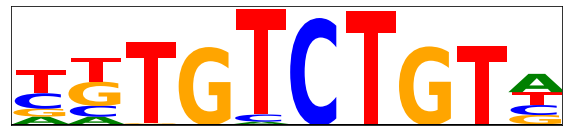

----------
CSTF3_pwm_35_fwd
0.08007566840560348
0.5236783575128626


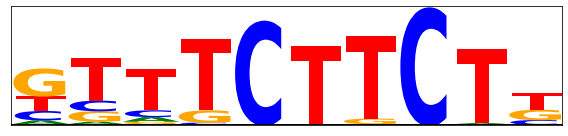

----------
CSTF3_pwm_36_fwd
0.012240764072963164
0.6031096867152623


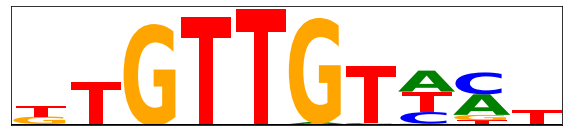

----------
CSTF3_pwm_37_fwd
0.16922173208119917
0.5544493928247568


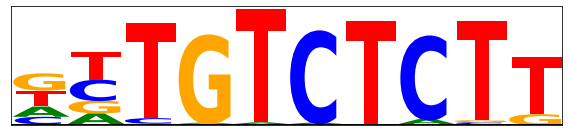

----------
--- cell_type_2 = 'RBBP6' ---
RBBP6_pwm_0_fwd
0.08131378263122913
0.19835130473601173


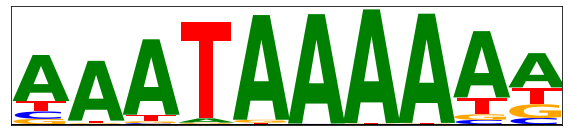

----------
RBBP6_pwm_1_fwd
0.02101620319977547
0.2215556935199256


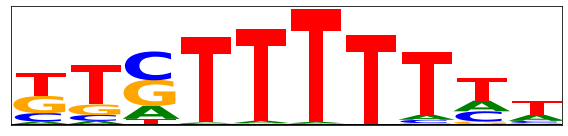

----------
RBBP6_pwm_2_fwd
0.10431467056274416
0.27332090377807616


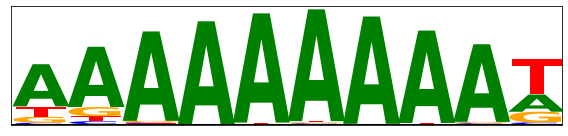

----------
RBBP6_pwm_3_fwd
0.10463260823808362
0.2051504754654282


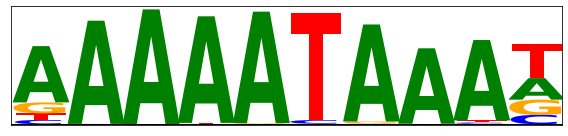

----------
RBBP6_pwm_4_fwd
0.11808344328303855
0.2100669267117811


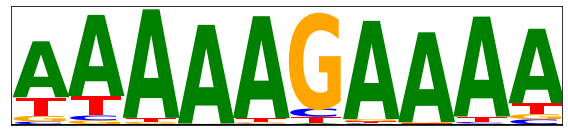

----------
RBBP6_pwm_5_fwd
0.041453406588329175
0.21650495501370887


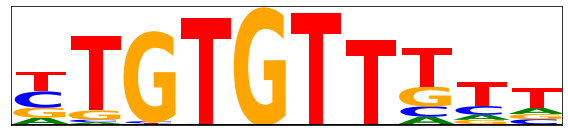

----------
RBBP6_pwm_6_fwd
0.0528378327221465
0.23845860881190148


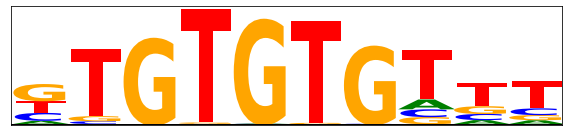

----------
RBBP6_pwm_7_fwd
0.08323360717933598
0.1830506579566548


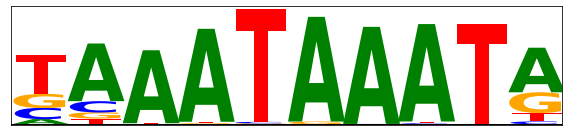

----------
RBBP6_pwm_8_fwd
0.012556805647195985
0.20787727677502393


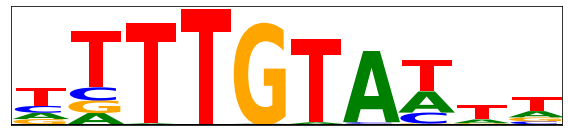

----------
RBBP6_pwm_9_fwd
0.04056911873541284
0.20640164526272925


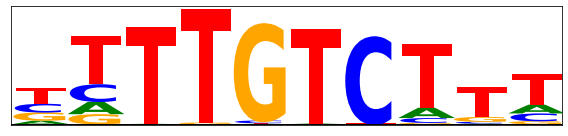

----------
RBBP6_pwm_10_fwd
0.06448424303973163
0.20414167863351326


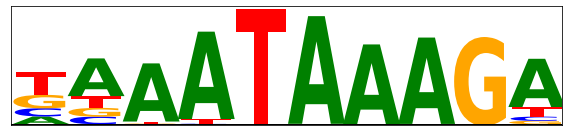

----------
RBBP6_pwm_11_fwd
0.049121490710882974
0.185604006384835


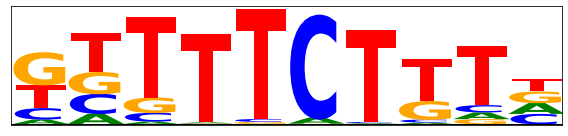

----------
RBBP6_pwm_12_fwd
0.03363684619811767
0.2078439151539522


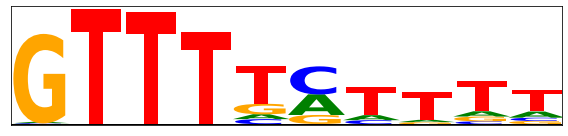

----------
RBBP6_pwm_13_fwd
0.023187346954566205
0.19500757118180997


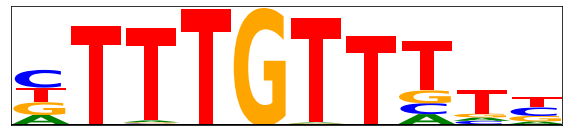

----------
RBBP6_pwm_14_fwd
0.05362903905469317
0.2040961831115013


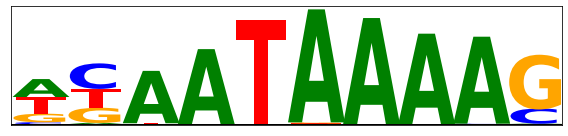

----------
RBBP6_pwm_15_fwd
0.060226983683449885
0.19202139718191963


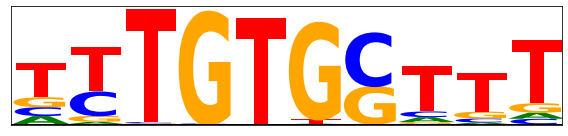

----------
RBBP6_pwm_16_fwd
0.04533318712667454
0.23065058234279143


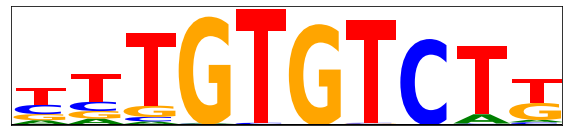

----------
RBBP6_pwm_17_fwd
0.024740632075183788
0.19864010600923745


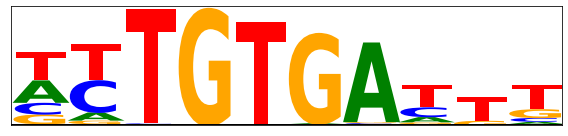

----------
RBBP6_pwm_18_fwd
-0.019855700174967447
0.22650976562500003


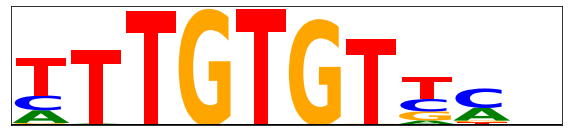

----------
RBBP6_pwm_19_fwd
-0.018259501295024842
0.20530801760096126


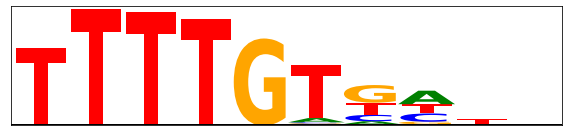

----------
RBBP6_pwm_20_fwd
0.019551368498466382
0.2137354891065141


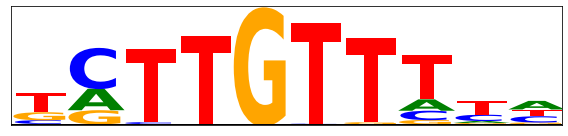

----------
RBBP6_pwm_21_fwd
0.0031116832386363577
0.18419922192891441


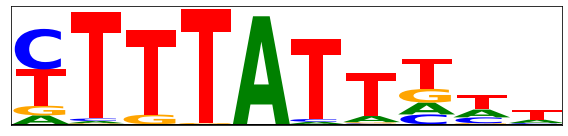

----------
RBBP6_pwm_22_fwd
0.014479748285733743
0.2247875037560096


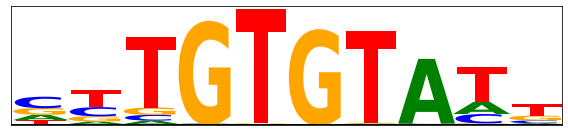

----------
RBBP6_pwm_23_fwd
0.00513141786950266
0.1890670234321529


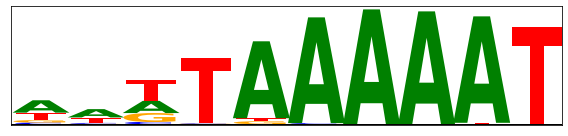

----------
RBBP6_pwm_24_fwd
-0.010908690328183385
0.24386984120244565


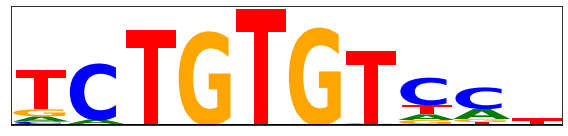

----------
RBBP6_pwm_25_fwd
0.05922410384468411
0.2011616914168648


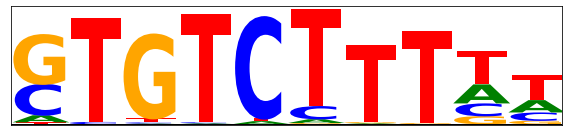

----------
RBBP6_pwm_26_fwd
0.037755670962126356
0.20586993673573367


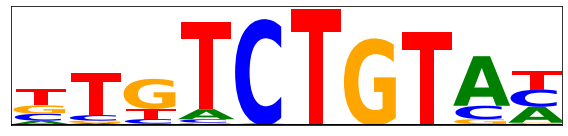

----------
RBBP6_pwm_27_fwd
0.04879092645207676
0.2081261871057913


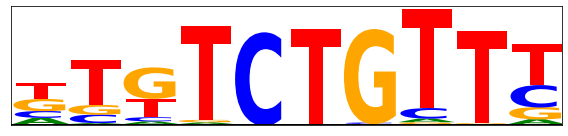

----------
RBBP6_pwm_28_fwd
0.020179210844494047
0.20270635695684525


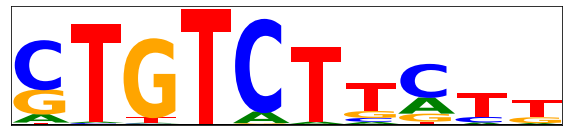

----------
RBBP6_pwm_29_fwd
0.0010558976067437074
0.20309244791666664


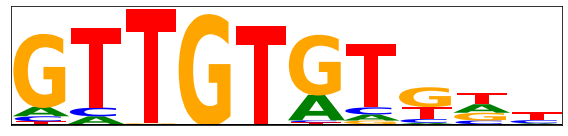

----------
RBBP6_pwm_30_fwd
-0.005807402761358967
0.22516861765008223


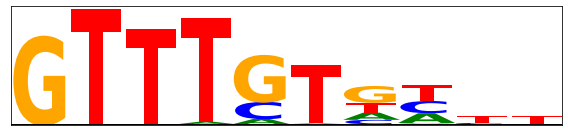

----------
RBBP6_pwm_31_fwd
0.048783725119651636
0.1837582659214101


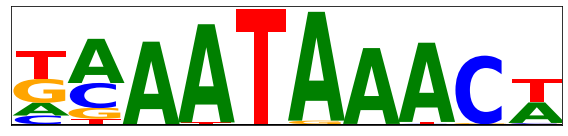

----------
RBBP6_pwm_32_fwd
-0.019772630327203302
0.2094361637415511


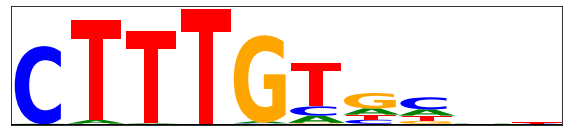

----------
RBBP6_pwm_33_fwd
0.018656693776448564
0.18451999537150066


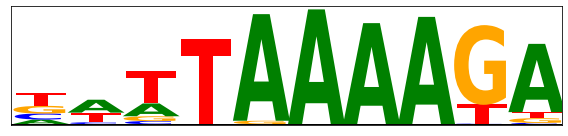

----------
RBBP6_pwm_34_fwd
0.08257043226709906
0.19909529775943396


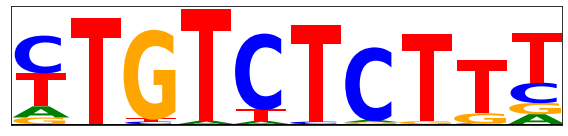

----------
RBBP6_pwm_35_fwd
0.0684854962609031
0.18716230392456054


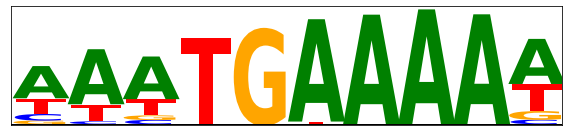

----------
RBBP6_pwm_36_fwd
0.04513620775799419
0.1731709325036337


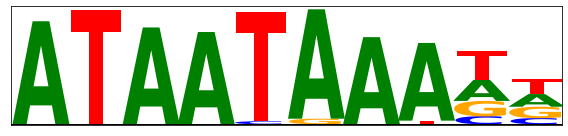

----------
RBBP6_pwm_37_fwd
0.05026918411254884
0.20788482666015623


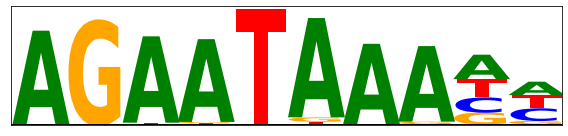

----------
RBBP6_pwm_38_fwd
0.07798924301609848
0.20394694010416664


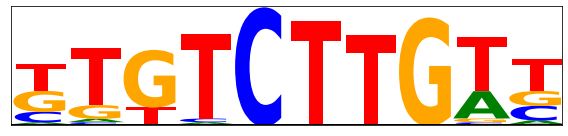

----------


In [19]:
#NUDT21, CSTF3 and RBBP6 UGUA vs. GUGU (and AWUAAA) analysis

import h5py

#Load NUDT21 modisco PWMs

seq_start = 0
seq_end = 205

cell_type_1_ix = 0
cell_type_2_index = [6, 4, 7]

modisco_suffixes = ['', '', '_neg']

score_ix = 2

modisco_fs = [h5py.File('polyadb_features_pas_3_utr3_perturb_resnet_covar_drop_seq_start_' + str(seq_start) + '_seq_end_' + str(seq_end) + '_tfmodisco_out_cell_type_ix_1_' + str(cell_type_1_ix) + '_cell_type_ix_2_' + str(cell_type_2_ix) + '_score_ix_' + str(score_ix) + '_no_rc' + modisco_suffixes[modisco_i] + '.h5', 'r') for modisco_i, cell_type_2_ix in enumerate(cell_type_2_index)]

all_pwms = [[] for _ in range(len(cell_type_2_index))]
all_contribs = [[] for _ in range(len(cell_type_2_index))]
all_hypo_contribs = [[] for _ in range(len(cell_type_2_index))]

pwm_names = [[] for _ in range(len(cell_type_2_index))]

for modisco_i, cell_type_2_ix in enumerate(cell_type_2_index) :

    print("--- cell_type_2 = '" + str(subset_cell_types[cell_type_2_ix]) + "' ---")
    
    fwd_pwms = []
    fwd_contribs = []
    fwd_hypo_contribs = []

    patterns = modisco_fs[modisco_i]['metacluster_idx_to_submetacluster_results']['metacluster_0']['seqlets_to_patterns_result']['patterns']

    for i in range(len(patterns) - 1) :
        fwd_pwms.append(patterns["pattern_" + str(i)]["sequence"]["fwd"][()])
        fwd_contribs.append(patterns["pattern_" + str(i)]["task_contrib_scores"]["fwd"][()])
        fwd_hypo_contribs.append(patterns["pattern_" + str(i)]["task_hypothetical_contribs"]["fwd"][()])

    for i in range(len(patterns) - 1) :
        all_pwms[modisco_i].append(fwd_pwms[i])
        all_contribs[modisco_i].append(fwd_contribs[i])
        all_hypo_contribs[modisco_i].append(fwd_hypo_contribs[i])

        pwm_names[modisco_i].append(str(subset_cell_types[cell_type_2_ix]) + "_pwm_" + str(i) + "_fwd")

    #Plot PWMs
    for i in range(len(all_pwms[modisco_i])) :
        print(pwm_names[modisco_i][i])

        plot_pwm_2(all_contribs[modisco_i][i], figsize=(8, 2), plot_y_ticks=False)

        print("----------")


4583
10181


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


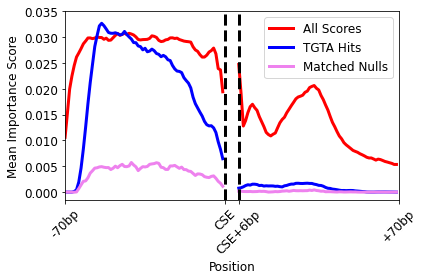

In [29]:
#Analysis 1: TGTA motifs

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_NUDT21_TGTA'

filter_sites = False

filter_suffix = ''
if filter_sites :
    filter_suffix = '_filtered'

modisco_i = 0

pattern_index = [1, 2, 3, 5, 10, 14, 15, 16, 17, 20, 22, 23, 27, 30, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 49]

pattern_width = 10

seq_start = 0
seq_end = 146

cell_type_1_ix = 0
cell_type_2_ix = 6

score_ix = 2

y_min = -0.0015
y_max = 0.035

all_pwm_matches = []
all_pwm_match_poses = []

modisco_f = modisco_fs[modisco_i]

for pattern_ix in pattern_index :

    pwm_match_l = modisco_f['metacluster_idx_to_submetacluster_results']['metacluster_0']['seqlets_to_patterns_result']['patterns']["pattern_" + str(pattern_ix)]["seqlets_and_alnmts"]["seqlets"][()]#.keys()

    pwm_matches = [int(str(s).split("example:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    pwm_match_poses = [int(str(s).split("start:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    
    #print(len(pwm_matches))
    
    if filter_sites :
        all_pwm_matches.extend([match_i for match_i, match_pos in zip(pwm_matches, pwm_match_poses) if flat_masks[score_ix][match_i] == 1.])
        all_pwm_match_poses.extend([match_pos for match_i, match_pos in zip(pwm_matches, pwm_match_poses) if flat_masks[score_ix][match_i] == 1.])
    else :
        all_pwm_matches.extend(pwm_matches)
        all_pwm_match_poses.extend(pwm_match_poses)

pwm_matches = np.unique(all_pwm_matches).tolist()

not_pwm_matches = [i for i in np.arange(flat_ts.shape[0]).tolist() if i not in set(pwm_matches) and flat_masks[score_ix][i] == 1.]
if not filter_sites :
    not_pwm_matches = [i for i in np.arange(flat_ts.shape[0]).tolist() if i not in set(pwm_matches)]

pwm_match_index = all_pwm_matches
pwm_match_poses = all_pwm_match_poses

pwm_null_index = np.random.choice(not_pwm_matches, size=(len(pwm_match_index),), replace=True).tolist()
null_matches = np.unique(pwm_null_index).tolist()

print(len(pwm_matches))
print(len(not_pwm_matches))

#Construct mask to extract select motif hits from importance scores
pwm_match_mask = np.zeros((flat_scores.shape[2], flat_scores.shape[4], flat_scores.shape[5]))
pwm_null_mask = np.zeros((flat_scores.shape[2], flat_scores.shape[4], flat_scores.shape[5]))

for pwm_match_ix, pwm_match_pos in zip(pwm_match_index, pwm_match_poses) :
    
    pwm_match_mask[pwm_match_ix, pwm_match_pos:pwm_match_pos+pattern_width, :] = 1.

for pwm_match_ix, pwm_match_pos in zip(pwm_null_index, pwm_match_poses) :
    
    pwm_null_mask[pwm_match_ix, pwm_match_pos:pwm_match_pos+pattern_width, :] = 1.

#Plot mean importance score across position (with selected motif)

mean_scores = np.mean(flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))
if not filter_sites :
    mean_scores = np.mean(flat_scores[cell_type_1_ix, score_ix, :, 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, :, 0, :146, :], axis=(0, 2))

mean_scores_match = np.mean((pwm_match_mask * (flat_scores[cell_type_1_ix, score_ix, :, 0, ...] - flat_scores[cell_type_2_ix, score_ix, :, 0, ...]))[pwm_matches, ...], axis=(0, 2))[:146]
mean_scores_null = np.mean((pwm_null_mask * (flat_scores[cell_type_1_ix, score_ix, :, 0, ...] - flat_scores[cell_type_2_ix, score_ix, :, 0, ...]))[null_matches, ...], axis=(0, 2))[:146]

f = plt.figure(figsize=(6, 4))

#All scores
l1 = plt.plot(np.arange(mean_scores.shape[0])[:70], mean_scores[:70], color='red', linewidth=3, label='All Scores')
plt.plot(np.arange(mean_scores.shape[0])[76:146], mean_scores[76:146], color='red', linewidth=3)

#Motif hits
l2 = plt.plot(np.arange(mean_scores_match.shape[0])[:70], mean_scores_match[:70], color='blue', linewidth=3, label='TGTA Hits')
plt.plot(np.arange(mean_scores_match.shape[0])[76:146], mean_scores_match[76:146], color='blue', linewidth=3)

#Matched null hits (control)
l3 = plt.plot(np.arange(mean_scores_null.shape[0])[:70], mean_scores_null[:70], color='violet', linewidth=3, label='Matched Nulls')
plt.plot(np.arange(mean_scores_null.shape[0])[76:146], mean_scores_null[76:146], color='violet', linewidth=3)

plt.axvline(x=70, color='black', linewidth=3, linestyle='--')
plt.axvline(x=76, color='black', linewidth=3, linestyle='--')

plt.xlim(0, 145)
if y_min is not None and y_max is not None :
    plt.ylim(y_min, y_max)

plt.xticks([0, 70, 76, 146], ["-70bp", "CSE", "CSE+6bp", "+70bp"], fontsize=12, rotation=45)
plt.yticks(fontsize=12)

plt.xlabel("Position", fontsize=12)
plt.ylabel("Mean Importance Score", fontsize=12)

plt.legend(handles=[l1[0], l2[0], l3[0]], fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism_scores" + filter_suffix + ".png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism_scores" + filter_suffix + ".eps")

plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


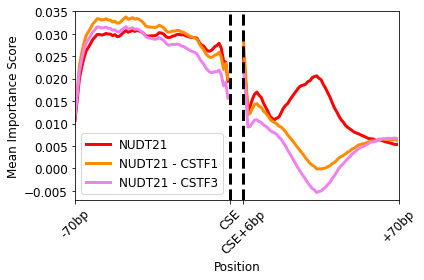

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


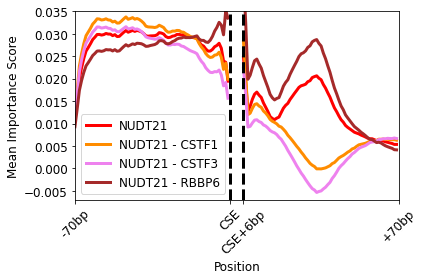

In [41]:
#Analysis 2: NUDT21 residuals - CSTF1/3 residuals

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_NUDT21_CSTF3_residuals'

filter_sites = False

filter_suffix = ''
if filter_sites :
    filter_suffix = '_filtered'

seq_start = 0
seq_end = 146

cell_type_1_ix = 0
cell_type_2_ix = 6
cell_type_2_index_other = [3, 4, 7]
colors_other = ['darkorange', 'violet', 'brown']

score_ix = 2

y_min = -0.007#-0.0105#
y_max = 0.035#0.038#

#Plot mean importance score across position

mean_scores = np.mean(flat_scores[cell_type_1_ix, score_ix, :, 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, :, 0, :146, :], axis=(0, 2))
if filter_sites :
    mean_scores = np.mean(flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))

ls = []

#All scores (NUDT21)
l1 = plt.plot(np.arange(mean_scores.shape[0])[:70], mean_scores[:70], color='red', linewidth=3, label='NUDT21')
plt.plot(np.arange(mean_scores.shape[0])[76:146], mean_scores[76:146], color='red', linewidth=3)

ls.append(l1[0])

for cell_type_2_ix_other, color_other in zip(cell_type_2_index_other[:-1], colors_other) :

    mean_res_scores = np.mean((flat_scores[cell_type_1_ix, score_ix, :, 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, :, 0, :146, :]) - (flat_scores[cell_type_1_ix, score_ix, :, 0, :146, :] - flat_scores[cell_type_2_ix_other, score_ix, :, 0, :146, :]), axis=(0, 2))
    if filter_sites :
        mean_res_scores = np.mean((flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :]) - (flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix_other, score_ix, flat_masks[score_ix] == 1., 0, :146, :]), axis=(0, 2))
    
    #Residual scores (NUDT21 - Other Perturbation)
    l1 = plt.plot(np.arange(mean_res_scores.shape[0])[:70], mean_res_scores[:70], color=color_other, linewidth=3, label='NUDT21 - ' + str(subset_cell_types[cell_type_2_ix_other]))
    plt.plot(np.arange(mean_res_scores.shape[0])[76:146], mean_res_scores[76:146], color=color_other, linewidth=3)

    ls.append(l1[0])

plt.axvline(x=70, color='black', linewidth=3, linestyle='--')
plt.axvline(x=76, color='black', linewidth=3, linestyle='--')

plt.xlim(0, 145)
if y_min is not None and y_max is not None :
    plt.ylim(y_min, y_max)

plt.xticks([0, 70, 76, 146], ["-70bp", "CSE", "CSE+6bp", "+70bp"], fontsize=12, rotation=45)
plt.yticks(fontsize=12)

plt.xlabel("Position", fontsize=12)
plt.ylabel("Mean Importance Score", fontsize=12)

plt.legend(handles=ls, fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism_scores" + filter_suffix + ".png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism_scores" + filter_suffix + ".eps")

plt.show()

#Plot mean importance score across position (w RBBP6 residual)

mean_scores = np.mean(flat_scores[cell_type_1_ix, score_ix, :, 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, :, 0, :146, :], axis=(0, 2))
if filter_sites :
    mean_scores = np.mean(flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :], axis=(0, 2))

ls = []

#All scores (NUDT21)
l1 = plt.plot(np.arange(mean_scores.shape[0])[:70], mean_scores[:70], color='red', linewidth=3, label='NUDT21')
plt.plot(np.arange(mean_scores.shape[0])[76:146], mean_scores[76:146], color='red', linewidth=3)

ls.append(l1[0])

for cell_type_2_ix_other, color_other in zip(cell_type_2_index_other, colors_other) :

    mean_res_scores = np.mean((flat_scores[cell_type_1_ix, score_ix, :, 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, :, 0, :146, :]) - (flat_scores[cell_type_1_ix, score_ix, :, 0, :146, :] - flat_scores[cell_type_2_ix_other, score_ix, :, 0, :146, :]), axis=(0, 2))
    if filter_sites :
        mean_res_scores = np.mean((flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :]) - (flat_scores[cell_type_1_ix, score_ix, flat_masks[score_ix] == 1., 0, :146, :] - flat_scores[cell_type_2_ix_other, score_ix, flat_masks[score_ix] == 1., 0, :146, :]), axis=(0, 2))
    
    #Residual scores (NUDT21 - Other Perturbation)
    l1 = plt.plot(np.arange(mean_res_scores.shape[0])[:70], mean_res_scores[:70], color=color_other, linewidth=3, label='NUDT21 - ' + str(subset_cell_types[cell_type_2_ix_other]))
    plt.plot(np.arange(mean_res_scores.shape[0])[76:146], mean_res_scores[76:146], color=color_other, linewidth=3)

    ls.append(l1[0])

plt.axvline(x=70, color='black', linewidth=3, linestyle='--')
plt.axvline(x=76, color='black', linewidth=3, linestyle='--')

plt.xlim(0, 145)
if y_min is not None and y_max is not None :
    plt.ylim(y_min, y_max)

plt.xticks([0, 70, 76, 146], ["-70bp", "CSE", "CSE+6bp", "+70bp"], fontsize=12, rotation=45)
plt.yticks(fontsize=12)

plt.xlabel("Position", fontsize=12)
plt.ylabel("Mean Importance Score", fontsize=12)

plt.legend(handles=ls, fontsize=12)

plt.tight_layout()

if save_figs :
    plt.savefig(fig_name + "_ism_scores_w_RBBP6" + filter_suffix + ".png", transparent=True, dpi=600)
    plt.savefig(fig_name + "_ism_scores_w_RBBP6" + filter_suffix + ".eps")

plt.show()


In [42]:
#Analysis 3.1: GT/CT/T-rich motif co-occurence test (NUDT21 vs CSTF3)

from scipy.stats import fisher_exact

pattern_index = [0, 4, 7, 8, 9, 12, 18, 19, 21, 25, 26, 31, 43, 46, 47, 50]
pattern_index_other = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37]

#Find matches for GT/CT/T-rich motifs in NUDT21
all_pwm_matches = []
all_pwm_match_poses = []

modisco_f = modisco_fs[0]

for pattern_ix in pattern_index :

    pwm_match_l = modisco_f['metacluster_idx_to_submetacluster_results']['metacluster_0']['seqlets_to_patterns_result']['patterns']["pattern_" + str(pattern_ix)]["seqlets_and_alnmts"]["seqlets"][()]#.keys()

    pwm_matches_t = [int(str(s).split("example:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    pwm_match_poses_t = [int(str(s).split("start:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    
    #print(len(pwm_matches))
    
    all_pwm_matches.extend(pwm_matches_t)
    all_pwm_match_poses.extend(pwm_match_poses_t)

pwm_matches = np.unique(all_pwm_matches).tolist()
not_pwm_matches = [i for i in np.arange(flat_ts.shape[0]).tolist() if i not in set(pwm_matches)]

pwm_match_index = all_pwm_matches
pwm_match_poses = all_pwm_match_poses

print(len(pwm_matches))
print(len(not_pwm_matches))

#Find matches for GT/CT/T-rich motifs in CSTF4
all_pwm_matches_other = []
all_pwm_match_poses_other = []

modisco_f = modisco_fs[1]

for pattern_ix in pattern_index_other :

    pwm_match_l = modisco_f['metacluster_idx_to_submetacluster_results']['metacluster_0']['seqlets_to_patterns_result']['patterns']["pattern_" + str(pattern_ix)]["seqlets_and_alnmts"]["seqlets"][()]#.keys()

    pwm_matches_t = [int(str(s).split("example:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    pwm_match_poses_t = [int(str(s).split("start:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    
    #print(len(pwm_matches))
    
    all_pwm_matches_other.extend(pwm_matches_t)
    all_pwm_match_poses_other.extend(pwm_match_poses_t)

pwm_matches_other = np.unique(all_pwm_matches_other).tolist()
not_pwm_matches_other = [i for i in np.arange(flat_ts.shape[0]).tolist() if i not in set(pwm_matches_other)]

pwm_match_index_other = all_pwm_matches_other
pwm_match_poses_other = all_pwm_match_poses_other

print(len(pwm_matches_other))
print(len(not_pwm_matches_other))

#Construct mask to extract select motif hits from importance scores
pwm_match_mask = np.zeros((flat_scores.shape[2], flat_scores.shape[4], flat_scores.shape[5]))
pwm_match_mask_other = np.zeros((flat_scores.shape[2], flat_scores.shape[4], flat_scores.shape[5]))

for pwm_match_ix, pwm_match_pos in zip(pwm_match_index, pwm_match_poses) :
    
    pwm_match_mask[pwm_match_ix, pwm_match_pos:pwm_match_pos+pattern_width, :] = 1.

for pwm_match_ix, pwm_match_pos in zip(pwm_match_index_other, pwm_match_poses_other) :
    
    pwm_match_mask_other[pwm_match_ix, pwm_match_pos:pwm_match_pos+pattern_width, :] = 1.

print("-----")

#Exact test - Motif co-occurrence anywhere in PAS

has_pwm_match = np.array(np.max(pwm_match_mask, axis=(1, 2)), dtype=np.bool)
has_pwm_match_other = np.array(np.max(pwm_match_mask_other, axis=(1, 2)), dtype=np.bool)

confusion_table = np.zeros((2, 2))

confusion_table[0, 0] = np.sum(has_pwm_match & has_pwm_match_other)
confusion_table[0, 1] = np.sum(has_pwm_match & ~has_pwm_match_other)

confusion_table[1, 0] = np.sum(~has_pwm_match & has_pwm_match_other)
confusion_table[1, 1] = np.sum(~has_pwm_match & ~has_pwm_match_other)

oddsr, p = fisher_exact(confusion_table, alternative='greater')

print(str(confusion_table))

print("odds ratio = " + str(oddsr))
print("p = " + str(p))

print("-----")

#Exact test - bp overlap of motif occurrences

has_bp_match = np.ravel(np.array(np.max(pwm_match_mask[:, :146, :], axis=2), dtype=np.bool))
has_bp_match_other = np.ravel(np.array(np.max(pwm_match_mask_other[:, :146, :], axis=2), dtype=np.bool))

confusion_table = np.zeros((2, 2))

confusion_table[0, 0] = np.sum(has_bp_match & has_bp_match_other)
confusion_table[0, 1] = np.sum(has_bp_match & ~has_bp_match_other)

confusion_table[1, 0] = np.sum(~has_bp_match & has_bp_match_other)
confusion_table[1, 1] = np.sum(~has_bp_match & ~has_bp_match_other)

oddsr, p = fisher_exact(confusion_table, alternative='greater')

print(str(confusion_table))

print("odds ratio = " + str(oddsr))
print("p = " + str(p))

print("-----")


3427
11337
6585
8179
-----
[[1801. 1626.]
 [4784. 6553.]]
odds ratio = 1.5171976751122027
p = 9.473409406613352e-27
-----


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:78: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:79: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: `np.bool` is a deprecated alias for the builti

[[   5333.   32282.]
 [  73058. 2044871.]]
odds ratio = 4.623909095217452
p = 0.0
-----


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


In [45]:
#Analysis 3.2: GT/CT/T-rich motif co-occurence test (NUDT21 vs CSTF3), distal sites only

from scipy.stats import fisher_exact

pattern_index = [0, 4, 7, 8, 9, 12, 18, 19, 21, 25, 26, 31, 43, 46, 47, 50]
pattern_index_other = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37]

score_ix = 2

#Find matches for GT/CT/T-rich motifs in NUDT21
all_pwm_matches = []
all_pwm_match_poses = []

modisco_f = modisco_fs[0]

for pattern_ix in pattern_index :

    pwm_match_l = modisco_f['metacluster_idx_to_submetacluster_results']['metacluster_0']['seqlets_to_patterns_result']['patterns']["pattern_" + str(pattern_ix)]["seqlets_and_alnmts"]["seqlets"][()]#.keys()

    pwm_matches_t = [int(str(s).split("example:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    pwm_match_poses_t = [int(str(s).split("start:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    
    #print(len(pwm_matches))
    
    all_pwm_matches.extend([match_i for match_i, match_pos in zip(pwm_matches_t, pwm_match_poses_t) if flat_masks[score_ix][match_i] == 1.])
    all_pwm_match_poses.extend([match_pos for match_i, match_pos in zip(pwm_matches_t, pwm_match_poses_t) if flat_masks[score_ix][match_i] == 1.])

pwm_matches = np.unique(all_pwm_matches).tolist()
not_pwm_matches = [i for i in np.arange(flat_ts.shape[0]).tolist() if i not in set(pwm_matches) and flat_masks[score_ix][i] == 1.]

pwm_match_index = all_pwm_matches
pwm_match_poses = all_pwm_match_poses

print(len(pwm_matches))
print(len(not_pwm_matches))

#Find matches for GT/CT/T-rich motifs in CSTF4
all_pwm_matches_other = []
all_pwm_match_poses_other = []

modisco_f = modisco_fs[1]

for pattern_ix in pattern_index_other :

    pwm_match_l = modisco_f['metacluster_idx_to_submetacluster_results']['metacluster_0']['seqlets_to_patterns_result']['patterns']["pattern_" + str(pattern_ix)]["seqlets_and_alnmts"]["seqlets"][()]#.keys()

    pwm_matches_t = [int(str(s).split("example:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    pwm_match_poses_t = [int(str(s).split("start:")[1].split(",")[0]) for s in pwm_match_l.tolist() if "rc:" in str(s)]
    
    #print(len(pwm_matches))
    
    all_pwm_matches_other.extend([match_i for match_i, match_pos in zip(pwm_matches_t, pwm_match_poses_t) if flat_masks[score_ix][match_i] == 1.])
    all_pwm_match_poses_other.extend([match_pos for match_i, match_pos in zip(pwm_matches_t, pwm_match_poses_t) if flat_masks[score_ix][match_i] == 1.])

pwm_matches_other = np.unique(all_pwm_matches_other).tolist()
not_pwm_matches_other = [i for i in np.arange(flat_ts.shape[0]).tolist() if i not in set(pwm_matches_other) and flat_masks[score_ix][i] == 1.]

pwm_match_index_other = all_pwm_matches_other
pwm_match_poses_other = all_pwm_match_poses_other

print(len(pwm_matches_other))
print(len(not_pwm_matches_other))

#Construct mask to extract select motif hits from importance scores
pwm_match_mask = np.zeros((flat_scores.shape[2], flat_scores.shape[4], flat_scores.shape[5]))
pwm_match_mask_other = np.zeros((flat_scores.shape[2], flat_scores.shape[4], flat_scores.shape[5]))

for pwm_match_ix, pwm_match_pos in zip(pwm_match_index, pwm_match_poses) :
    
    pwm_match_mask[pwm_match_ix, pwm_match_pos:pwm_match_pos+pattern_width, :] = 1.

for pwm_match_ix, pwm_match_pos in zip(pwm_match_index_other, pwm_match_poses_other) :
    
    pwm_match_mask_other[pwm_match_ix, pwm_match_pos:pwm_match_pos+pattern_width, :] = 1.

print("-----")

#Exact test - Motif co-occurrence anywhere in PAS

has_pwm_match = np.array(np.max(pwm_match_mask[flat_masks[score_ix] == 1., ...], axis=(1, 2)), dtype=np.bool)
has_pwm_match_other = np.array(np.max(pwm_match_mask_other[flat_masks[score_ix] == 1., ...], axis=(1, 2)), dtype=np.bool)

confusion_table = np.zeros((2, 2))

confusion_table[0, 0] = np.sum(has_pwm_match & has_pwm_match_other)
confusion_table[0, 1] = np.sum(has_pwm_match & ~has_pwm_match_other)

confusion_table[1, 0] = np.sum(~has_pwm_match & has_pwm_match_other)
confusion_table[1, 1] = np.sum(~has_pwm_match & ~has_pwm_match_other)

oddsr, p = fisher_exact(confusion_table, alternative='greater')

print(str(confusion_table))

print("odds ratio = " + str(oddsr))
print("p = " + str(p))

print("-----")

#Exact test - bp overlap of motif occurrences

has_bp_match = np.ravel(np.array(np.max(pwm_match_mask[flat_masks[score_ix] == 1., :146, :], axis=2), dtype=np.bool))
has_bp_match_other = np.ravel(np.array(np.max(pwm_match_mask_other[flat_masks[score_ix] == 1., :146, :], axis=2), dtype=np.bool))

confusion_table = np.zeros((2, 2))

confusion_table[0, 0] = np.sum(has_bp_match & has_bp_match_other)
confusion_table[0, 1] = np.sum(has_bp_match & ~has_bp_match_other)

confusion_table[1, 0] = np.sum(~has_bp_match & has_bp_match_other)
confusion_table[1, 1] = np.sum(~has_bp_match & ~has_bp_match_other)

oddsr, p = fisher_exact(confusion_table, alternative='greater')

print(str(confusion_table))

print("odds ratio = " + str(oddsr))
print("p = " + str(p))

print("-----")


1208
4059
2578
2689
-----
[[ 698.  510.]
 [1880. 2179.]]
odds ratio = 1.5862974551522737
p = 1.5528266273417166e-12
-----
[[  1864.  11367.]
 [ 29142. 726609.]]
odds ratio = 4.088664420351136
p = 0.0
-----


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:80: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:81: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builti

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
ref score = -0.3834


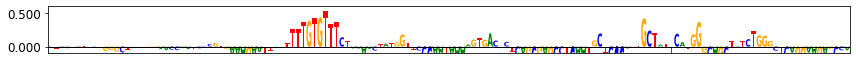

var score = -0.1996


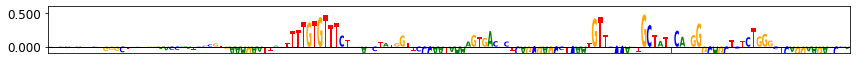

delta = 0.1838


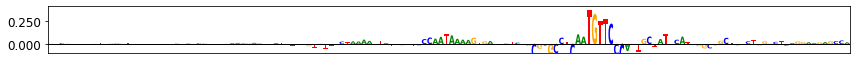

Null distributions:
Empirical p = 0.059


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


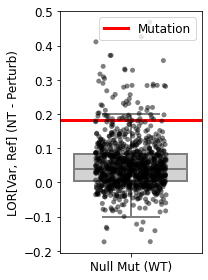

Empirical p = 0.072 (scrambled)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


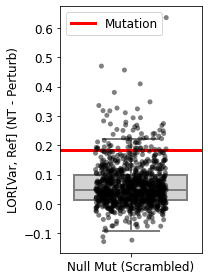

---
Null distributions (all perturbations):
cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.042, 0.095, 0.067, 0.059, 0.033, 0.073, 0.808, 0.063, 0.037, 0.105]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


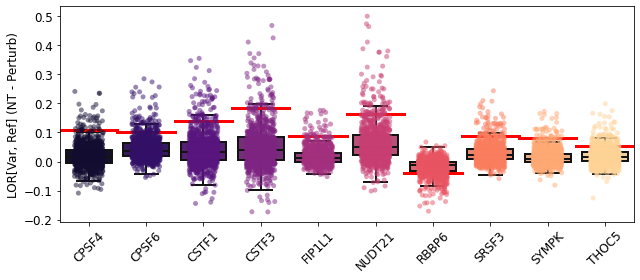

cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.051, 0.132, 0.087, 0.072, 0.05, 0.103, 0.833, 0.067, 0.045, 0.128]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


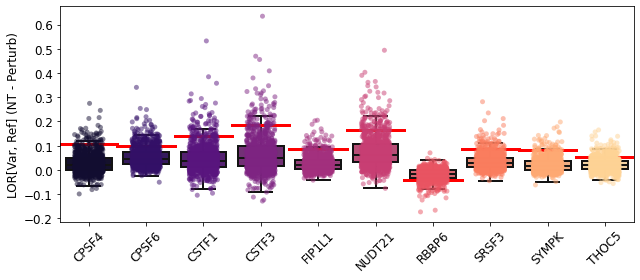

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
ref score = 0.4347


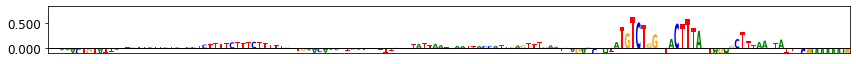

var score = 0.6674


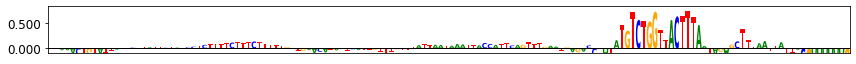

delta = 0.2327


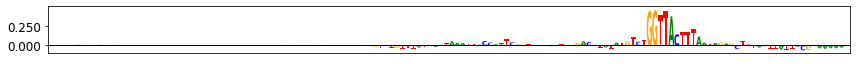

Null distributions:
Empirical p = 0.094


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


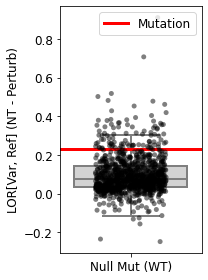

Empirical p = 0.08 (scrambled)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


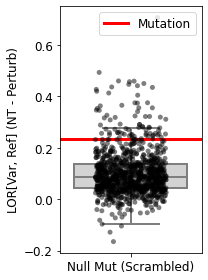

---
Null distributions (all perturbations):
cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.097, 0.157, 0.087, 0.094, 0.147, 0.164, 0.924, 0.082, 0.156, 0.107]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


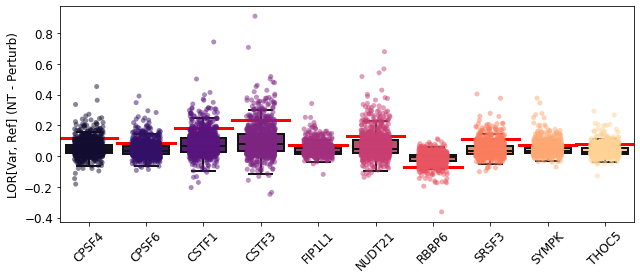

cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.102, 0.196, 0.079, 0.08, 0.178, 0.213, 0.938, 0.083, 0.185, 0.118]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


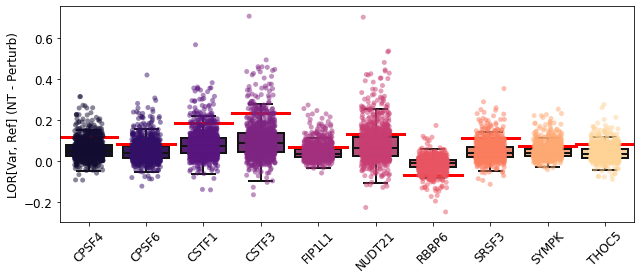

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
ref score = 0.4347


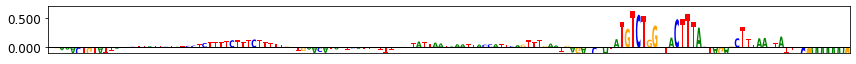

var score = 0.2463


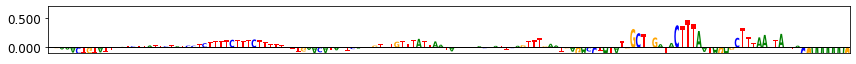

delta = -0.1884


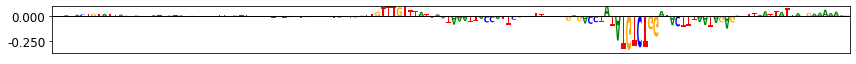

Null distributions:
Empirical p = 0.075


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


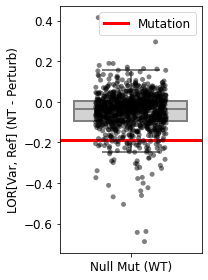

Empirical p = 0.084 (scrambled)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


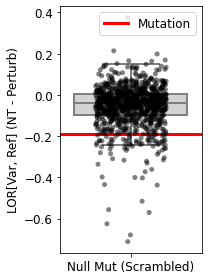

---
Null distributions (all perturbations):
cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.047, 0.024, 0.118, 0.075, 0.056, 0.026, 0.958, 0.027, 0.053, 0.011]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


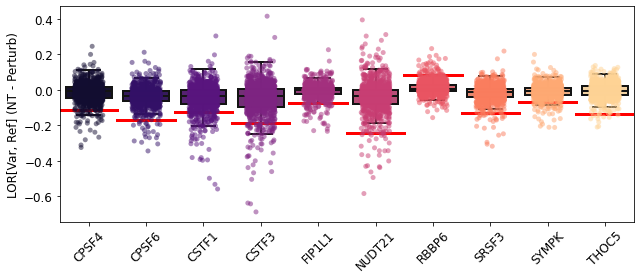

cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.065, 0.038, 0.134, 0.084, 0.073, 0.039, 0.96, 0.031, 0.074, 0.016]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


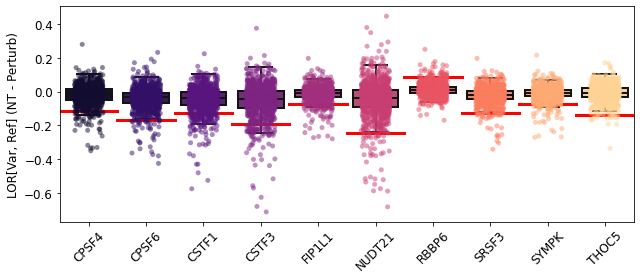

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 3ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
ref score = 1.4233


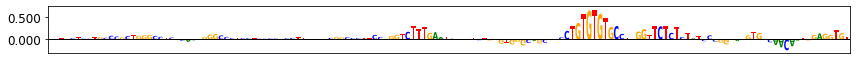

var score = 1.4817


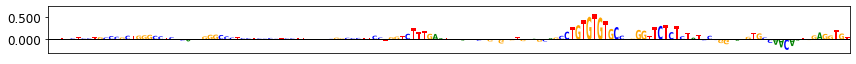

delta = 0.0584


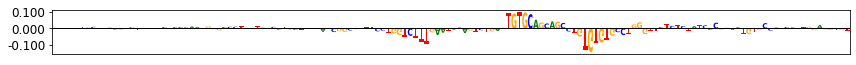

Null distributions:
Empirical p = 0.359


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


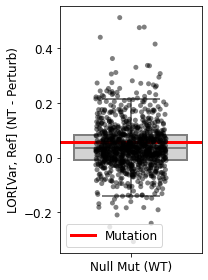

Empirical p = 0.395 (scrambled)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


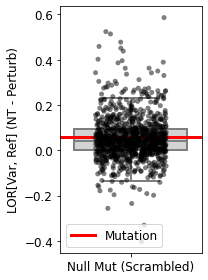

---
Null distributions (all perturbations):
cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.812, 0.701, 0.237, 0.359, 0.195, 0.656, 0.963, 0.33, 0.757, 0.828]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


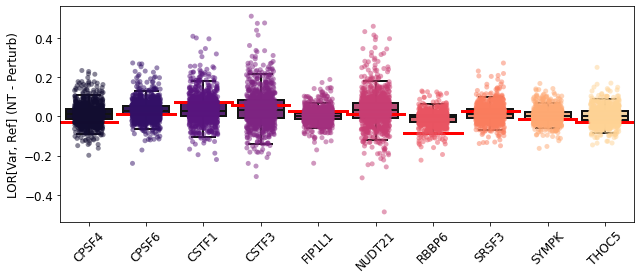

cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.833, 0.702, 0.257, 0.395, 0.281, 0.671, 0.951, 0.397, 0.769, 0.817]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


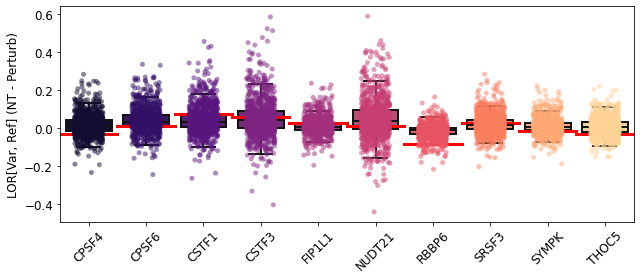

In [25]:
#Analysis 4: Interpret pathogenic APA variants through perturbations (w null distributions)

#Interpret CSTF3 variants (pathogenic and hypothetical)

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_CSTF3'

#Example:F2 gene, pathogenic
var_name = "F2_patho"

seq_ref = "CTCATATTCTGGGCTCCTGGAACCAATCCCGTGAAAGAATTATTTTTGTGTTTCTAAAACTATGGTTCCCAATAAAAGTGACTCTCAGCGAGCCTCAATGCTCCCAGTGCTATTCATGGGCAGCTCTCTGGGCTCAGGAAGAGCCAGTAATACTACTGGATAAAGAAGACTTAAGAATCCACCACCTGGTGCACGCTGGTAGTCC"
seq_var = "CTCATATTCTGGGCTCCTGGAACCAATCCCGTGAAAGAATTATTTTTGTGTTTCTAAAACTATGGTTCCCAATAAAAGTGACTCTCAGCGAGCCTCAATGTTCCCAGTGCTATTCATGGGCAGCTCTCTGGGCTCAGGAAGAGCCAGTAATACTACTGGATAAAGAAGACTTAAGAATCCACCACCTGGTGCACGCTGGTAGTCC"

_interpret_mutant(seq_ref, seq_var, cell_type_2_ix=4, score_ix=2, seq_start=0, seq_end=146, scramble_start=76, scramble_end=146, lof_or_gof='gof', save_figs=save_figs, fig_name=fig_name + "_" + var_name)

#Example:FOXC1 gene, pathogenic
var_name = "FOXC1_patho"

seq_ref = "GGAAACTGTATTAATCTTATTCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCACCTAAATCTCTGAAAAATGGA"
seq_var = "GGAAACTGTATTAATCTTATTCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGTTACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCACCTAAATCTCTGAAAAATGGA"

_interpret_mutant(seq_ref, seq_var, cell_type_2_ix=4, score_ix=2, seq_start=0, seq_end=146, scramble_start=76, scramble_end=146, lof_or_gof='gof', save_figs=save_figs, fig_name=fig_name + "_" + var_name)

#Example:FOXC1 gene, hypothetical
var_name = "FOXC1_hypo"

seq_ref = "GGAAACTGTATTAATCTTATTCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCACCTAAATCTCTGAAAAATGGA"
seq_var = "GGAAACTGTATTAATCTTATTCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGGCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCACCTAAATCTCTGAAAAATGGA"

_interpret_mutant(seq_ref, seq_var, cell_type_2_ix=4, score_ix=2, seq_start=0, seq_end=146, scramble_start=76, scramble_end=146, lof_or_gof='lof', save_figs=save_figs, fig_name=fig_name + "_" + var_name)

#Example:HBA2 gene, pathogenic
var_name = "HBA2_patho"

seq_ref = "GTTCCTCCTGCCCGCTGGGCCTCCCAACGGGCCCTCCTCCCCTCCTTGCACCGGCCCTTCCTGGTCTTTGAATAAAGTCTGAGTGGGCAGCAGCCTGTGTGTGCCTGGGTTCTCTCTATCCCGGAATGTGCCAACAATGGAGGTGTTTACCTGTCTCAGACCAAGGACCTCTCTGCAGCTGCATGGGGCTGGGGAGGGAGAACTG"
seq_var = "GTTCCTCCTGCCCGCTGGGCCTCCCAACGGGCCCTCCTCCCCTCCTTGCACCGGCCCTTCCTGGTCTTTGAATAAAGTCTGAGTGTGCAGCAGCCTGTGTGTGCCTGGGTTCTCTCTATCCCGGAATGTGCCAACAATGGAGGTGTTTACCTGTCTCAGACCAAGGACCTCTCTGCAGCTGCATGGGGCTGGGGAGGGAGAACTG"

_interpret_mutant(seq_ref, seq_var, cell_type_2_ix=4, score_ix=2, fixed_y_min=None, seq_start=0, seq_end=146, scramble_start=76, scramble_end=146, lof_or_gof='gof', save_figs=save_figs, fig_name=fig_name + "_" + var_name)


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
ref score = -0.3834


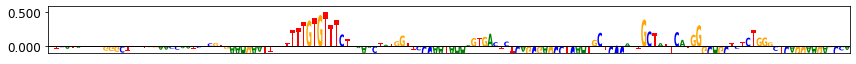

var score = -0.1996


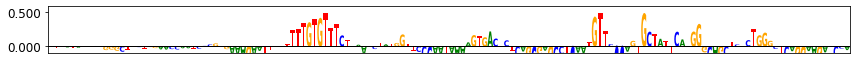

delta = 0.1838


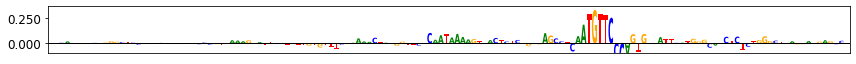

Null distributions:
Empirical p = 0.036


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


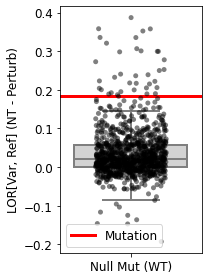

Empirical p = 0.043 (scrambled)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


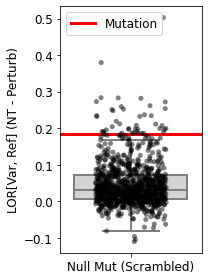

---
Null distributions (all perturbations):
cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.057, 0.257, 0.043, 0.036, 0.113, 0.239, 0.901, 0.05, 0.095, 0.365]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


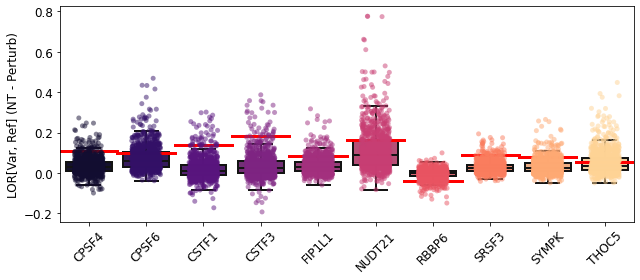

cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.089, 0.323, 0.045, 0.043, 0.158, 0.305, 0.924, 0.059, 0.131, 0.407]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


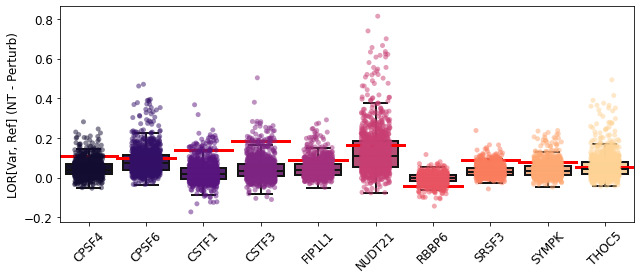

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
ref score = 0.4347


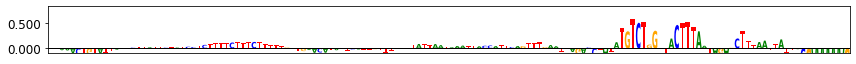

var score = 0.6674


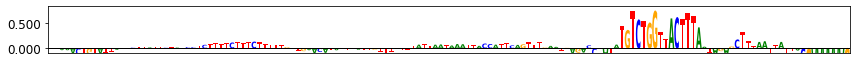

delta = 0.2327


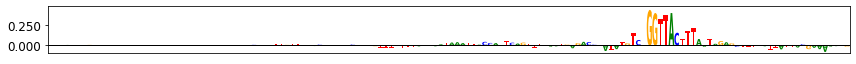

Null distributions:
Empirical p = 0.046


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


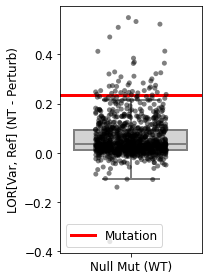

Empirical p = 0.035 (scrambled)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


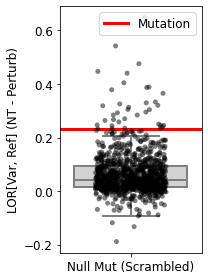

---
Null distributions (all perturbations):
cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.072, 0.18, 0.046, 0.046, 0.155, 0.2, 0.958, 0.055, 0.165, 0.165]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


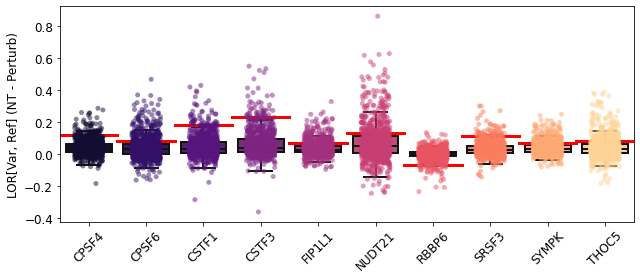

cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.093, 0.236, 0.033, 0.035, 0.216, 0.269, 0.975, 0.053, 0.206, 0.18]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


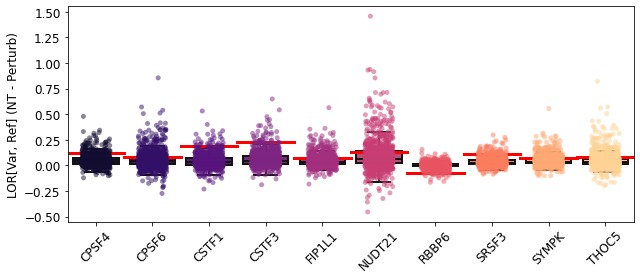

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
ref score = 0.4347


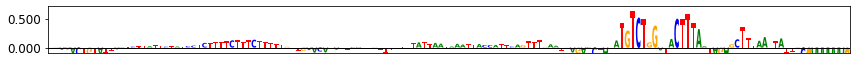

var score = 0.2463


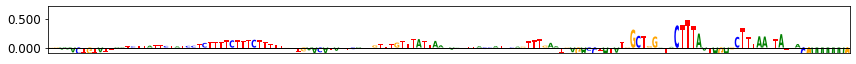

delta = -0.1884


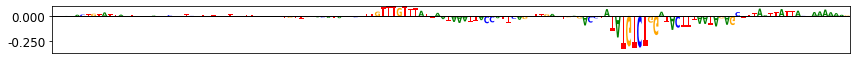

Null distributions:
Empirical p = 0.038


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


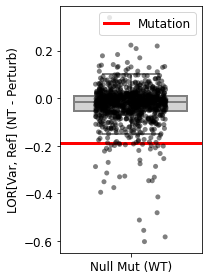

Empirical p = 0.047 (scrambled)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


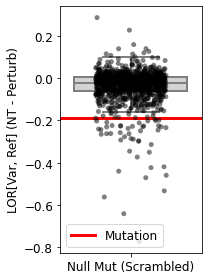

---
Null distributions (all perturbations):
cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.062, 0.092, 0.067, 0.038, 0.14, 0.108, 0.979, 0.024, 0.117, 0.104]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


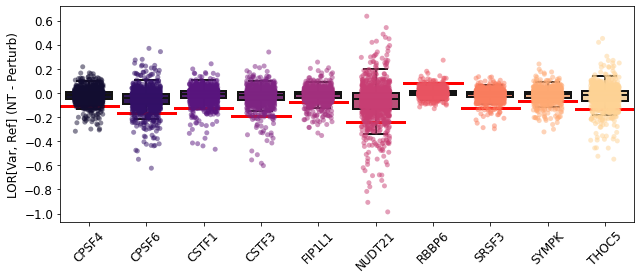

cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.093, 0.132, 0.064, 0.047, 0.195, 0.15, 0.978, 0.031, 0.163, 0.112]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


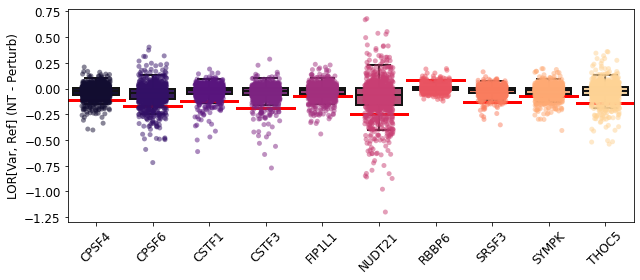

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 2ms/step
Processing example 0...
1/1 [==============================] - 0s 1ms/step
Processing example 0...
ref score = 1.4233


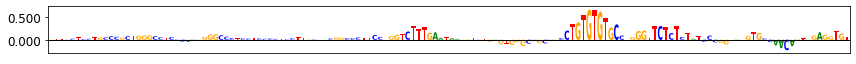

var score = 1.4817


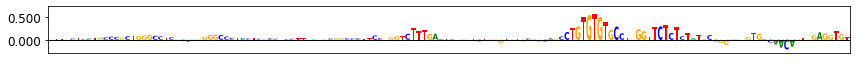

delta = 0.0584


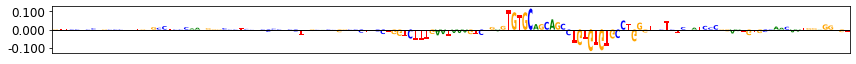

Null distributions:
Empirical p = 0.229


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


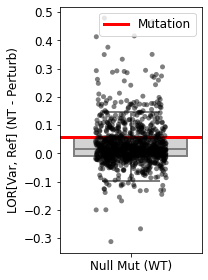

Empirical p = 0.309 (scrambled)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


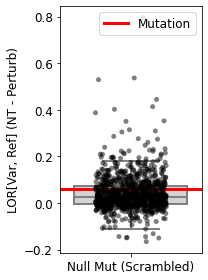

---
Null distributions (all perturbations):
cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.861, 0.704, 0.148, 0.229, 0.36, 0.689, 0.976, 0.331, 0.787, 0.815]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


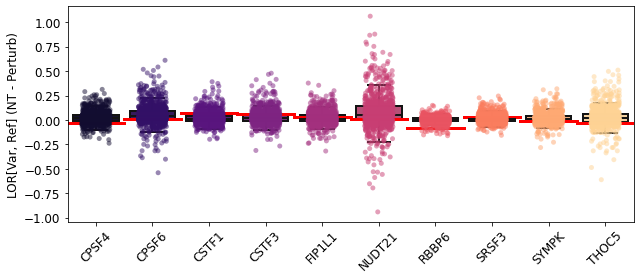

cell_types = ['CPSF4', 'CPSF6', 'CSTF1', 'CSTF3', 'FIP1L1', 'NUDT21', 'RBBP6', 'SRSF3', 'SYMPK', 'THOC5']
Empirical p = [0.896, 0.746, 0.178, 0.309, 0.46, 0.725, 0.983, 0.392, 0.817, 0.838]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


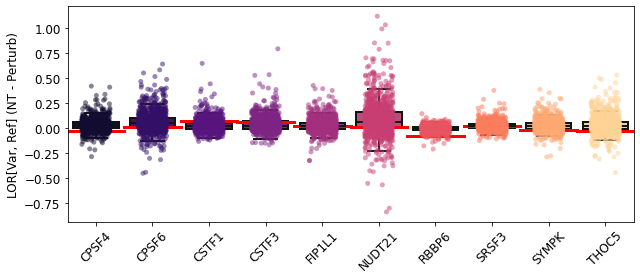

In [26]:
#Interpret CSTF3 variants (pathogenic and hypothetical), consider entire sequence for null mutations

save_figs = True
fig_name='apa_perturb_10_figures/apa_perturb_CSTF3'

#Example:F2 gene, pathogenic
var_name = "F2_patho_full_scramble"

seq_ref = "CTCATATTCTGGGCTCCTGGAACCAATCCCGTGAAAGAATTATTTTTGTGTTTCTAAAACTATGGTTCCCAATAAAAGTGACTCTCAGCGAGCCTCAATGCTCCCAGTGCTATTCATGGGCAGCTCTCTGGGCTCAGGAAGAGCCAGTAATACTACTGGATAAAGAAGACTTAAGAATCCACCACCTGGTGCACGCTGGTAGTCC"
seq_var = "CTCATATTCTGGGCTCCTGGAACCAATCCCGTGAAAGAATTATTTTTGTGTTTCTAAAACTATGGTTCCCAATAAAAGTGACTCTCAGCGAGCCTCAATGTTCCCAGTGCTATTCATGGGCAGCTCTCTGGGCTCAGGAAGAGCCAGTAATACTACTGGATAAAGAAGACTTAAGAATCCACCACCTGGTGCACGCTGGTAGTCC"

_interpret_mutant(seq_ref, seq_var, cell_type_2_ix=4, score_ix=2, seq_start=0, seq_end=146, scramble_start=0, scramble_end=146, lof_or_gof='gof', save_figs=save_figs, fig_name=fig_name + "_" + var_name)

#Example:FOXC1 gene, pathogenic
var_name = "FOXC1_patho_full_scramble"

seq_ref = "GGAAACTGTATTAATCTTATTCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCACCTAAATCTCTGAAAAATGGA"
seq_var = "GGAAACTGTATTAATCTTATTCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGTTACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCACCTAAATCTCTGAAAAATGGA"

_interpret_mutant(seq_ref, seq_var, cell_type_2_ix=4, score_ix=2, seq_start=0, seq_end=146, scramble_start=0, scramble_end=146, lof_or_gof='gof', save_figs=save_figs, fig_name=fig_name + "_" + var_name)

#Example:FOXC1 gene, hypothetical
var_name = "FOXC1_hypo_full_scramble"

seq_ref = "GGAAACTGTATTAATCTTATTCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGTCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCACCTAAATCTCTGAAAAATGGA"
seq_var = "GGAAACTGTATTAATCTTATTCTATCCTCTTTTCTTTCTTTTTGTTGAACATATTCATTGTTTGTTTATTAATAAATTACCATTCAGTTTGAATGAGACCTATATGGCTGGATACTTTAATAGAGCTTTAATTATTACGAAAAAAGATTTCAGAGATAAAACACTAGAAGTTACCTATTCTCCACCTAAATCTCTGAAAAATGGA"

_interpret_mutant(seq_ref, seq_var, cell_type_2_ix=4, score_ix=2, seq_start=0, seq_end=146, scramble_start=0, scramble_end=146, lof_or_gof='lof', save_figs=save_figs, fig_name=fig_name + "_" + var_name)

#Example:HBA2 gene, pathogenic
var_name = "HBA2_patho_full_scramble"

seq_ref = "GTTCCTCCTGCCCGCTGGGCCTCCCAACGGGCCCTCCTCCCCTCCTTGCACCGGCCCTTCCTGGTCTTTGAATAAAGTCTGAGTGGGCAGCAGCCTGTGTGTGCCTGGGTTCTCTCTATCCCGGAATGTGCCAACAATGGAGGTGTTTACCTGTCTCAGACCAAGGACCTCTCTGCAGCTGCATGGGGCTGGGGAGGGAGAACTG"
seq_var = "GTTCCTCCTGCCCGCTGGGCCTCCCAACGGGCCCTCCTCCCCTCCTTGCACCGGCCCTTCCTGGTCTTTGAATAAAGTCTGAGTGTGCAGCAGCCTGTGTGTGCCTGGGTTCTCTCTATCCCGGAATGTGCCAACAATGGAGGTGTTTACCTGTCTCAGACCAAGGACCTCTCTGCAGCTGCATGGGGCTGGGGAGGGAGAACTG"

_interpret_mutant(seq_ref, seq_var, cell_type_2_ix=4, score_ix=2, fixed_y_min=None, seq_start=0, seq_end=146, scramble_start=0, scramble_end=146, lof_or_gof='gof', save_figs=save_figs, fig_name=fig_name + "_" + var_name)
